In [1]:
# Importing necessary libraries to conduct our analysis
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")
from IPython.display import HTML,display

warnings.filterwarnings("ignore")


In [2]:
    import pandas as pd
    import numpy as np
    import seaborn as sns;
    from sklearn import preprocessing
    from sklearn.metrics import accuracy_score
    from sklearn.preprocessing import StandardScaler
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow import keras
    from numpy import array
    from keras.models import Sequential
    from keras.layers import LSTM
    from keras.layers import Dense
    from keras import optimizers
    from sklearn.preprocessing import MinMaxScaler
    from sklearn.metrics import mean_squared_error
    import warnings
    import matplotlib.pyplot as plt

    # Suppress matplotlib warnings
    warnings.filterwarnings("ignore")

In [3]:
def computeSarima(dv):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns
    from statsmodels.tsa.statespace.sarimax import SARIMAX
    from pmdarima import auto_arima
    from sklearn.metrics import mean_squared_error
    
    city = dv['Location'].unique()
    
    # Ensure the 'date' column is in datetime format
    dv['date'] = pd.to_datetime(dv['date'])
    
    # Filter the data up to a specific date
    df = dv[dv['date'] <= '2024-03-01']
    
    # Prepare the final DataFrame
    final_df = df[['date', 'AQI']].resample('M', on='date').mean()
    final_df = final_df.fillna(method='ffill').fillna(method='bfill')
    
    # Plot the AQI time series
    ax = final_df[['AQI']].plot(figsize=(12, 8), grid=True, lw=2, color='Red')
    ax.autoscale(enable=True, axis='both', tight=True)
    plt.xlabel('YEAR')
    plt.ylabel('AQI')
    plt.title(f"Monthly AQI of {city[0]}")
    plt.show()
    
    # Plot the AQI range using a boxplot
    plt.figure(figsize=(20, 8))
    plt.xticks(rotation=90)
    bplot = sns.boxplot(data=final_df, width=0.75, palette="GnBu_d")
    plt.ylabel('AQI')
    plt.title(f"AQI Range of {city[0]}")
    bplot.grid(True)
    plt.show()
    
    # Decompose the AQI time series
    AQI = final_df['AQI']
    
     # Split the data into training and testing sets
    split_index = int(len(AQI) * 0.8)
    train = AQI[:split_index]
    test = AQI[split_index:]  #  the last 20% entirely
    star = split_index
    en = len(AQI)  #  to point to the end of the AQI series
    
    try:
        # Determine the best ARIMA model order
        model = auto_arima(train, start_p=0, start_q=0, m=12, seasonal=True, trace=False)
        best_order = model.order
        best_seasonal_order = model.seasonal_order
        
        # Fit the SARIMA model
        sarima = SARIMAX(train, order=best_order, seasonal_order=best_seasonal_order)
        predicted = sarima.fit()
        
        # Predict on the test data
        predictions = predicted.predict(start=star, end=en-1, typ='levels').rename('Predictions')
        
        # Calculate RMSE
        RMSE = np.sqrt(mean_squared_error(predictions, test))
        
        # Calculate MAPE
        MAPE = np.mean(np.abs((test - predictions) / test)) * 100
        
        print('RMSE = ', RMSE)
        print('MAPE = ', MAPE)
        print('Mean AQI', test.mean())
        
        # Plotting the predictions on test data
        plt.figure(figsize=(20, 8))
        predictions.plot(legend=True, label='Predictions')
        test.plot(legend=True, label='Test Data')
        plt.title(f"Prediction on test data of {city[0]}")
        plt.ylabel("AQI")
        plt.legend()
        plt.show()
        
        # Fit the model on the full dataset
        model = auto_arima(AQI, start_p=0, start_q=0, m=12, seasonal=True, trace=False)
        best_order = model.order
        best_seasonal_order = model.seasonal_order
        
        sarima = SARIMAX(AQI, order=best_order, seasonal_order=best_seasonal_order)
        results = sarima.fit()
        
        # Predict future values
        le = len(AQI) - 1
        predictions = results.predict(start=le-20, end=le+5, typ='levels').rename('Future Predictions')
        
        # Plotting predicted values against the true values
        predictions.plot(legend=True)
        AQI.plot(legend=True, figsize=(12, 8), grid=True)
        plt.title(f"Prediction of True data and Future Prediction of {city[0]}")
        plt.xlabel("YEAR")
        plt.ylabel("AQI")
        plt.show()
        
        return RMSE, MAPE
    except np.linalg.LinAlgError as e:
        print(f"LinAlgError for {city[0]}: {e}")
        return np.nan, np.nan
    except Exception as e:
        print(f"Error for {city[0]}: {e}")
        return np.nan, np.nan


In [4]:
def computePROPHET(dv):
    import pandas as pd
    from prophet import Prophet

    import numpy as np
    from sklearn.metrics import mean_squared_error
    from matplotlib import pyplot as plt

    dv['date'] = pd.to_datetime(dv['date'])
    dv['Location'] = dv['Location'].astype("string")
    dv['ds'] = dv['date']
    dv['y'] = dv['AQI']

    final_df = dv[['date', 'AQI']].resample('M', on='date').mean()
    final_df = final_df.fillna(method='ffill').fillna(method='bfill')

    df = dv
    df['date'] = pd.to_datetime(df['date'])

    mask = (df['date'] >= '2021-07-01') & (df['date'] < '2023-07-01')
    test, train = df.loc[mask], df.loc[df['date'] < '2023-01-01']

    m1 = Prophet(yearly_seasonality=700)
    m1.fit(df)
    fcast1 = m1.predict(test)

    mse = mean_squared_error(fcast1['yhat'].to_numpy(), test['y'].to_numpy())
    rmse = np.sqrt(mse)

    # Calculate MAPE
    mape = np.mean(np.abs((test['y'].to_numpy() - fcast1['yhat'].to_numpy()) / test['y'].to_numpy())) * 100

    print("Root Mean Squared Error:", rmse)
    print("Mean Absolute Percentage Error (MAPE):", mape)

    # Plot the forecasted values
    fig1 = m1.plot(fcast1)

    plt.title('AQI Forecast')
    plt.xlabel('Date')
    plt.ylabel('AQI')
    plt.text(0.5, 0.95, df['Location'].iloc[0], horizontalalignment='center', verticalalignment='center', transform=fig1.transFigure, fontsize=12)
    plt.legend(['Actual', 'Forecast', 'Future Forecast Range'], loc='upper left')
    plt.show()

    m = Prophet(yearly_seasonality=10)
    m.fit(df)

    future = m.make_future_dataframe(periods=365)
    forecast = m.predict(future)

    # Plot the forecasted values with city name label
    fig2 = m.plot(forecast)
    plt.title('AQI Forecast')
    plt.xlabel('Date')
    plt.ylabel('AQI')
    plt.text(0.5, 0.95, df['Location'].iloc[0], horizontalalignment='center', verticalalignment='center', transform=fig2.transFigure, fontsize=12)
    plt.legend(['Actual', 'Forecast', 'Future Forecast Range'], loc='upper left')
    plt.show()


    # Plot the trend component
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))
    ax.plot(forecast['ds'], forecast['trend'])
    ax.set_title('Trend')
    ax.set_xlabel('Date')
    ax.set_ylabel('Trend')
    plt.show()

    # Plot the yearly component
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))
    ax.plot(forecast['ds'], forecast['yearly'])
    ax.set_title('Yearly Seasonality')
    ax.set_xlabel('Date')
    ax.set_ylabel('Yearly')
    plt.show()
    
    return rmse,mape


In [5]:
def split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return array(X),array(y)

def computeLSTM(dv):
    from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

    # Assuming dv is a DataFrame with a 'date' column and a 'AQI' column

    dv['date'] = pd.to_datetime(dv['date'])
    dv.set_index('date', inplace=True)

    # Truncate DataFrame up to date 10-3-2024
    df = dv.loc[:'2024-03-10', ['AQI']]  # Adjust the date format if needed

    # Normalizing data
    scaler = MinMaxScaler()
    df['AQI'] = scaler.fit_transform(df[['AQI']])

    # Splitting data into train and test sets
    split_index = int(len(df) * 0.8)
    train_data, test_data = df.iloc[:split_index], df.iloc[split_index:]

    # Preparing data for LSTM
    n_steps = 3
    X_train, y_train = split_sequence(train_data['AQI'], n_steps)
    X_test, y_test = split_sequence(test_data['AQI'], n_steps)

    n_features = 1
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], n_features))
    X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], n_features))

    # Define and compile the LSTM model
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=(n_steps, n_features)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])

    # Fit the model
    history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, verbose=1)

    # Make predictions for the test set
    yhat = model.predict(X_test, verbose=0)

    # Invert scaling for forecast
    yhat = scaler.inverse_transform(yhat.reshape(-1, 1)).flatten()

    # Invert scaling for actual
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_inv, yhat))
    print('Test RMSE: %.3f' % rmse)
    mape = mean_absolute_percentage_error(y_test_inv, yhat) * 100
    print(f'Test MAPE: {mape:.3f}%')
    
    # Plotting results
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_inv, label='Actual')
    plt.plot(yhat, label='Predicted')
    plt.legend()
    plt.show()

    
    # Future prediction
    future_steps=100
    X_future = df.iloc[-n_steps:].values.reshape((1, n_steps, n_features))
    future_predictions = []
    for i in range(future_steps):
        future_prediction = model.predict(X_future, verbose=0)[0, 0]
        future_predictions.append(future_prediction)
        # Update X_future with the new prediction and remove the oldest value
        X_future = np.roll(X_future, -1)
        X_future[0, -1, 0] = future_prediction

    # Invert scaling for future predictions
    future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1)).flatten()

    # Plotting results
    plt.figure(figsize=(12, 6))
    plt.plot(df.index[-len(y_test_inv):], y_test_inv, label='Actual')
    plt.plot(df.index[-len(y_test_inv):], yhat, label='Predicted')
    plt.plot(pd.date_range(df.index[-1], periods=future_steps + 1, freq='D')[1:], future_predictions, label='Future Prediction')
    plt.legend()
    plt.show()
    
    return rmse,mape


In [6]:
def computeLR(dv):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    from sklearn.model_selection import train_test_split
    from sklearn.linear_model import LinearRegression
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    
    # Extract city name(s) from the data
    city = dv['Location'].unique()

    # Drop the 'Location' column as it is not needed for regression
    dv.drop(columns=['Location'], inplace=True)

    # Convert 'date' column to datetime format
    dv['date'] = pd.to_datetime(dv['date'])

    # Find the minimum date
    min_date = dv['date'].min()

    # Convert the 'date' column to numeric (number of days since min_date)
    dv['date_numeric'] = (dv['date'] - min_date).dt.days

    # Extract day, month, and year into separate columns
    dv['day'] = dv['date'].dt.day
    dv['month'] = dv['date'].dt.month
    dv['year'] = dv['date'].dt.year

    # Select relevant columns for regression
    df = dv[['day', 'month', 'year', 'AQI']]

    # Define the independent (X) and dependent (Y) variables
    X = df.drop(['AQI'], axis=1)  # Independent variables
    Y = df['AQI']  # Dependent variable

    # Split the data into training and testing sets
    x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=1)

    # Create and train the linear regression model
    model = LinearRegression()
    model.fit(x_train, y_train)

    # Make predictions using the testing set
    y_pred = model.predict(x_test)

    # Calculate performance metrics
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r_squared = r2_score(y_test, y_pred)
    n = len(Y)
    k = X.shape[1]
    adjusted_r_squared = 1 - (1 - r_squared) * (n - 1) / (n - k - 1)
    
    # Calculate MAPE
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

    # Print performance metrics including MAPE
    print('PERFORMANCE')
    print("The mean squared error is:", mse)
    print("The mean absolute error is:", mae)
    print("The root mean squared error is:", rmse)
    print("R-squared (R²):", r_squared)
    print("Adjusted R-squared (adjusted R²):", adjusted_r_squared)
    print("Mean Absolute Percentage Error (MAPE):", mape)

    # Plot actual vs predicted AQI values
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred, c='red', label='Predicted', alpha=0.5)
    plt.scatter(y_test, y_test, c='blue', label='Actual', alpha=0.5)
    plt.xlabel('Actual AQI')
    plt.ylabel('Predicted AQI')
    plt.title(f'Actual vs Predicted AQI for {city[0]}')
    plt.legend()
    plt.show()

    # Combine x_test and y_test into a single DataFrame for plotting
    predicted_df = pd.concat([x_test, y_test], axis=1)
    predicted_df['predicted_AQI'] = y_pred
    predicted_df['Date'] = dv.loc[x_test.index, 'date']
    predicted_df.set_index('Date', inplace=True)

    # Plot the actual and predicted AQI values over time
    plt.figure(figsize=(10, 6))
    plt.title(f'AQI Predictions for {city[0]}')
    predicted_df['AQI'].plot(legend=True, label='Actual AQI')
    predicted_df['predicted_AQI'].plot(legend=True, label='Predicted AQI')
    plt.xlabel('Date')
    plt.ylabel('AQI')
    plt.legend()
    plt.grid(True)
    plt.show()


    # Predicting future values
    # Define the future dates (example: next 10 days from the max date in the dataset)
    future_dates = pd.date_range(start=dv['date'].max() + pd.Timedelta(days=1), periods=200, freq='D')

    # Extract day and month for future dates
    future_days = future_dates.day
    future_months = future_dates.month
    future_year = future_dates.year
    # Create a DataFrame for future dates
    future_df = pd.DataFrame({'day': future_days, 'month': future_months, 'year':future_year})

    # Use the trained model to predict future AQI values
    future_predictions = model.predict(future_df)

    # Create a DataFrame for future predictions
    future_predictions_df = pd.DataFrame({'Date': future_dates, 'Predicted_AQI': future_predictions})

    # Plot historical AQI values and future predictions
    plt.figure(figsize=(12, 6))
    plt.plot(dv['date'], dv['AQI'], label='Historical AQI', color='blue')
    plt.plot(future_predictions_df['Date'], future_predictions_df['Predicted_AQI'], label='Predicted AQI', color='red')

    # Formatting the plot
    plt.xlabel('Date')
    plt.ylabel('AQI')
    plt.title('Historical and Future Predicted AQI Values')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()

    # Display the plot
    plt.show()

    return rmse,mape


In [7]:

def computePR(df):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    from sklearn.model_selection import train_test_split
    from sklearn.linear_model import LinearRegression
    from sklearn.preprocessing import PolynomialFeatures
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    import os
    import warnings
    
    warnings.filterwarnings("ignore")

    # Extract city name(s) from the data
    city = df['Location'].unique()

    # Drop the 'Location' column as it is not needed for regression
    df.drop(columns=['Location'], inplace=True)

    # Convert 'date' column to datetime format
    df['date'] = pd.to_datetime(df['date'])

    # Find the minimum date
    min_date = df['date'].min()

    # Convert the 'date' column to numeric (number of days since min_date)
    df['date_numeric'] = (df['date'] - min_date).dt.days

    # Extract day, month, and year into separate columns
    df['day'] = df['date'].dt.day
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year

    # Select relevant columns for regression
    data = df[['day', 'month', 'year', 'AQI']]

    # Define the independent (X) and dependent (Y) variables
    X = data.drop(['AQI'], axis=1)  # Independent variables
    Y = data['AQI']  # Dependent variable

    # Split the data into training and testing sets
    x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=1)

    # Degree of the polynomial
    degree = 3

    # Create polynomial features
    poly_features = PolynomialFeatures(degree=degree)
    X_poly_train = poly_features.fit_transform(x_train)
    X_poly_test = poly_features.transform(x_test)

    # Create and train the polynomial regression model
    model = LinearRegression()
    model.fit(X_poly_train, y_train)

    # Make predictions using the testing set
    y_pred = model.predict(X_poly_test)

    # Calculate performance metrics
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r_squared = r2_score(y_test, y_pred)
    n = len(Y)
    k = X_poly_train.shape[1]
    adjusted_r_squared = 1 - (1 - r_squared) * (n - 1) / (n - k - 1)
    
    # Calculate MAPE
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

    # Print performance metrics including MAPE
    print('PERFORMANCE')
    print("The mean squared error is:", mse)
    print("The mean absolute error is:", mae)
    print("The root mean squared error is:", rmse)
    print("R-squared (R²):", r_squared)
    print("Adjusted R-squared (adjusted R²):", adjusted_r_squared)
    print("Mean Absolute Percentage Error (MAPE):", mape)

    # Plot actual vs predicted AQI values
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred, c='red', label='Predicted', alpha=0.5)
    plt.scatter(y_test, y_test, c='blue', label='Actual', alpha=0.5)
    plt.xlabel('Actual AQI')
    plt.ylabel('Predicted AQI')
    plt.title(f'Actual vs Predicted AQI for {city[0]}')
    plt.legend()
    plt.show()

    # Combine x_test and y_test into a single DataFrame for plotting
    predicted_df = pd.concat([x_test, y_test], axis=1)
    predicted_df['predicted_AQI'] = y_pred
    predicted_df['Date'] = df.loc[x_test.index, 'date']
    predicted_df.set_index('Date', inplace=True)

    # Plot the actual and predicted AQI values over time
    plt.figure(figsize=(10, 6))
    plt.title(f'AQI Predictions for {city[0]}')
    predicted_df['AQI'].plot(legend=True, label='Actual AQI')
    predicted_df['predicted_AQI'].plot(legend=True, label='Predicted AQI')
    plt.xlabel('Date')
    plt.ylabel('AQI')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Predicting future values
    # Define the future dates (example: next 200 days from the max date in the dataset)
    future_dates = pd.date_range(start=df['date'].max() + pd.Timedelta(days=1), periods=200, freq='D')

    # Extract day, month, and year for future dates
    future_days = future_dates.day
    future_months = future_dates.month
    future_years = future_dates.year

    # Create a DataFrame for future dates
    future_df = pd.DataFrame({'day': future_days, 'month': future_months, 'year': future_years})

    # Generate polynomial features for future dates
    future_X_poly = poly_features.transform(future_df)

    # Use the trained model to predict future AQI values
    future_predictions = model.predict(future_X_poly)

    # Create a DataFrame for future predictions
    future_predictions_df = pd.DataFrame({'Date': future_dates, 'Predicted_AQI': future_predictions})

    # Plot historical AQI values and future predictions
    plt.figure(figsize=(12, 6))
    plt.plot(df['date'], df['AQI'], label='Historical AQI', color='blue')
    plt.plot(future_predictions_df['Date'], future_predictions_df['Predicted_AQI'], label='Predicted AQI', color='red')

    # Formatting the plot
    plt.xlabel('Date')
    plt.ylabel('AQI')
    plt.title('Historical and Future Predicted AQI Values')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()

    # Display the plot
    plt.show()

    return rmse,mape


In [8]:
def search():
    start_dir = '/Users/'

    # Dictionary to store unique DataFrames with filenames as keys
    dfs = {}
    for root, dirs, files in os.walk(start_dir):
        for file in files:
            if file.endswith('.csv') and 'aqi_' in file:
                file_path = os.path.join(root, file)
                if file not in dfs:  # Check if file name is not already in dictionary
                    # Load CSV file into a DataFrame
                    df = pd.read_csv(file_path)
                    # Store DataFrame with filename as key
                    dfs[file] = df
                    print(f"Found file: {file}")
    return dfs



In [9]:
import os
import pandas as pd

# Directory to start the search from
start_dir = '/Users/'

# Dictionary to store unique DataFrames with filenames as keys
dfs = {}

for root, dirs, files in os.walk(start_dir):
    for file in files:
        if file.endswith('.csv') and 'aqi_' in file:
            file_path = os.path.join(root, file)
            if file not in dfs:  # Check if file name is not already in dictionary
                # Load CSV file into a DataFrame
                df = pd.read_csv(file_path)
                # Store DataFrame with filename as key
                dfs[file] = df
                print(f"Found file: {file}")

Found file: aqi_Ahmedabad.csv
Found file: aqi_Bangalore.csv
Found file: aqi_Bhopal.csv
Found file: aqi_Chennai.csv
Found file: aqi_Delhi.csv
Found file: aqi_Hyderabad.csv
Found file: aqi_Jaipur.csv
Found file: aqi_Kanpur.csv
Found file: aqi_Kolkata.csv
Found file: aqi_Lucknow.csv
Found file: aqi_Mumbai.csv


DataFrame for file aqi_Ahmedabad.csv:
(2672, 9)


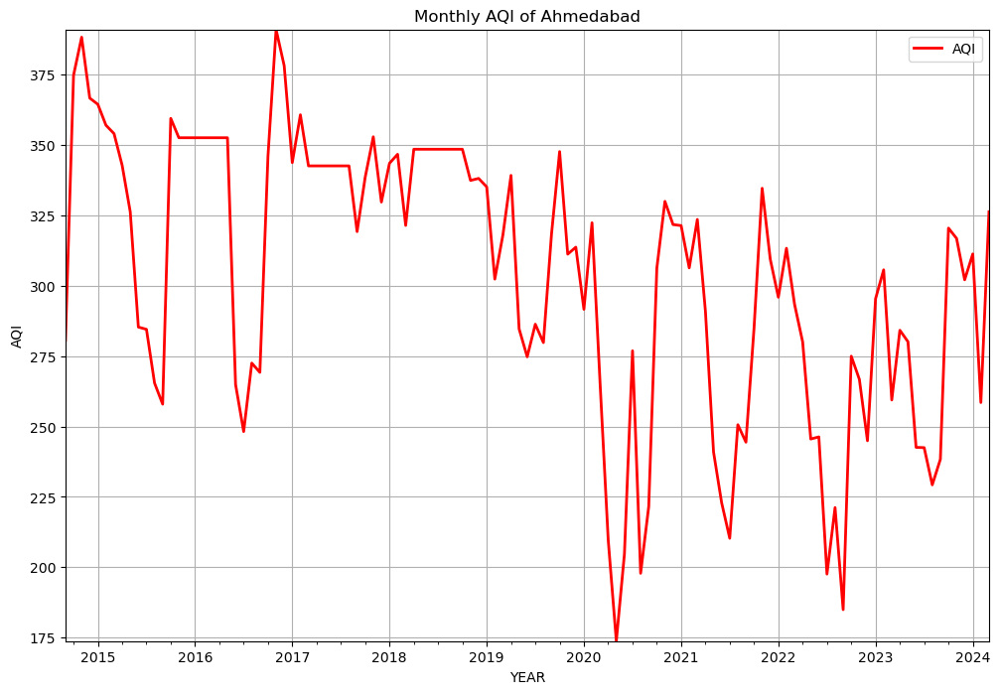

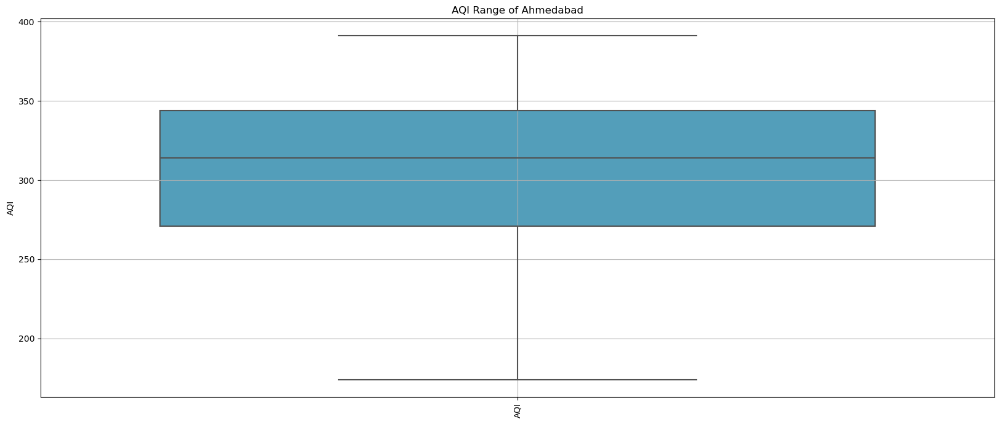

RMSE =  36.27147656526184
MAPE =  12.54021347288978
Mean AQI 265.02841208237345


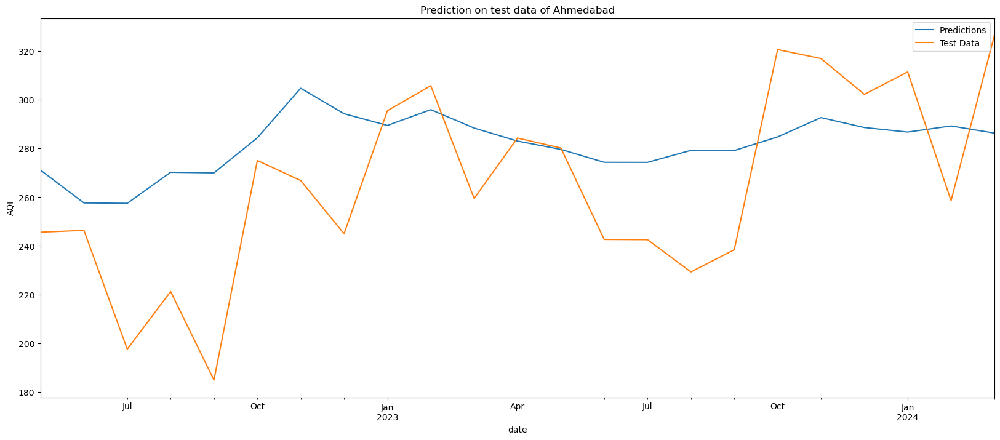

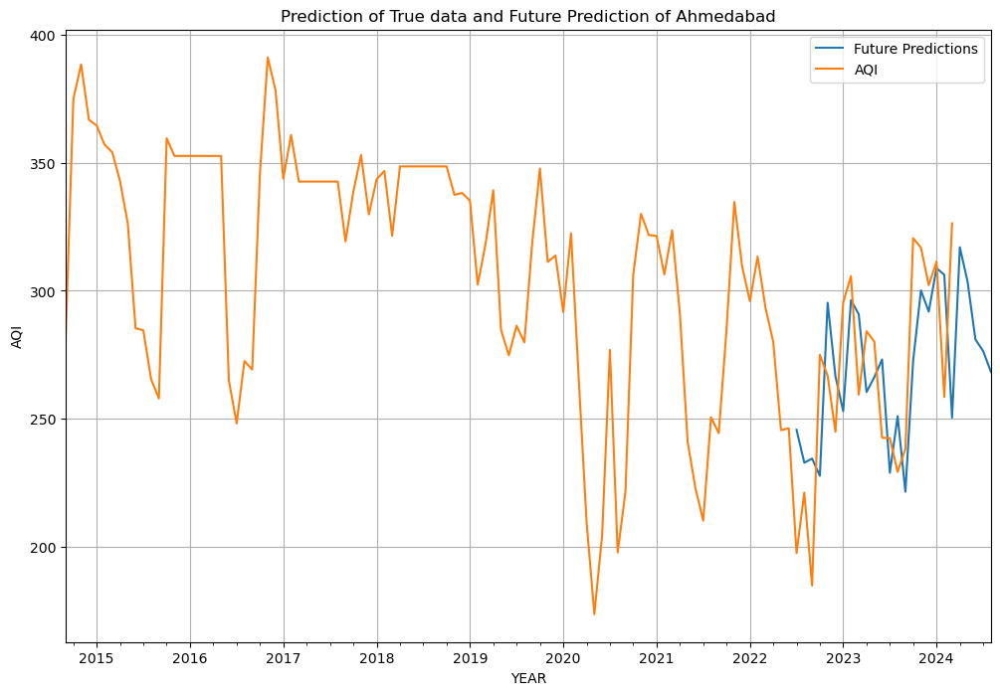

00:22:03 - cmdstanpy - INFO - Chain [1] start processing
00:22:38 - cmdstanpy - INFO - Chain [1] done processing


Root Mean Squared Error: 29.47341208081971
Mean Absolute Percentage Error (MAPE): 9.783674680744687


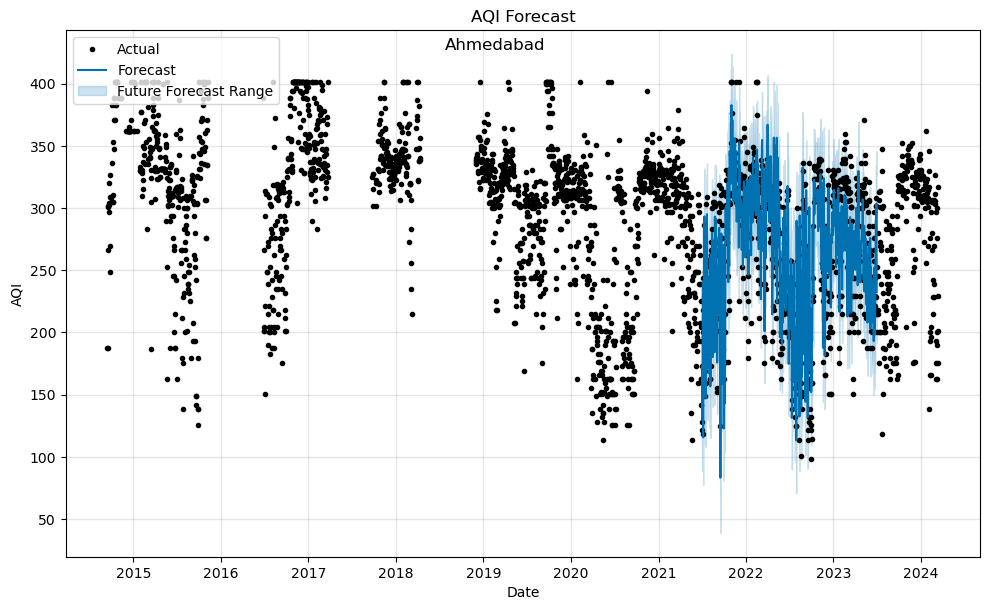

00:22:43 - cmdstanpy - INFO - Chain [1] start processing
00:22:43 - cmdstanpy - INFO - Chain [1] done processing


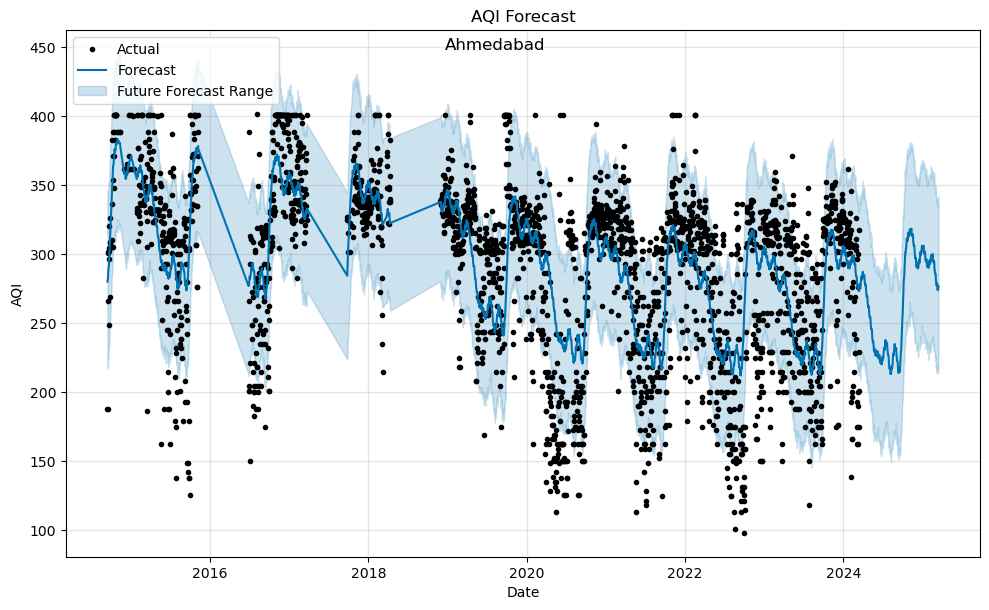

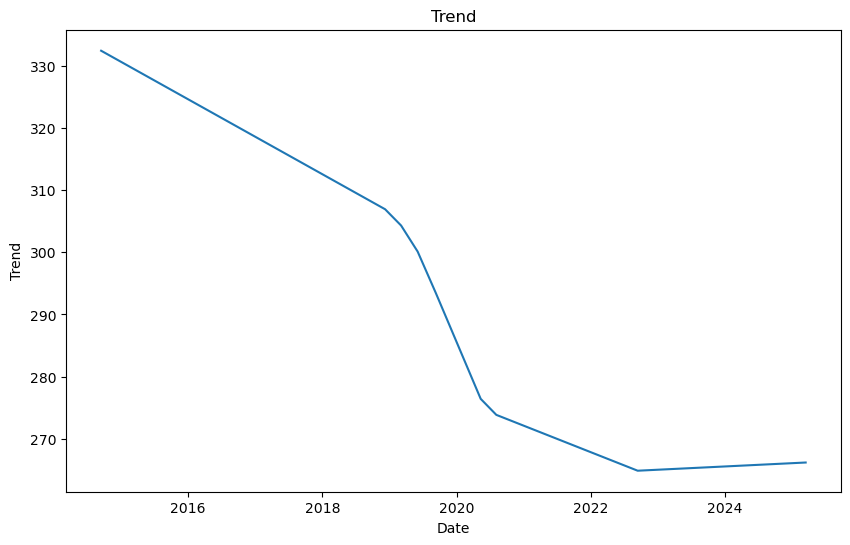

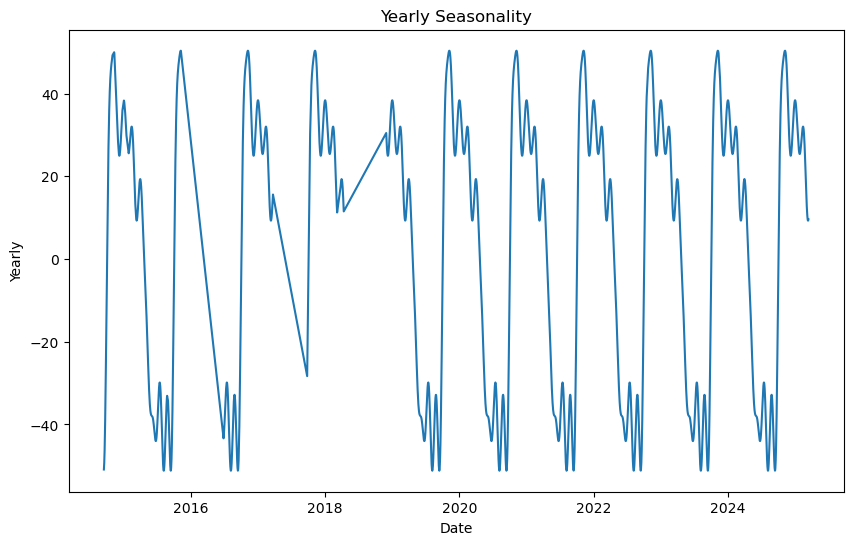

Epoch 1/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2351 - mae: 0.4300 - val_loss: 0.0249 - val_mae: 0.1154
Epoch 2/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0203 - mae: 0.1053 - val_loss: 0.0222 - val_mae: 0.1095
Epoch 3/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0182 - mae: 0.0986 - val_loss: 0.0220 - val_mae: 0.1085
Epoch 4/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0172 - mae: 0.0949 - val_loss: 0.0212 - val_mae: 0.1077
Epoch 5/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0188 - mae: 0.0988 - val_loss: 0.0213 - val_mae: 0.1067
Epoch 6/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0166 - mae: 0.0936 - val_loss: 0.0209 - val_mae: 0.1065
Epoch 7/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0174 - mae: 0.0965 - val_loss: 0.0208 - val_mae: 0.1057
Epoch 8/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0157 - mae: 0.0915 - val_loss: 0.0207 - val_mae: 0.1050
Epoch 9/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0162 - 

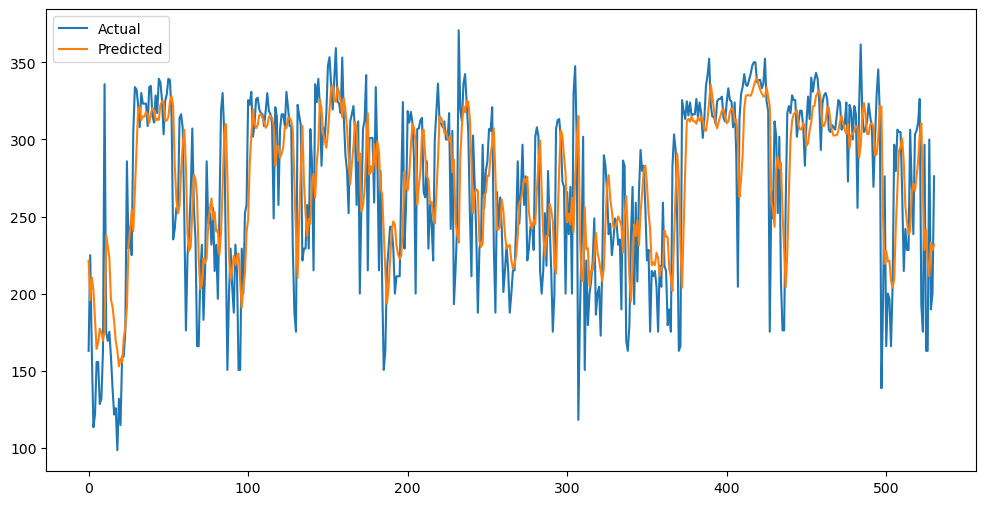

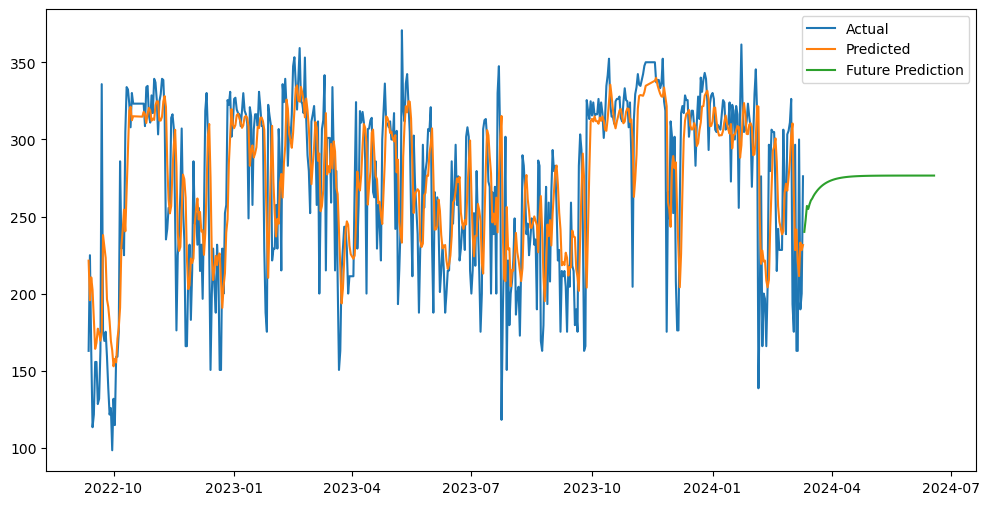

DataFrame for file aqi_Bangalore.csv:
(3437, 9)


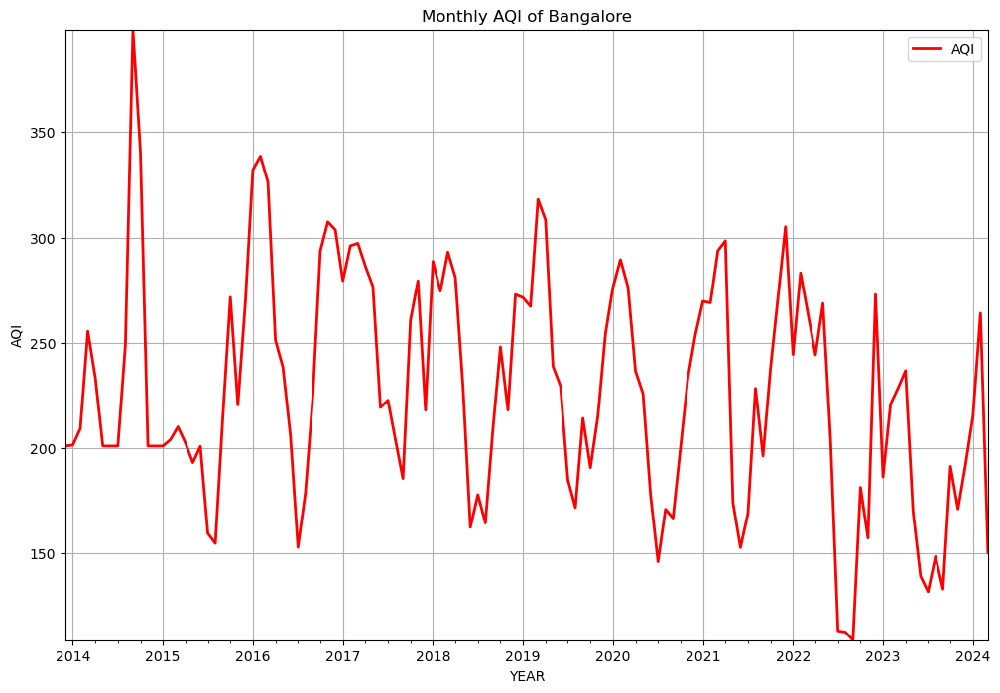

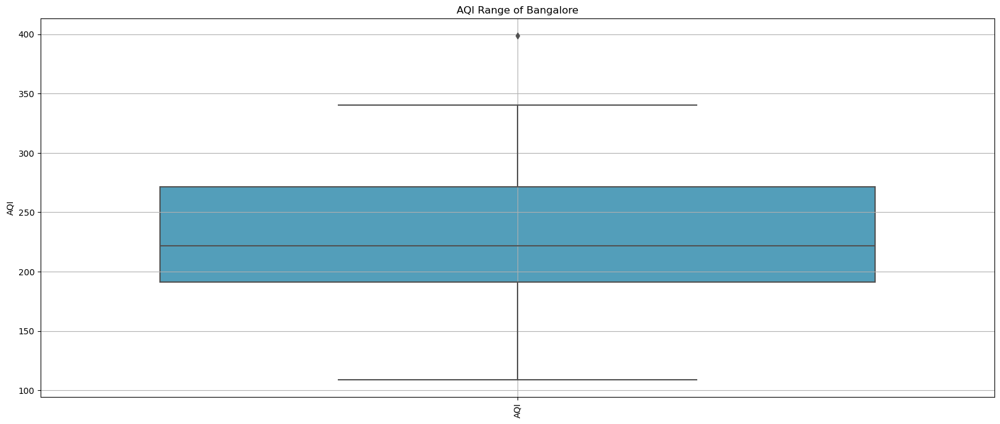

RMSE =  53.02473675688968
MAPE =  27.136686336768452
Mean AQI 188.30540000534563


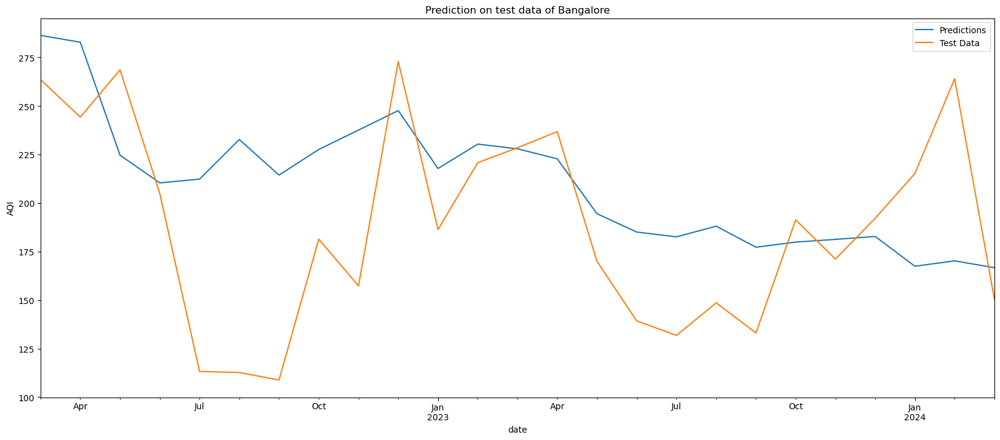

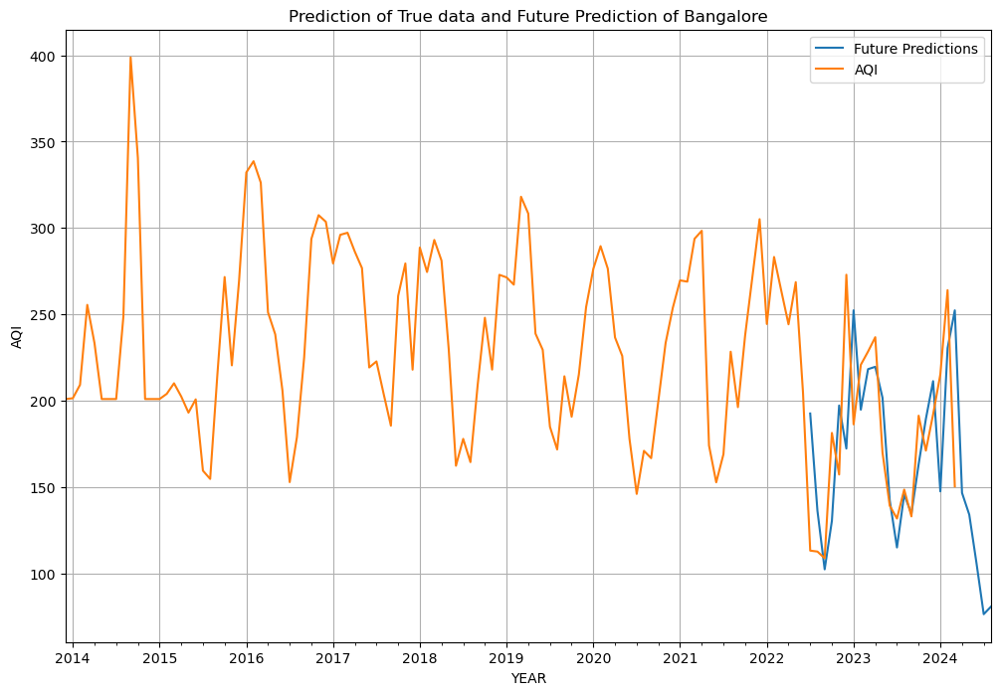

00:25:03 - cmdstanpy - INFO - Chain [1] start processing
00:25:15 - cmdstanpy - INFO - Chain [1] done processing


Root Mean Squared Error: 49.99932144291409
Mean Absolute Percentage Error (MAPE): 20.51197668087972


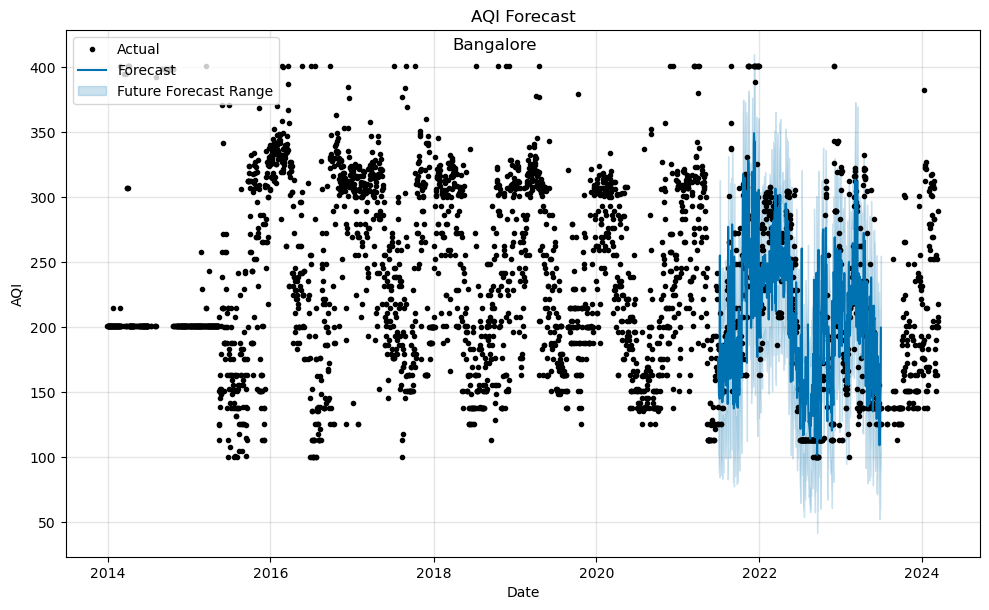

00:25:18 - cmdstanpy - INFO - Chain [1] start processing
00:25:19 - cmdstanpy - INFO - Chain [1] done processing


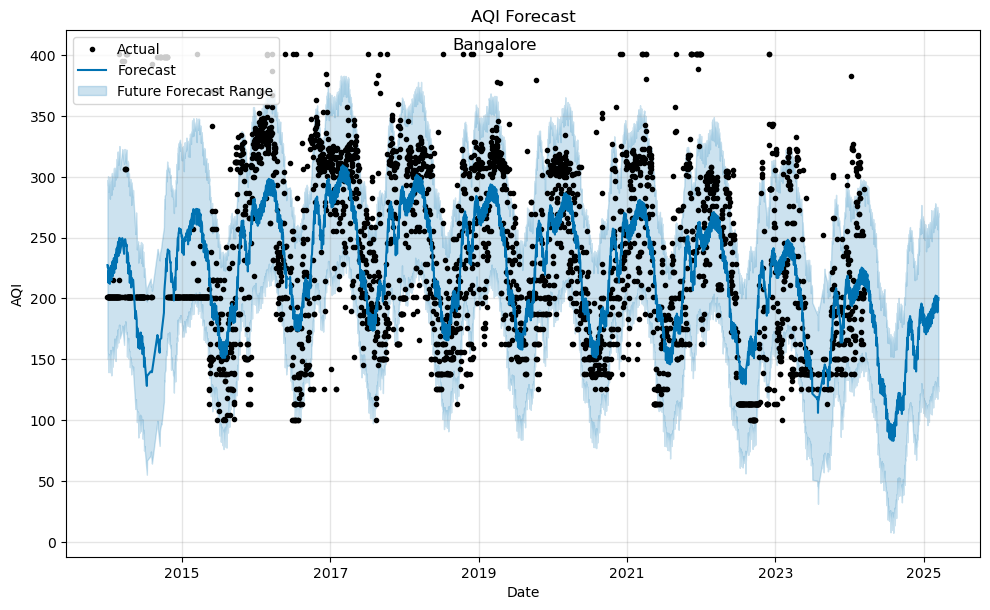

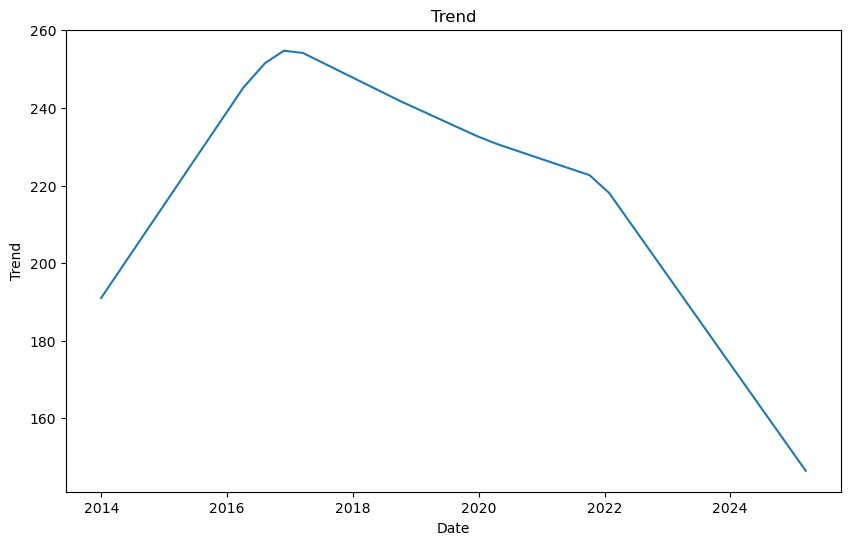

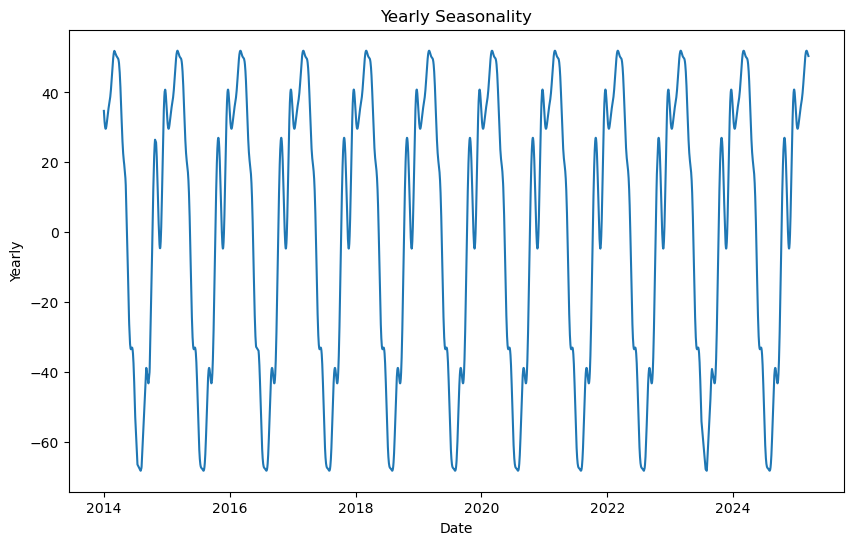

Epoch 1/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1329 - mae: 0.2987 - val_loss: 0.0274 - val_mae: 0.1386
Epoch 2/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0276 - mae: 0.1285 - val_loss: 0.0249 - val_mae: 0.1275
Epoch 3/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0245 - mae: 0.1178 - val_loss: 0.0226 - val_mae: 0.1167
Epoch 4/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0263 - mae: 0.1176 - val_loss: 0.0211 - val_mae: 0.1100
Epoch 5/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0246 - mae: 0.1125 - val_loss: 0.0221 - val_mae: 0.1124
Epoch 6/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0240 - mae: 0.1096 - val_loss: 0.0208 - val_mae: 0.1076
Epoch 7/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0245 - mae: 0.1113 - val_loss: 0.0201 - val_mae: 0.1049
Epoch 8/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0223 - mae: 0.1068 - val_loss: 0.0200 - val_mae: 0.1047
Epoch 9/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0236 - mae:

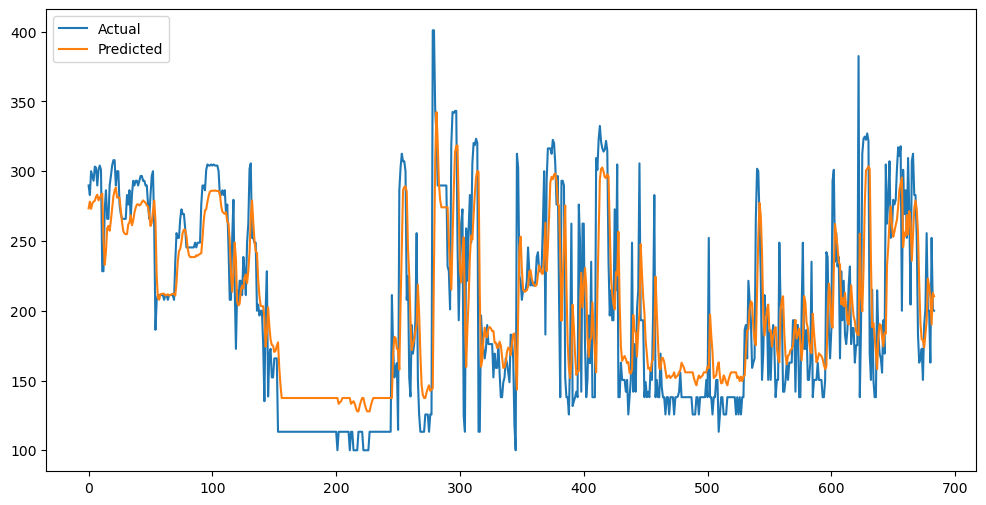

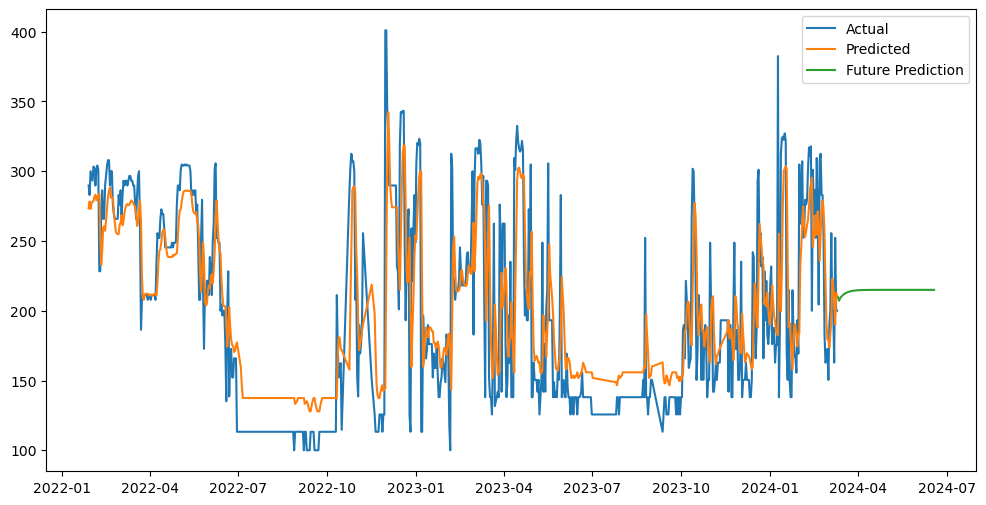

DataFrame for file aqi_Bhopal.csv:
(1496, 9)


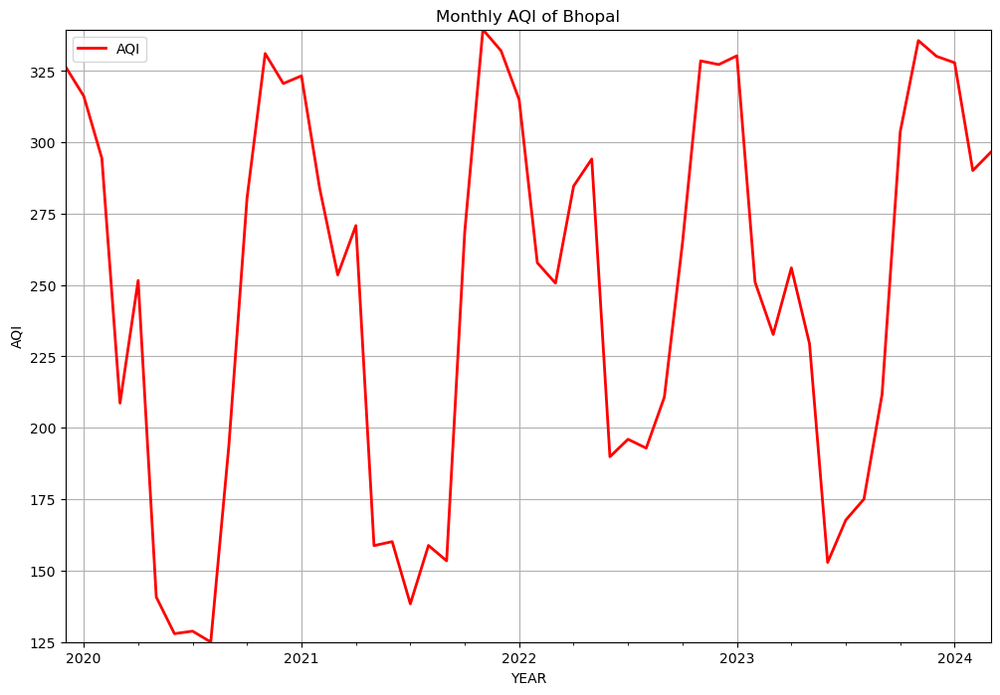

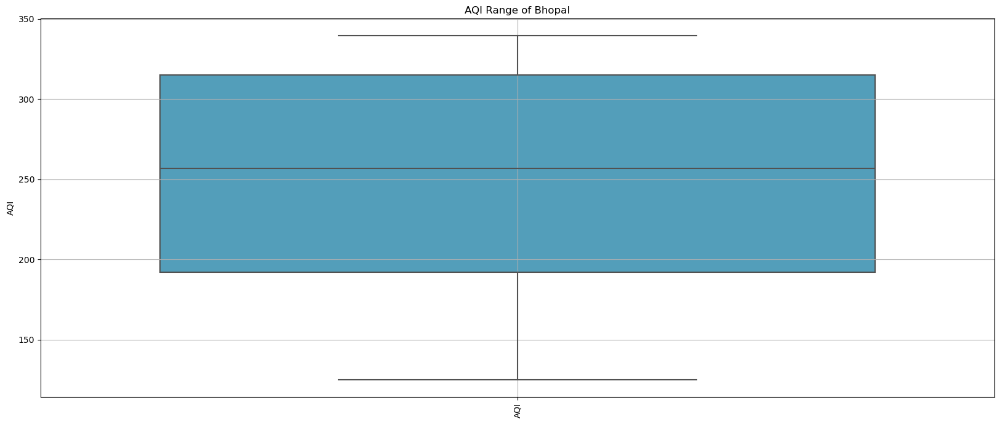

RMSE =  59.74745206238857
MAPE =  18.165153588829703
Mean AQI 256.4375212408457


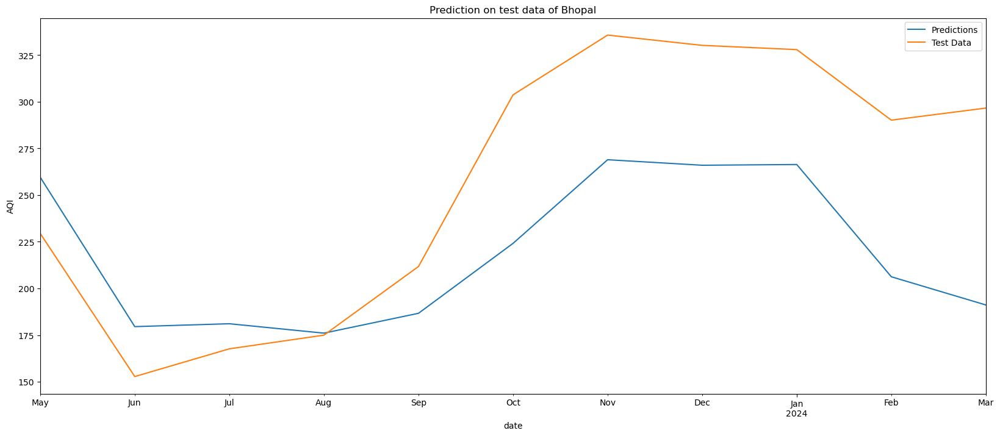

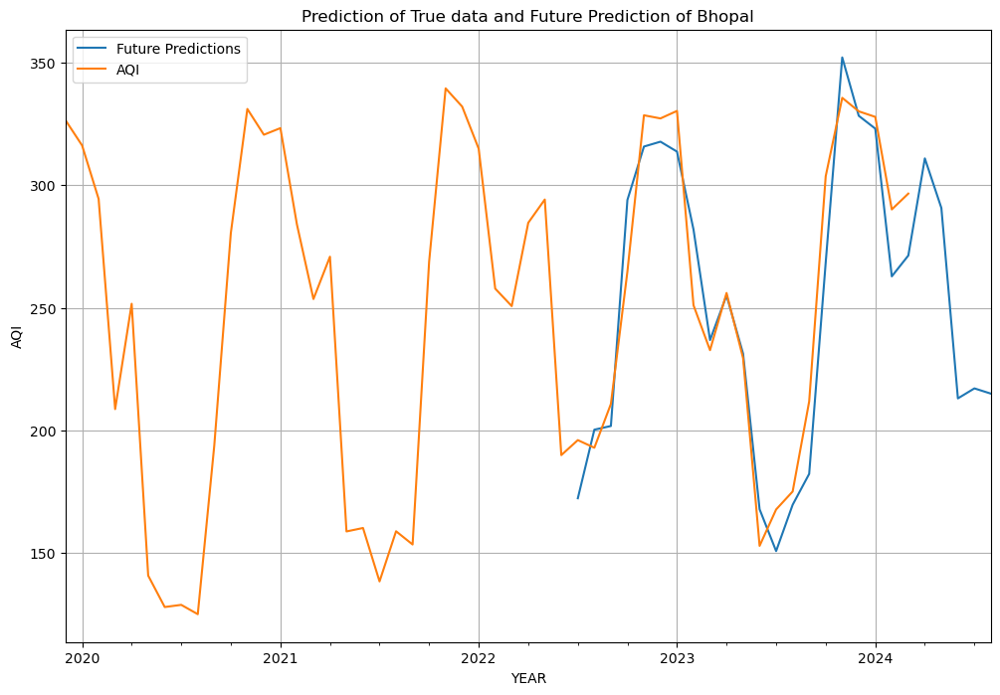

00:26:49 - cmdstanpy - INFO - Chain [1] start processing
00:26:55 - cmdstanpy - INFO - Chain [1] done processing


Root Mean Squared Error: 11.002636043283582
Mean Absolute Percentage Error (MAPE): 3.8520638321840375


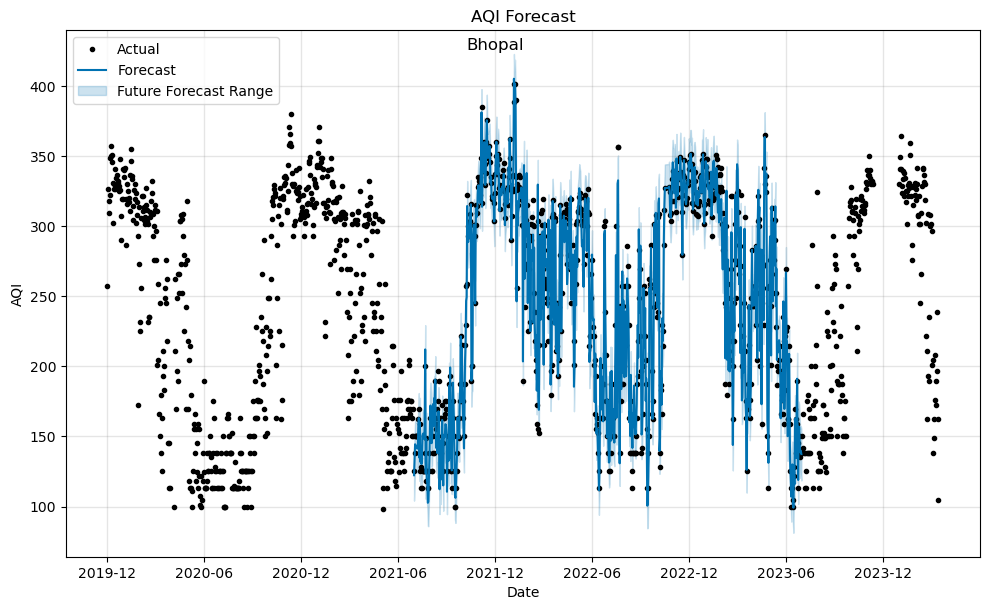

00:26:58 - cmdstanpy - INFO - Chain [1] start processing
00:26:59 - cmdstanpy - INFO - Chain [1] done processing


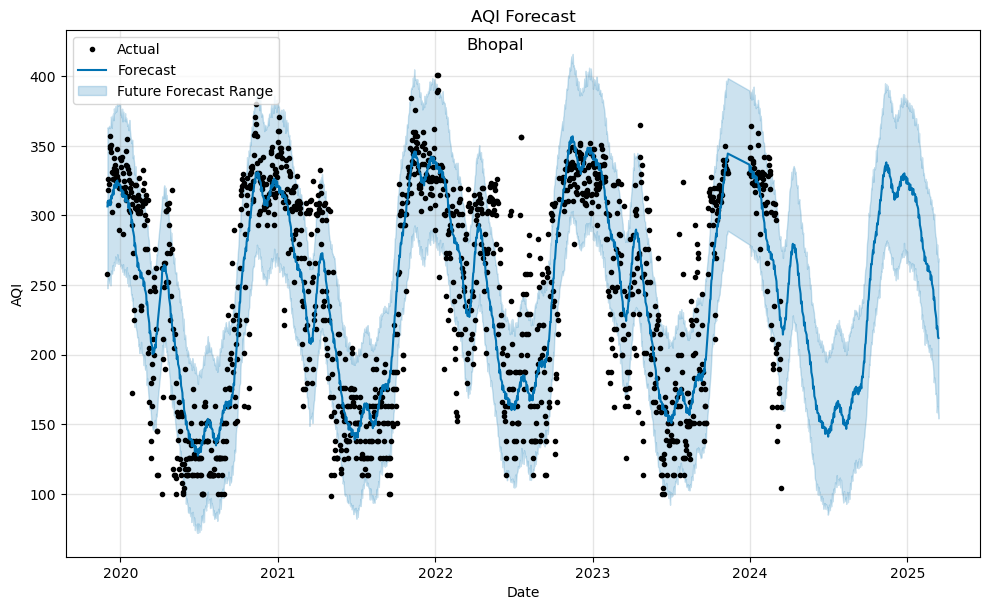

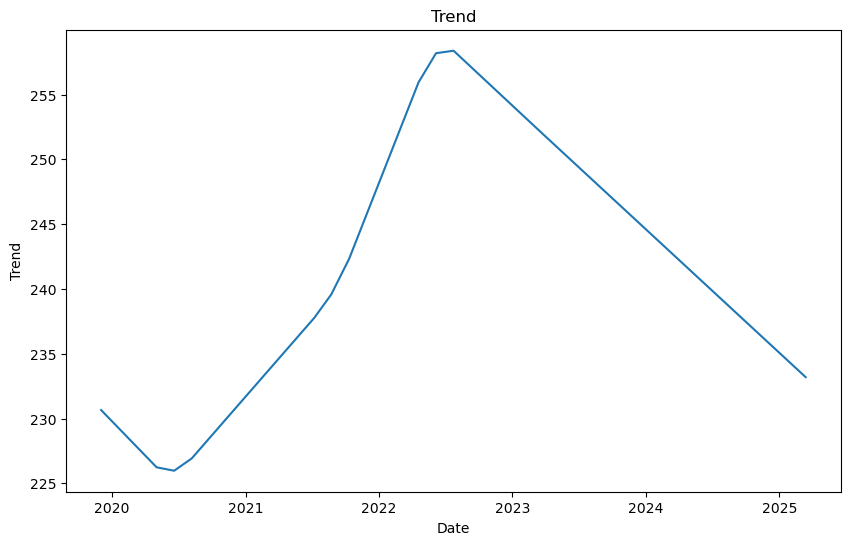

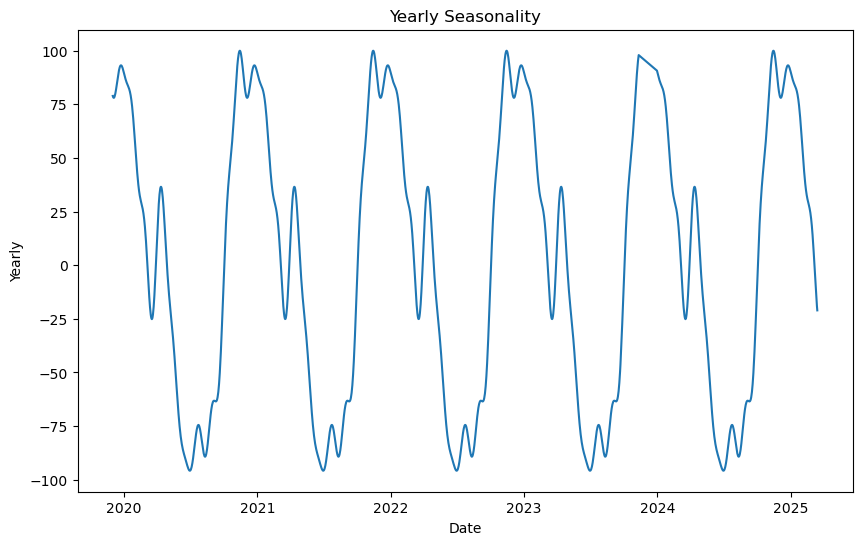

Epoch 1/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.2709 - mae: 0.4504 - val_loss: 0.0934 - val_mae: 0.2495
Epoch 2/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0686 - mae: 0.2163 - val_loss: 0.0276 - val_mae: 0.1312
Epoch 3/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0234 - mae: 0.1276 - val_loss: 0.0209 - val_mae: 0.1105
Epoch 4/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0174 - mae: 0.1030 - val_loss: 0.0189 - val_mae: 0.0992
Epoch 5/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0144 - mae: 0.0888 - val_loss: 0.0183 - val_mae: 0.0960
Epoch 6/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0156 - mae: 0.0910 - val_loss: 0.0180 - val_mae: 0.0945
Epoch 7/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0137 - mae: 0.0856 - val_loss: 0.0174 - val_mae: 0.0937
Epoch 8/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0129 - mae: 0.0830 - val_loss: 0.0169 - val_mae: 0.0939
Epoch 9/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0148

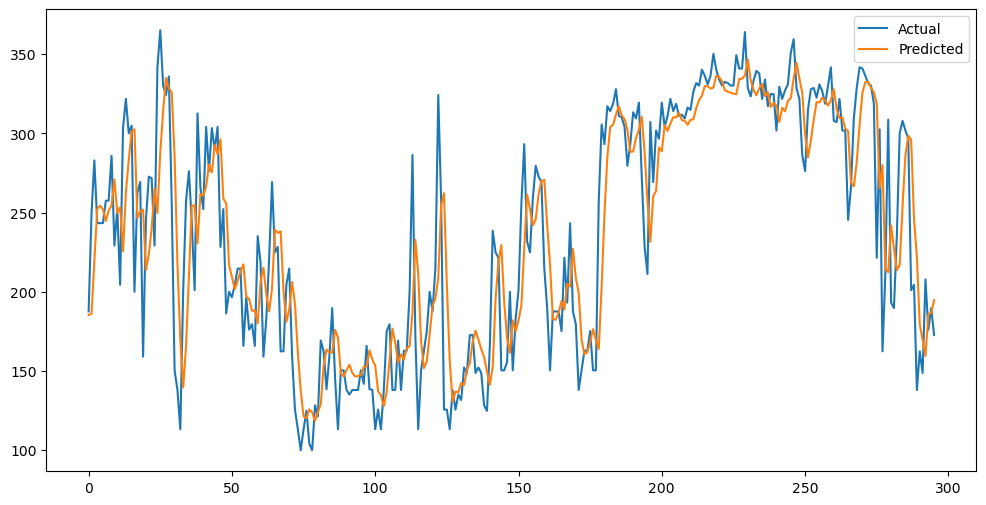

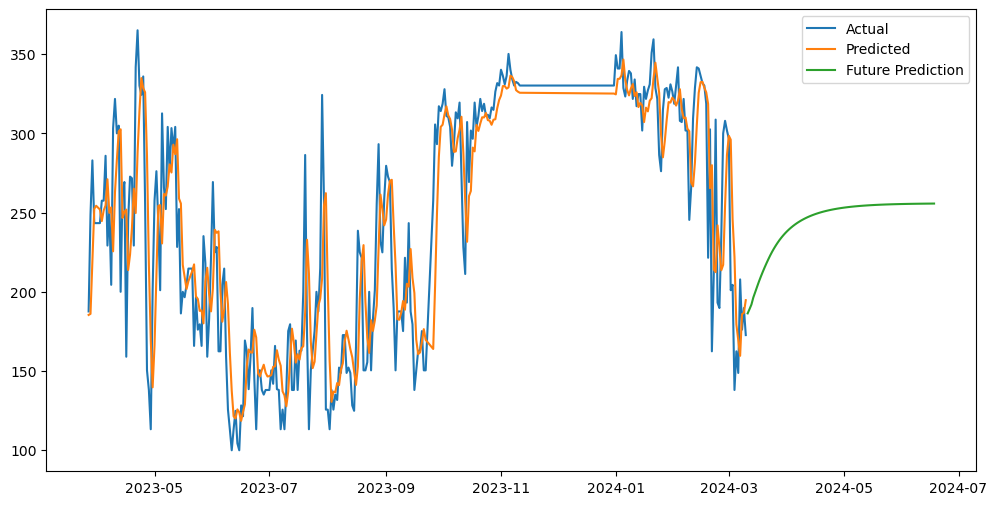

DataFrame for file aqi_Chennai.csv:
(2411, 9)


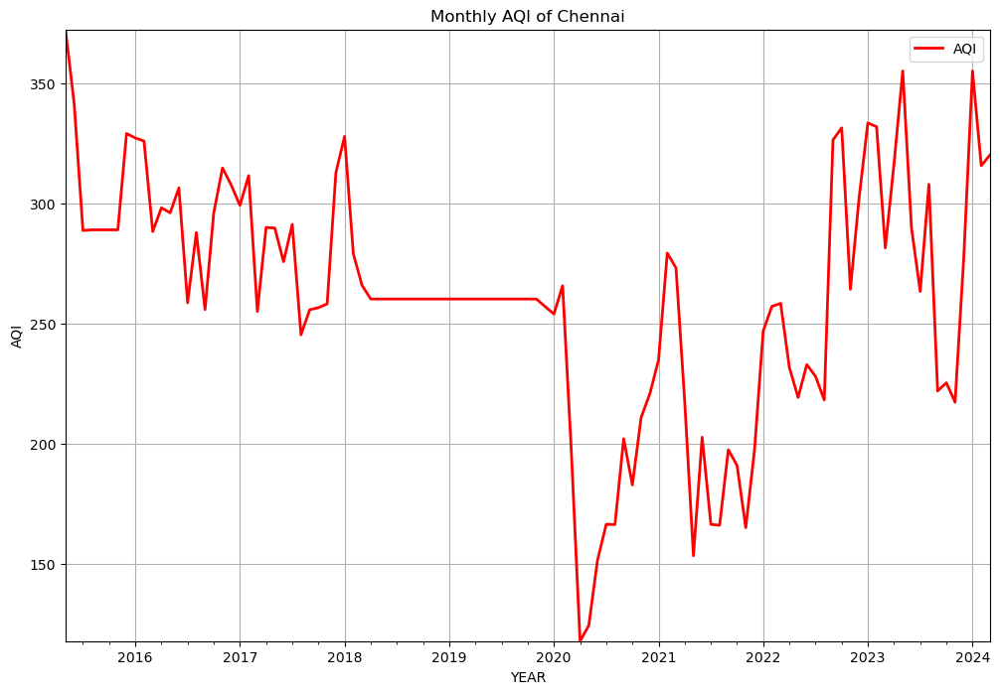

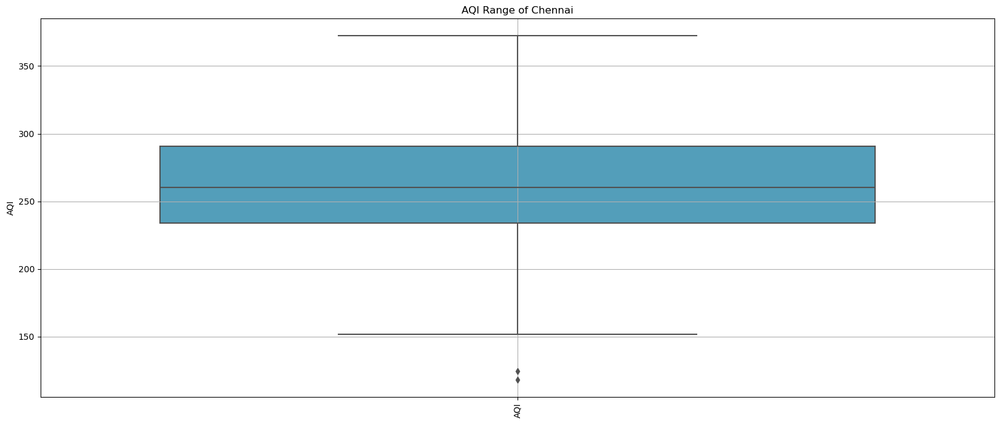

RMSE =  81.70656233212101
MAPE =  21.658894506742392
Mean AQI 287.19915238075623


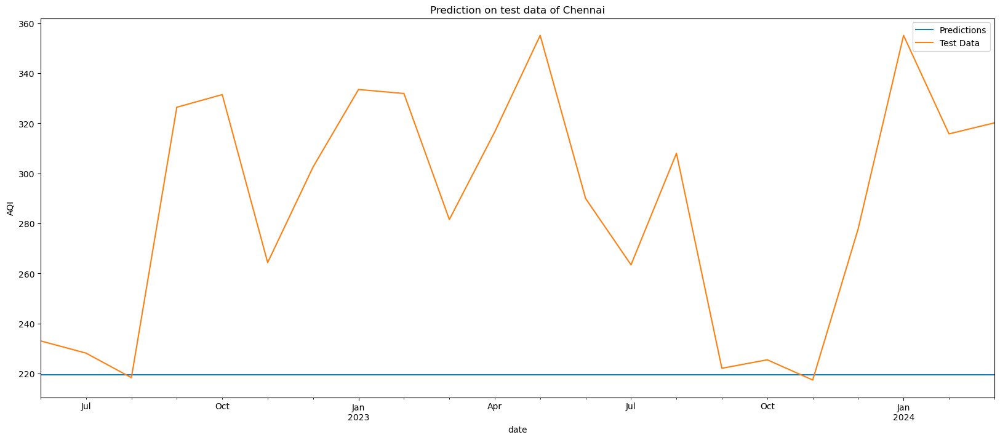

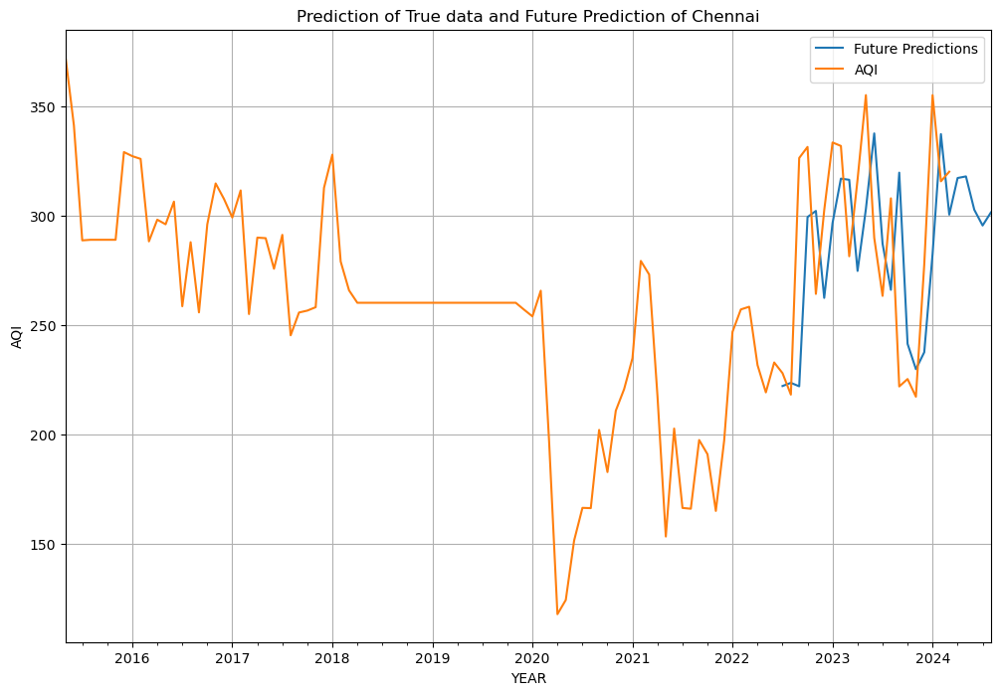

00:28:36 - cmdstanpy - INFO - Chain [1] start processing
00:28:52 - cmdstanpy - INFO - Chain [1] done processing


Root Mean Squared Error: 32.49260925647296
Mean Absolute Percentage Error (MAPE): 11.153859755574425


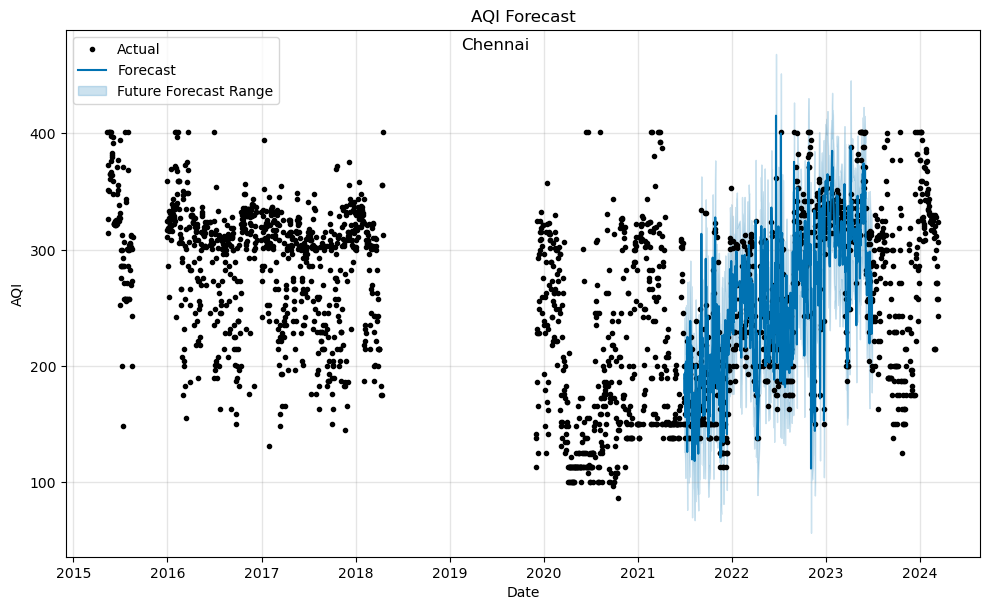

00:28:55 - cmdstanpy - INFO - Chain [1] start processing
00:28:56 - cmdstanpy - INFO - Chain [1] done processing


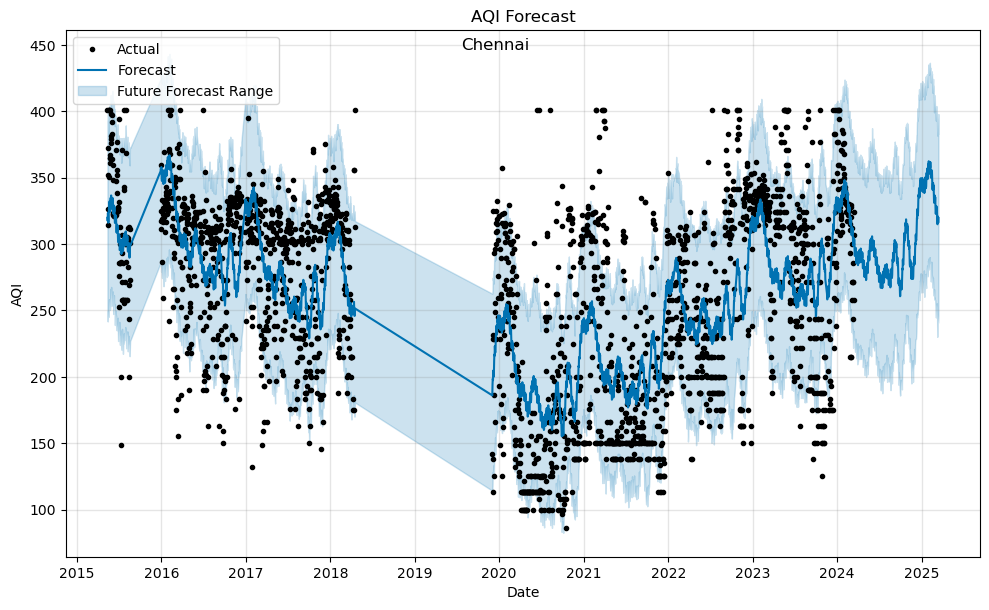

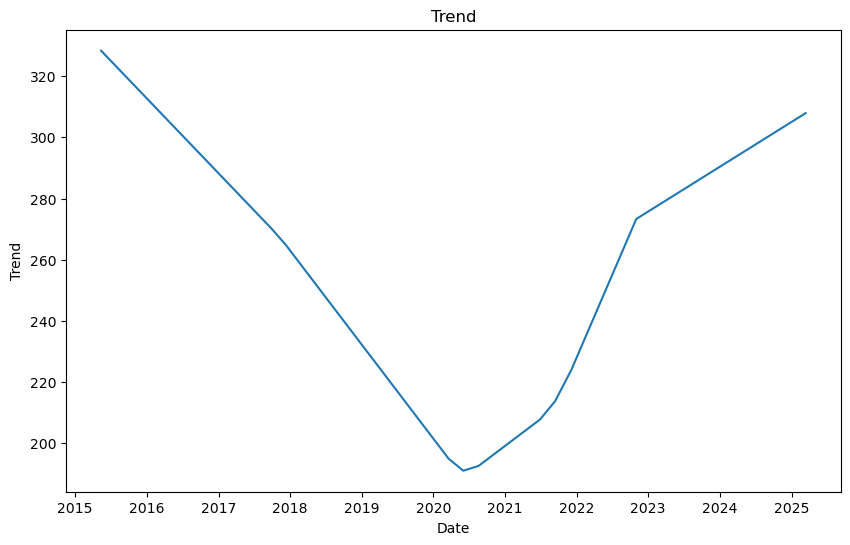

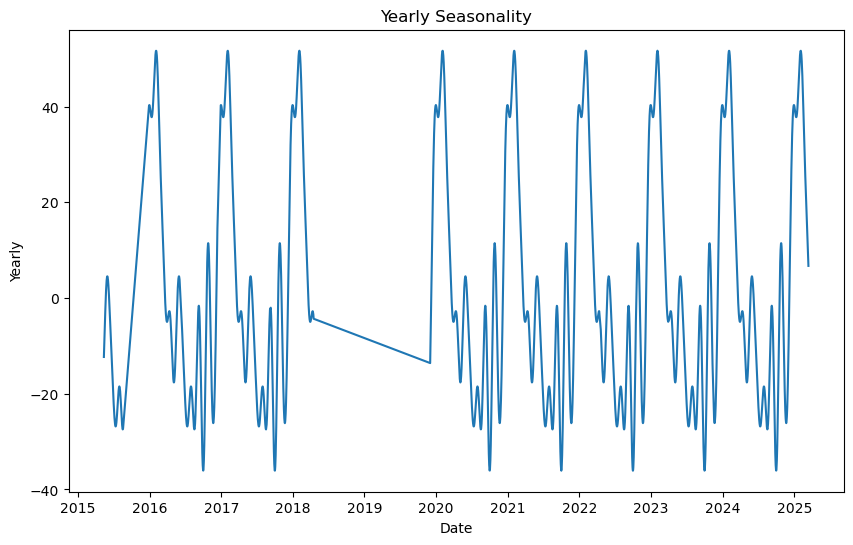

Epoch 1/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.2222 - mae: 0.4091 - val_loss: 0.0234 - val_mae: 0.1221
Epoch 2/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0302 - mae: 0.1382 - val_loss: 0.0224 - val_mae: 0.1161
Epoch 3/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0278 - mae: 0.1307 - val_loss: 0.0212 - val_mae: 0.1067
Epoch 4/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0255 - mae: 0.1219 - val_loss: 0.0207 - val_mae: 0.1033
Epoch 5/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0265 - mae: 0.1224 - val_loss: 0.0200 - val_mae: 0.0994
Epoch 6/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0259 - mae: 0.1226 - val_loss: 0.0196 - val_mae: 0.0964
Epoch 7/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0248 - mae: 0.1174 - val_loss: 0.0208 - val_mae: 0.1085
Epoch 8/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0235 - mae: 0.1154 - val_loss: 0.0198 - val_mae: 0.1032
Epoch 9/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0250 - mae:

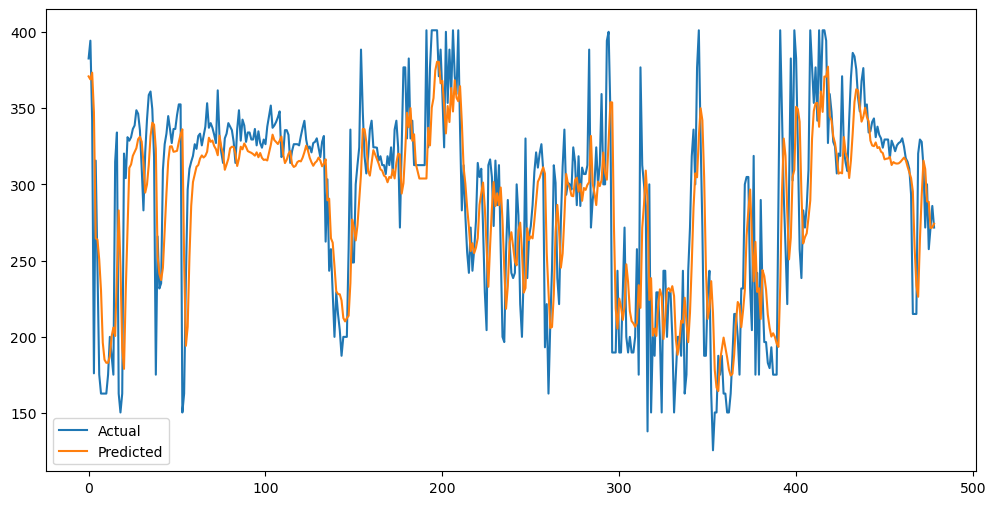

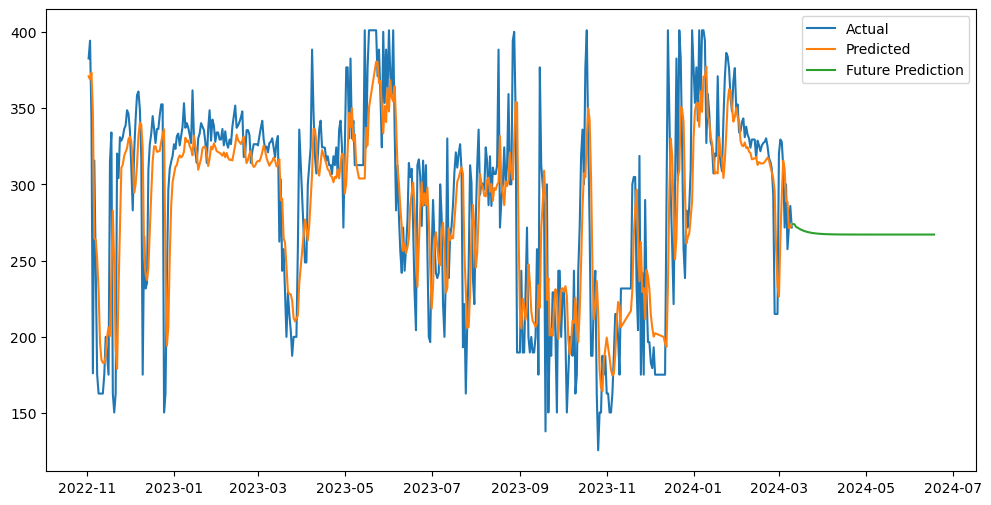

DataFrame for file aqi_Delhi.csv:
(1941, 9)


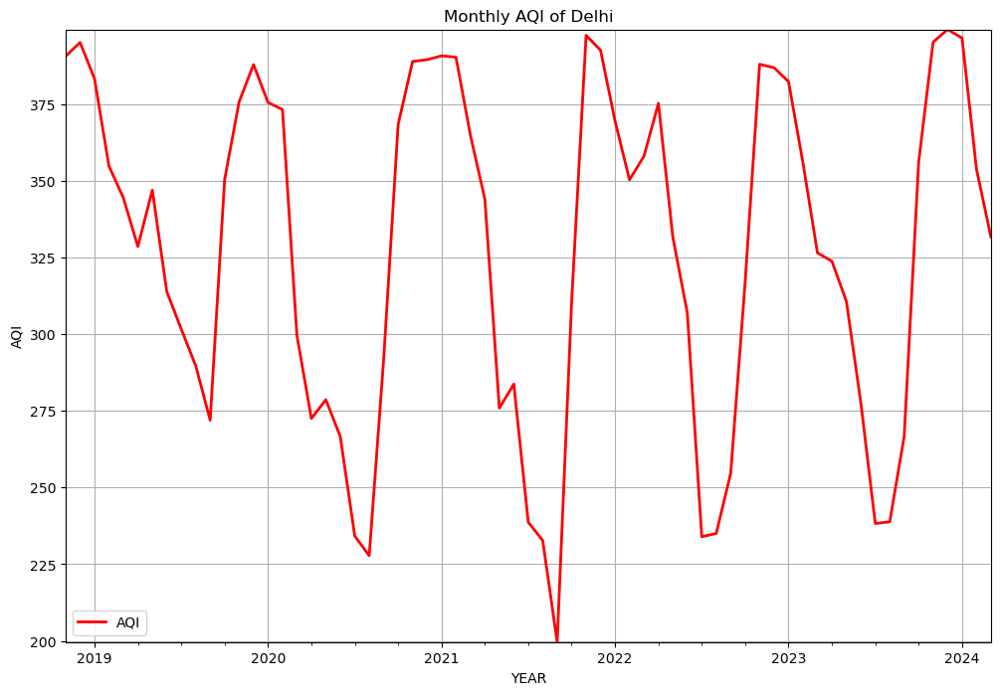

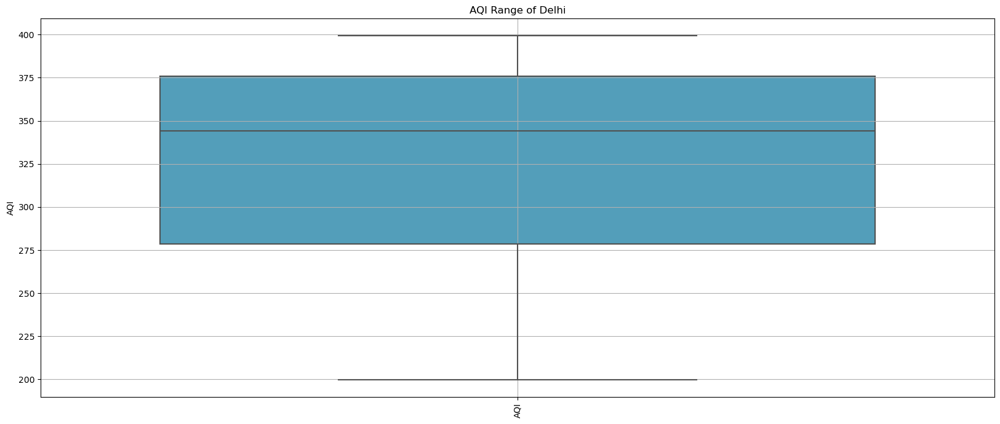

RMSE =  16.980742710792764
MAPE =  4.144282731519119
Mean AQI 324.2736639991445


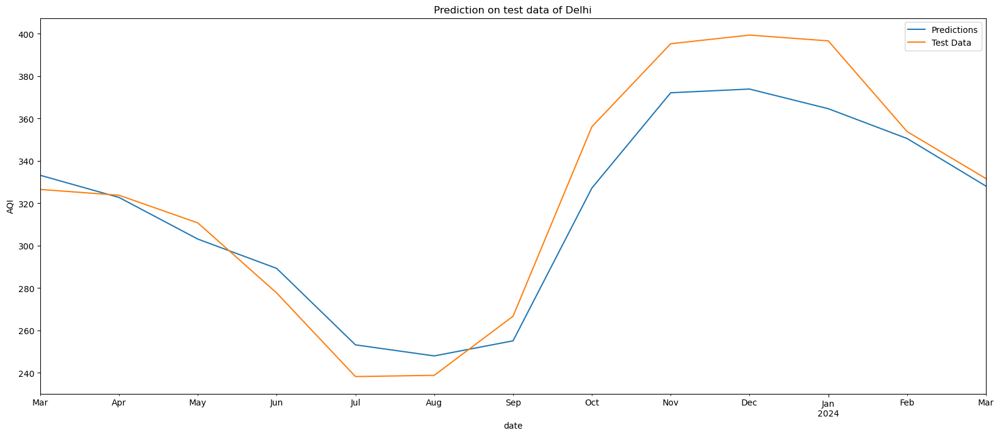

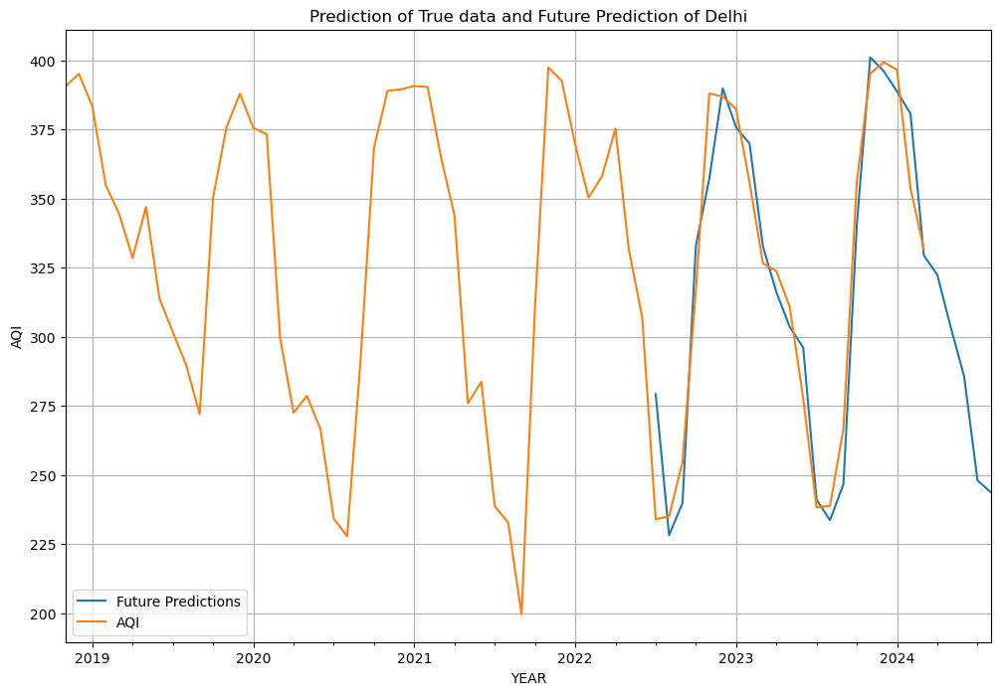

00:30:34 - cmdstanpy - INFO - Chain [1] start processing
00:30:40 - cmdstanpy - INFO - Chain [1] done processing


Root Mean Squared Error: 20.173466415034444
Mean Absolute Percentage Error (MAPE): 5.38723090540606


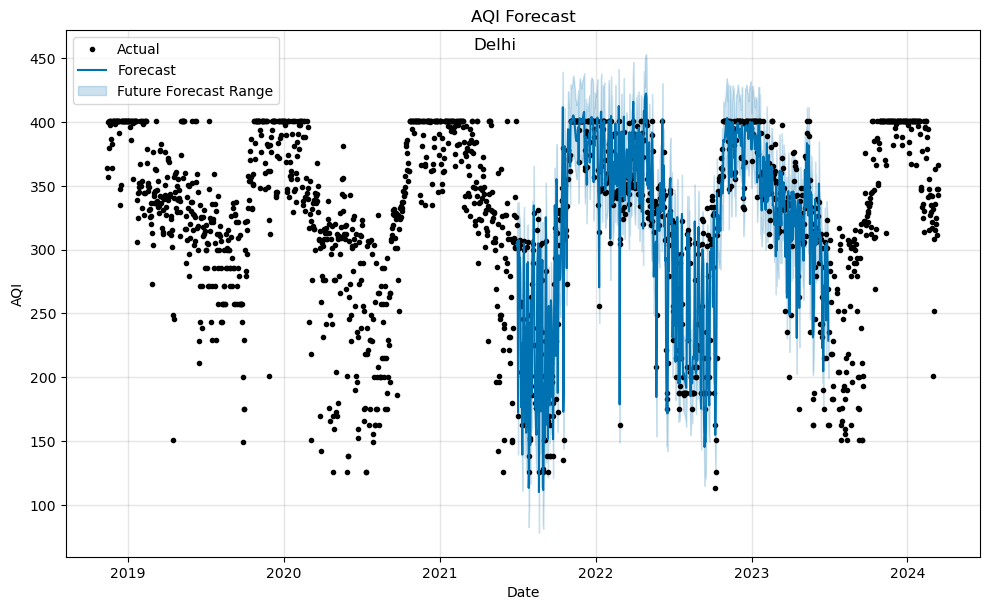

00:30:42 - cmdstanpy - INFO - Chain [1] start processing
00:30:43 - cmdstanpy - INFO - Chain [1] done processing


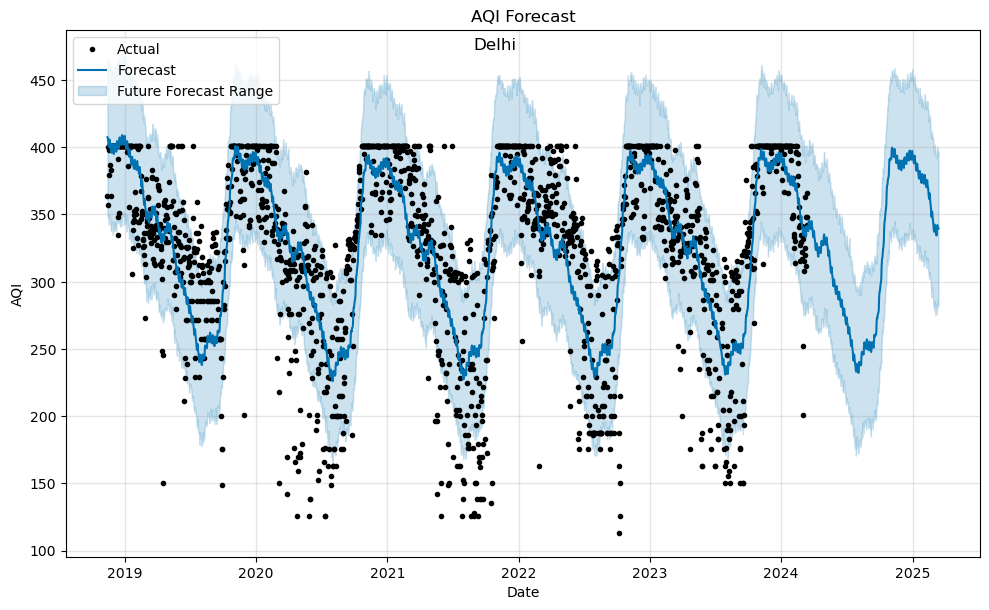

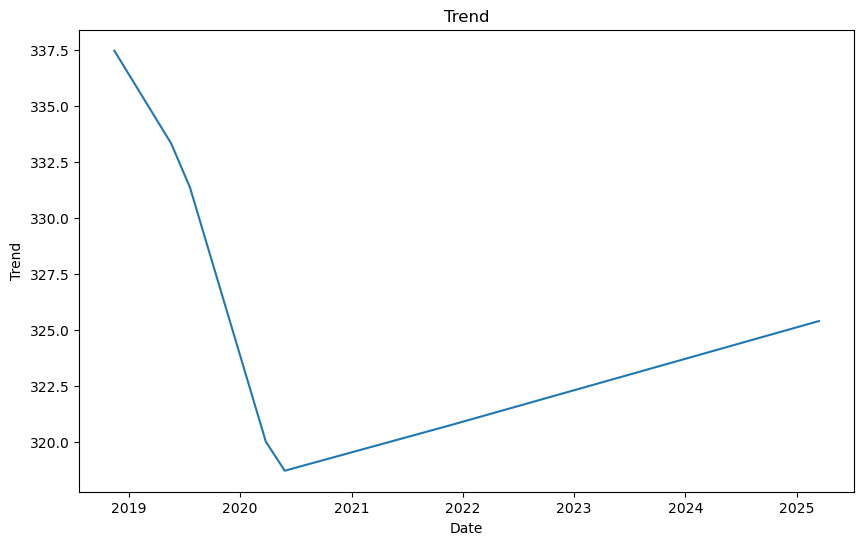

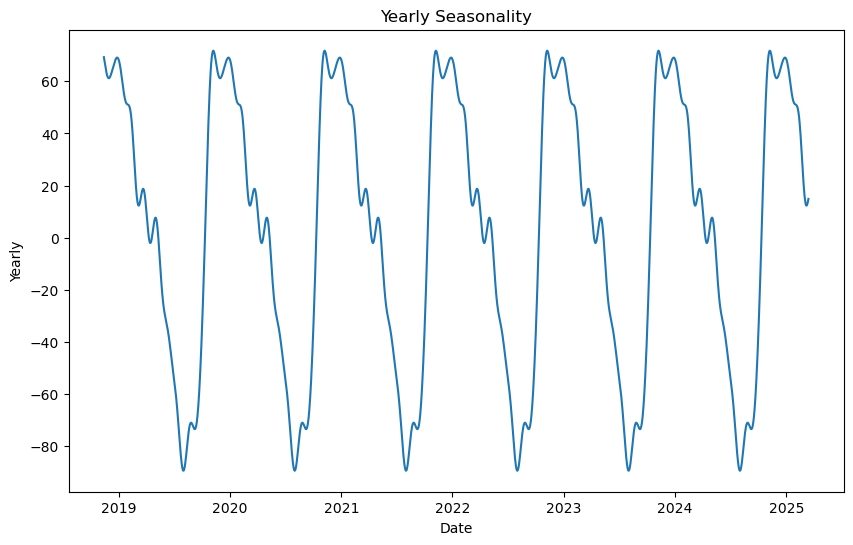

Epoch 1/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.4127 - mae: 0.5995 - val_loss: 0.0774 - val_mae: 0.2563
Epoch 2/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0401 - mae: 0.1623 - val_loss: 0.0227 - val_mae: 0.1168
Epoch 3/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0228 - mae: 0.1117 - val_loss: 0.0215 - val_mae: 0.1058
Epoch 4/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0225 - mae: 0.1086 - val_loss: 0.0209 - val_mae: 0.1059
Epoch 5/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0211 - mae: 0.1050 - val_loss: 0.0204 - val_mae: 0.1034
Epoch 6/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0209 - mae: 0.1035 - val_loss: 0.0201 - val_mae: 0.1022
Epoch 7/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0199 - mae: 0.1033 - val_loss: 0.0201 - val_mae: 0.1052
Epoch 8/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0193 - mae: 0.1005 - val_loss: 0.0206 - val_mae: 0.1112
Epoch 9/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0213 - mae

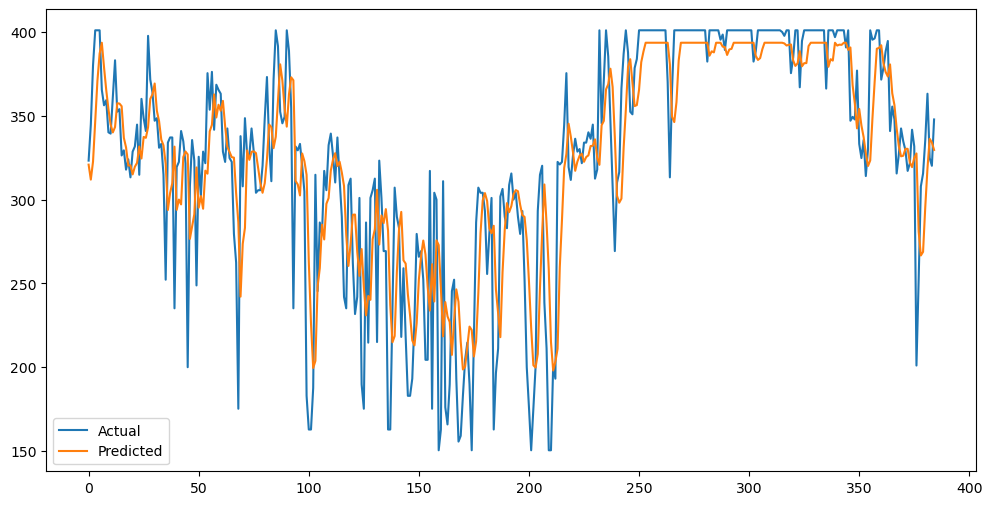

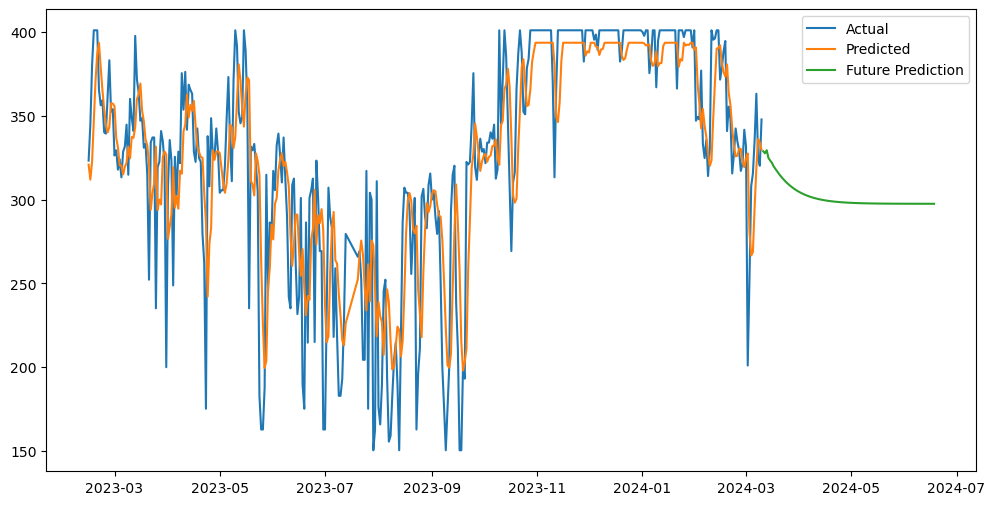

DataFrame for file aqi_Hyderabad.csv:
(2065, 9)


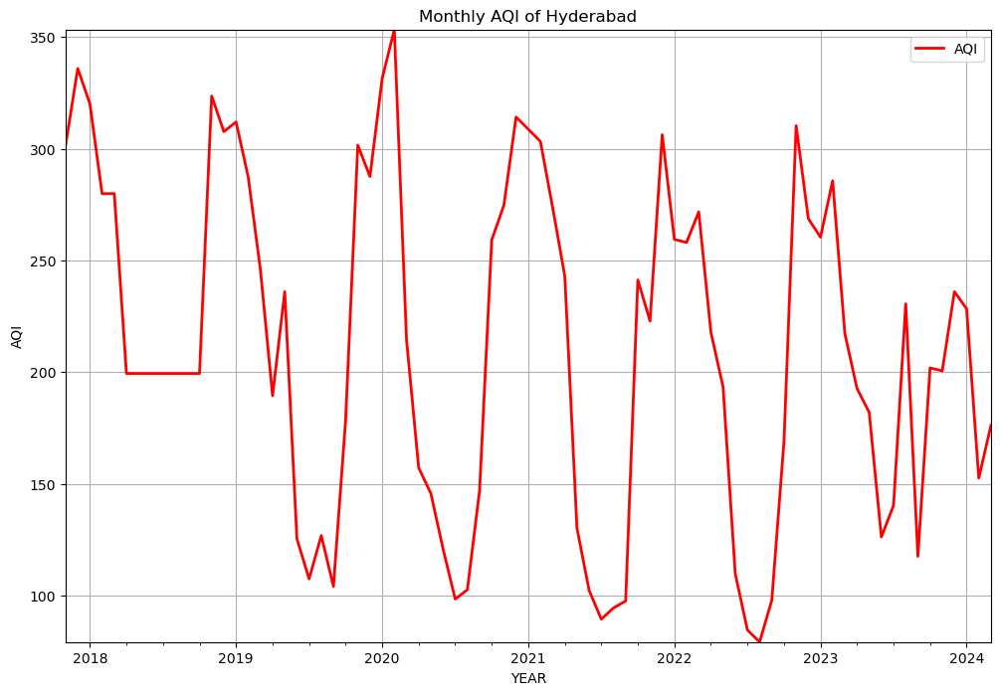

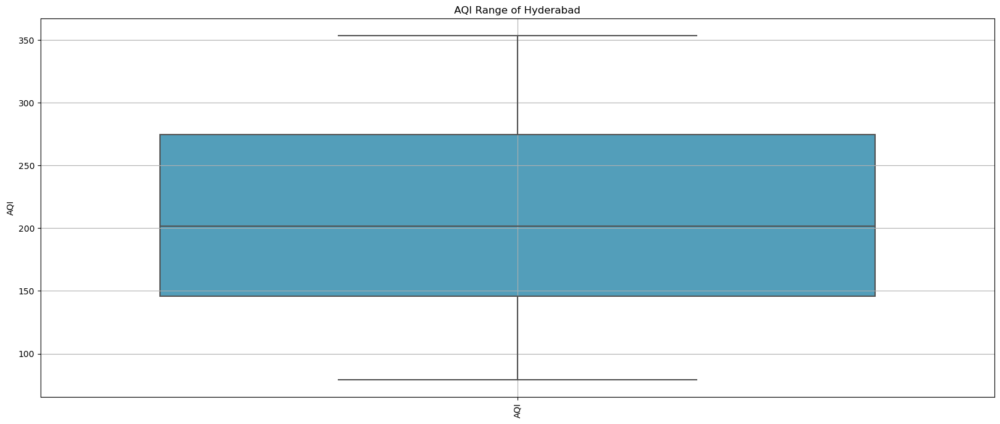

RMSE =  50.07497151230693
MAPE =  21.98844692175153
Mean AQI 201.02864019270464


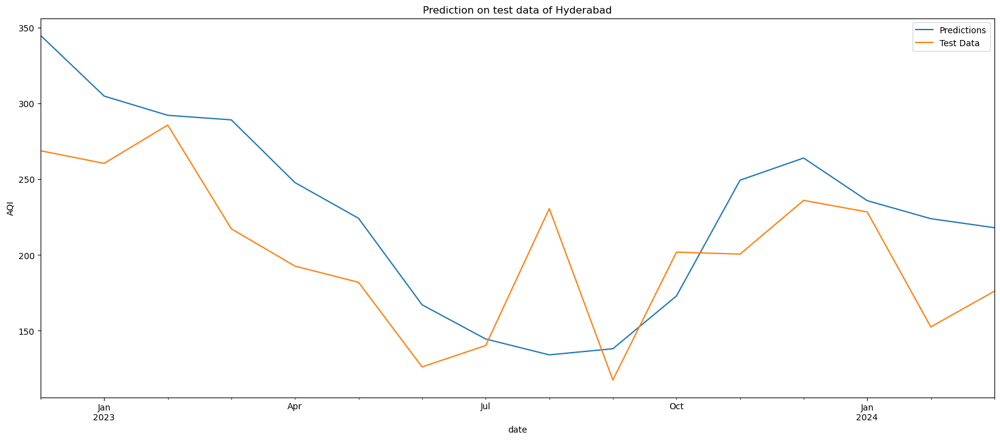

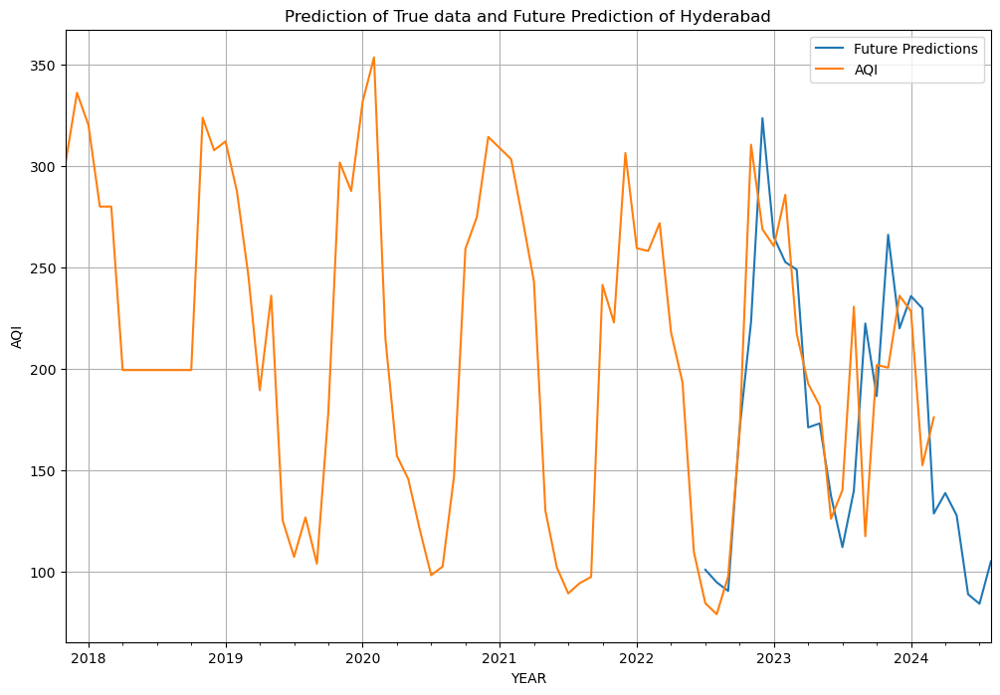

00:32:17 - cmdstanpy - INFO - Chain [1] start processing
00:32:32 - cmdstanpy - INFO - Chain [1] done processing


Root Mean Squared Error: 30.439338040417507
Mean Absolute Percentage Error (MAPE): 14.762299641690104


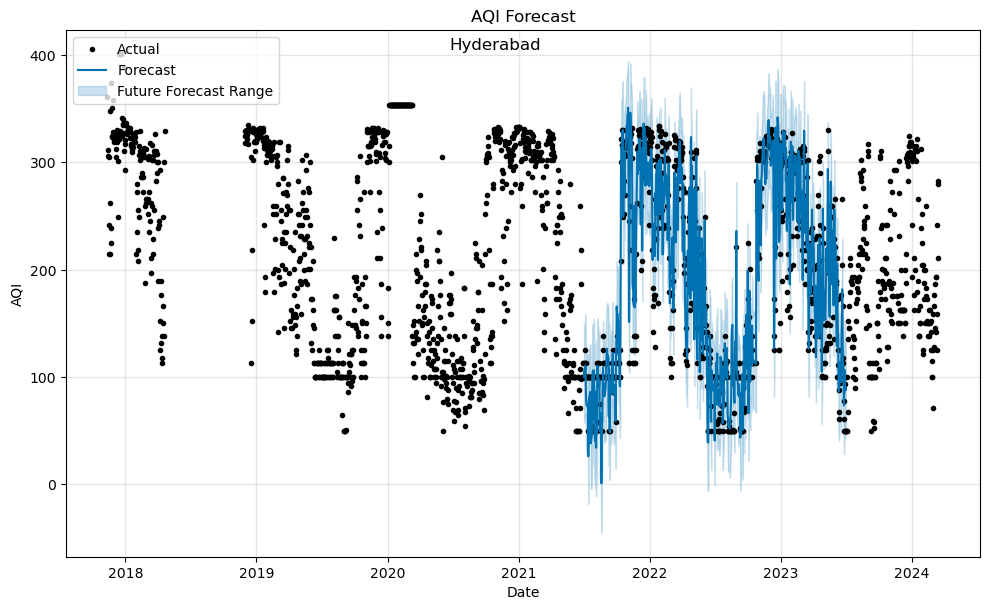

00:32:35 - cmdstanpy - INFO - Chain [1] start processing
00:32:35 - cmdstanpy - INFO - Chain [1] done processing


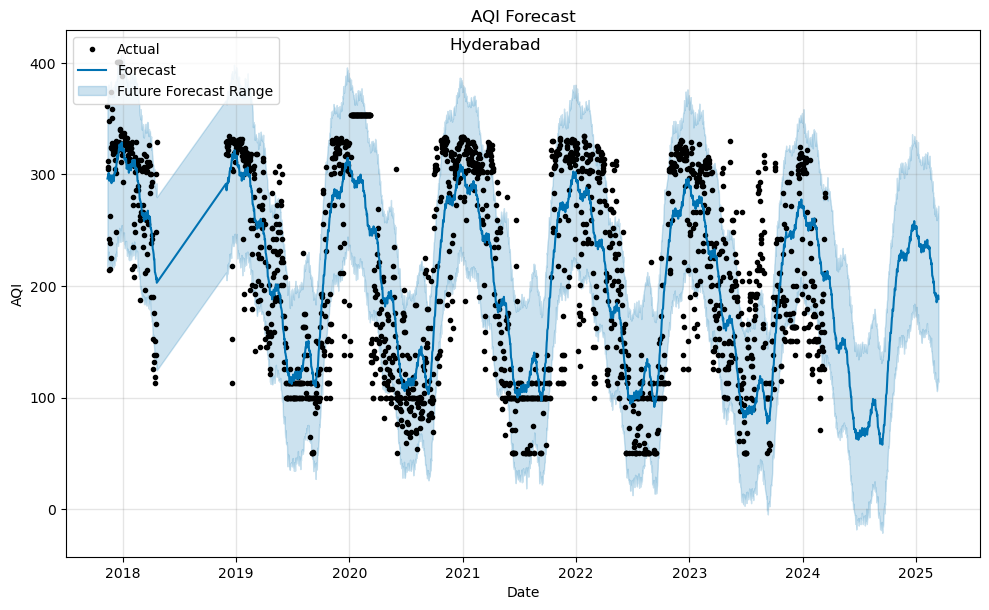

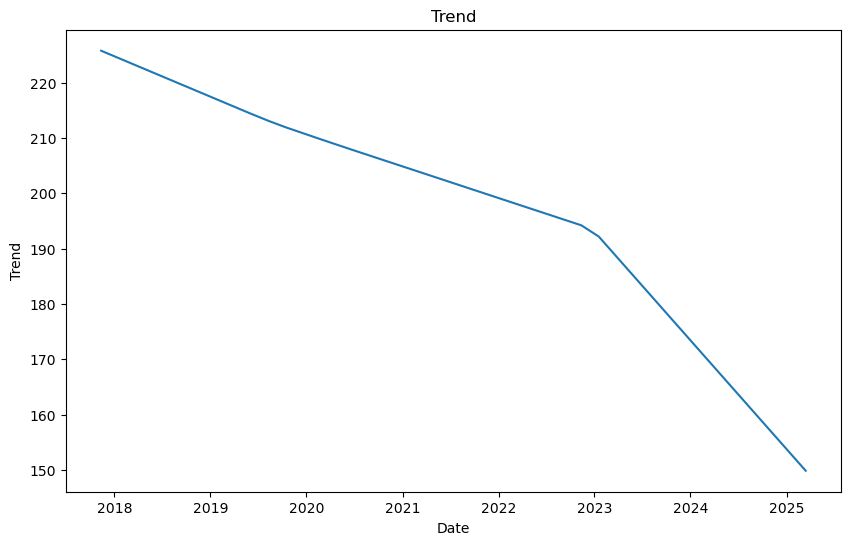

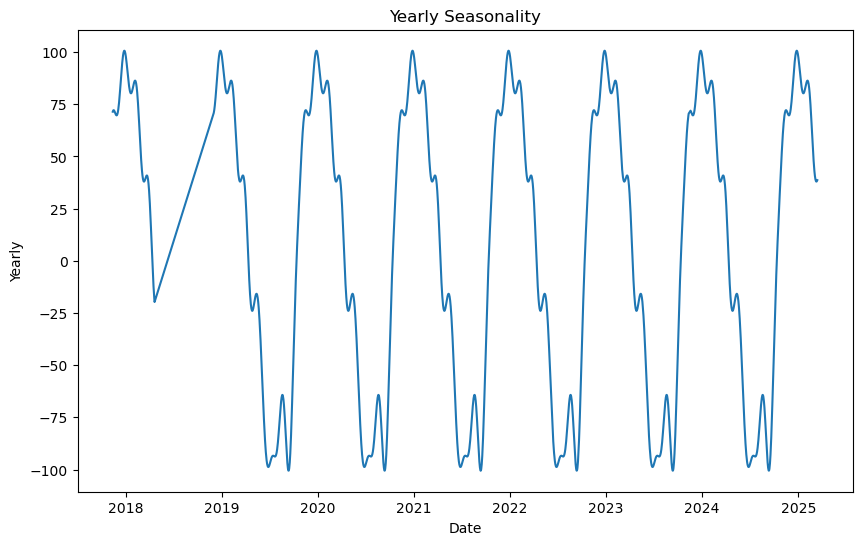

Epoch 1/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2595 - mae: 0.4191 - val_loss: 0.0240 - val_mae: 0.1295
Epoch 2/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0275 - mae: 0.1432 - val_loss: 0.0216 - val_mae: 0.1186
Epoch 3/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0187 - mae: 0.1046 - val_loss: 0.0225 - val_mae: 0.1158
Epoch 4/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0169 - mae: 0.0900 - val_loss: 0.0215 - val_mae: 0.1136
Epoch 5/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0153 - mae: 0.0856 - val_loss: 0.0208 - val_mae: 0.1121
Epoch 6/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0171 - mae: 0.0928 - val_loss: 0.0205 - val_mae: 0.1101
Epoch 7/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0170 - mae: 0.0879 - val_loss: 0.0198 - val_mae: 0.1081
Epoch 8/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0148 - mae: 0.0848 - val_loss: 0.0195 - val_mae: 0.1069
Epoch 9/10
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0151 - mae:

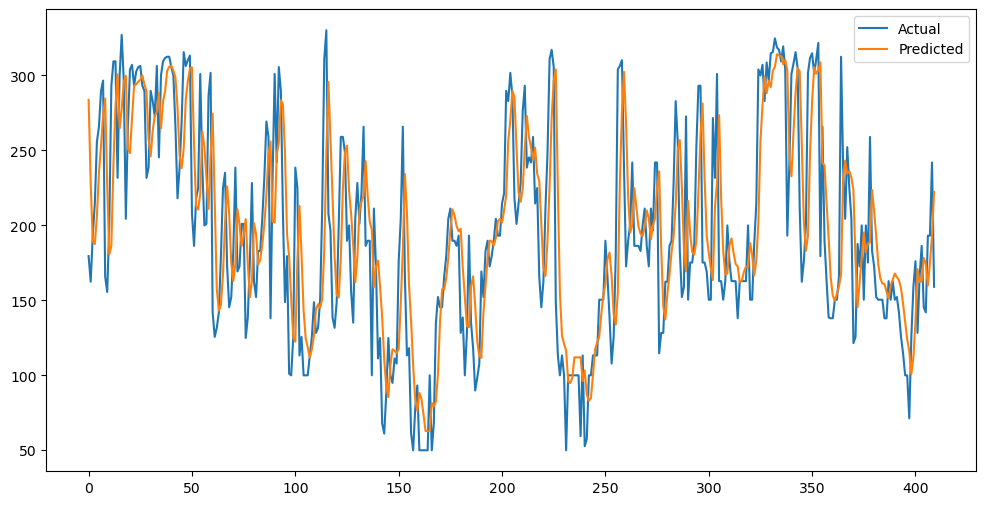

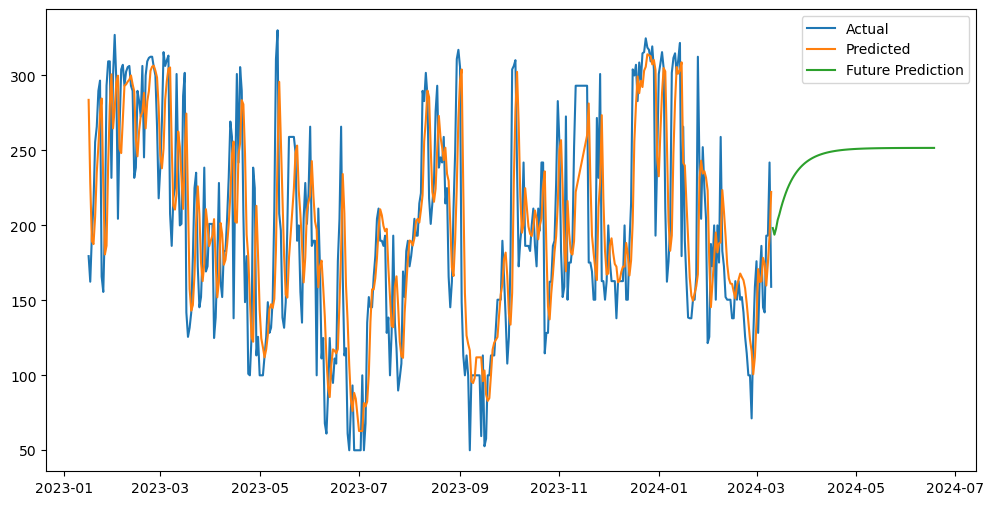

DataFrame for file aqi_Jaipur.csv:
(2715, 9)


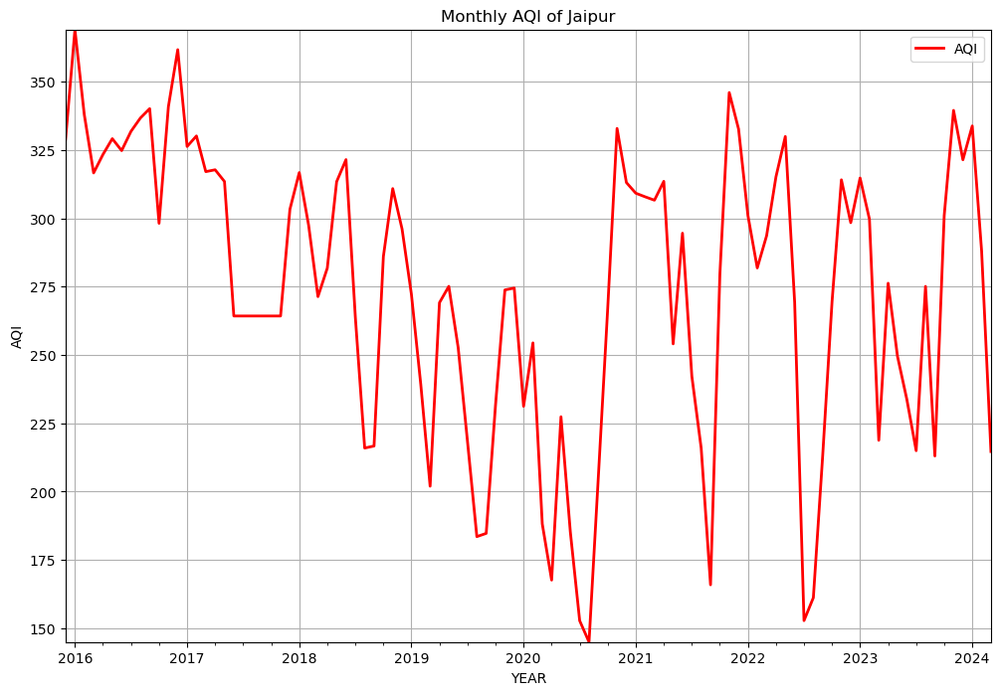

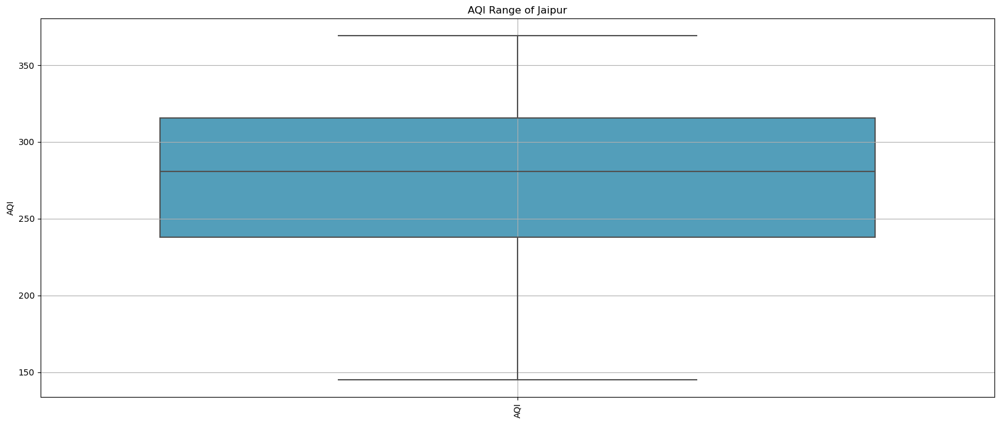

RMSE =  30.859972137307455
MAPE =  8.908062684414379
Mean AQI 267.53784186236805


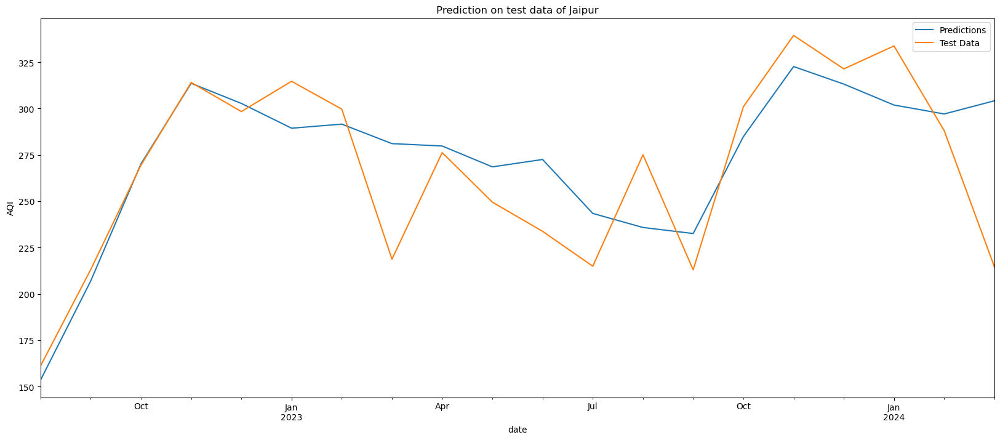

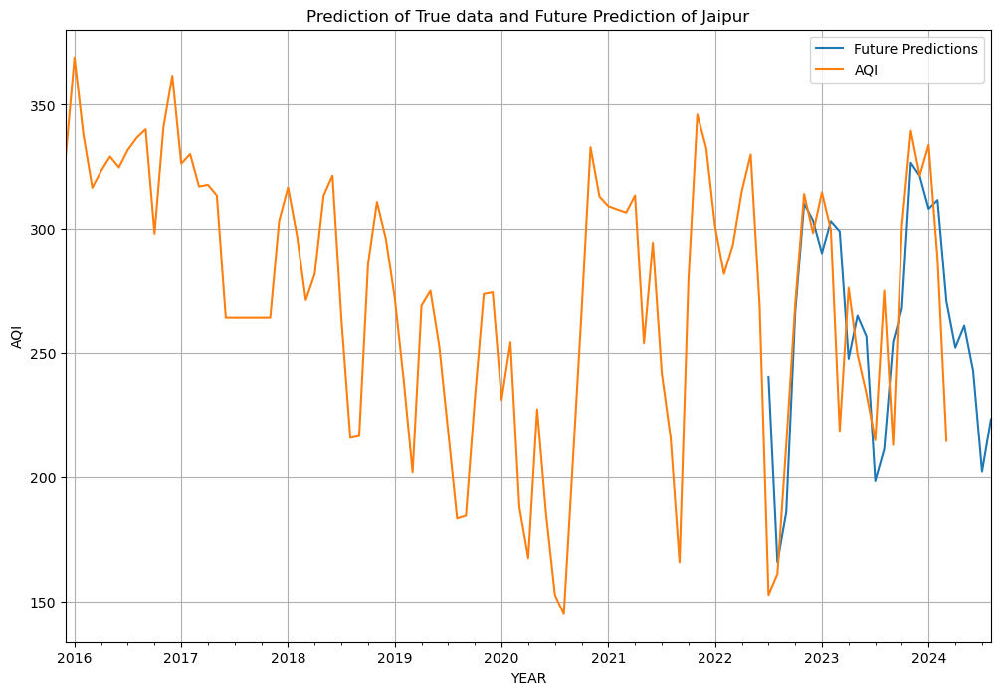

00:35:00 - cmdstanpy - INFO - Chain [1] start processing
00:35:18 - cmdstanpy - INFO - Chain [1] done processing


Root Mean Squared Error: 36.490868164601416
Mean Absolute Percentage Error (MAPE): 12.977304689831637


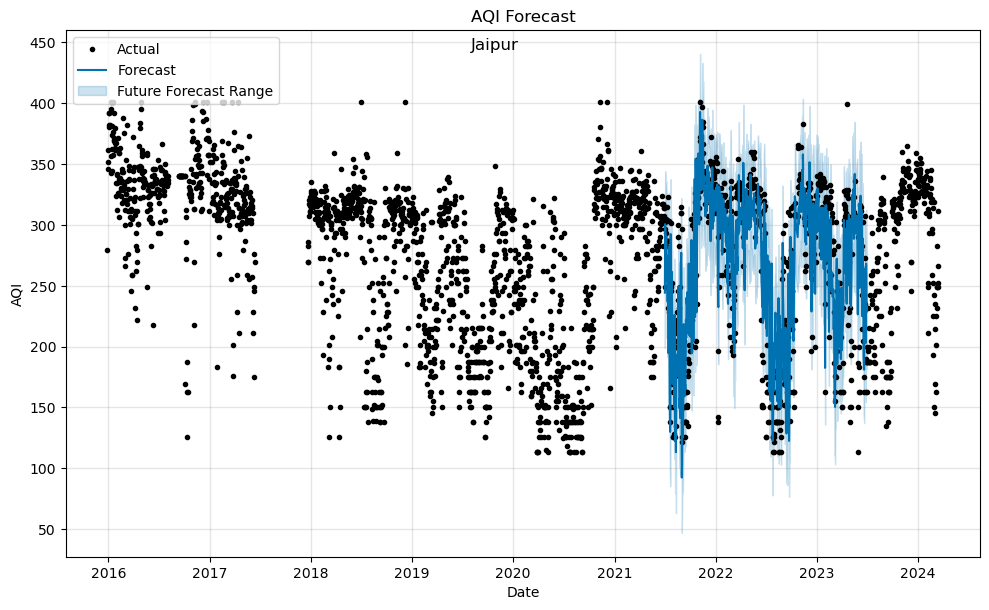

00:35:21 - cmdstanpy - INFO - Chain [1] start processing
00:35:21 - cmdstanpy - INFO - Chain [1] done processing


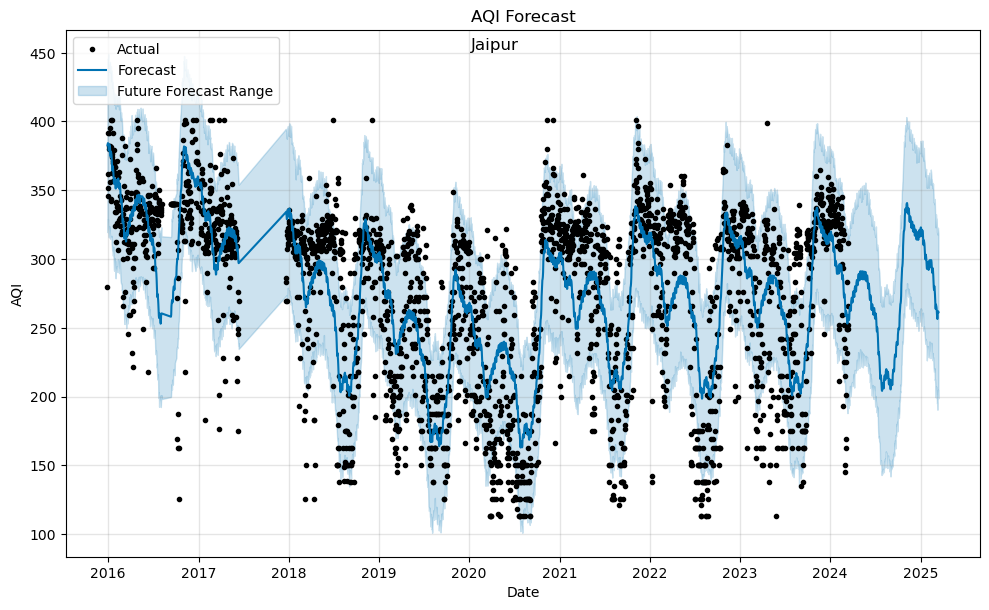

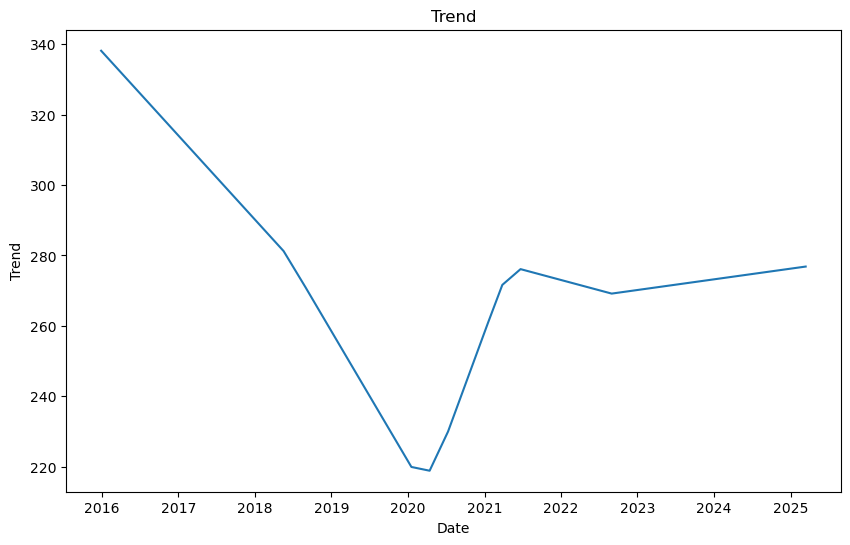

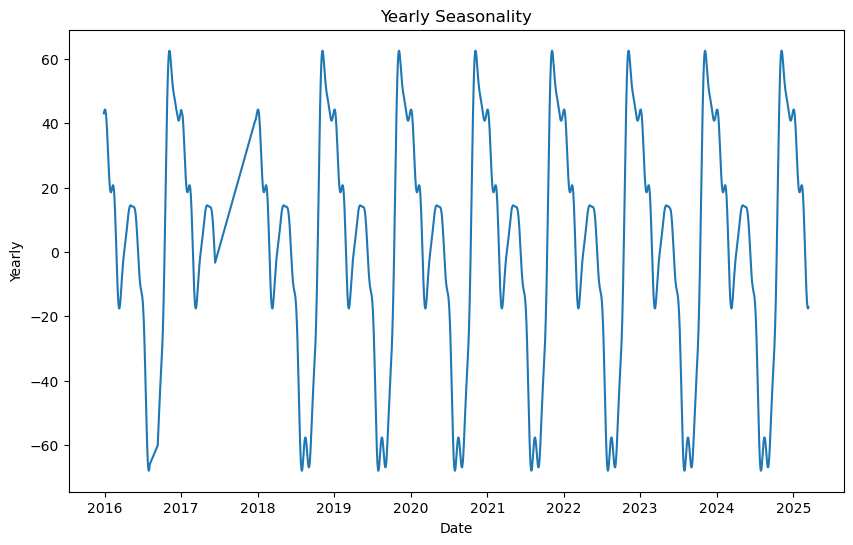

Epoch 1/10
68/68 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 0.2684 - mae: 0.4591 - val_loss: 0.0247 - val_mae: 0.1149
Epoch 2/10
68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0218 - mae: 0.1104 - val_loss: 0.0198 - val_mae: 0.1038
Epoch 3/10
68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0171 - mae: 0.0948 - val_loss: 0.0197 - val_mae: 0.1021
Epoch 4/10
68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0187 - mae: 0.0968 - val_loss: 0.0190 - val_mae: 0.0991
Epoch 5/10
68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0175 - mae: 0.0951 - val_loss: 0.0186 - val_mae: 0.0981
Epoch 6/10
68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0159 - mae: 0.0889 - val_loss: 0.0181 - val_mae: 0.0949
Epoch 7/10
68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0166 - mae: 0.0926 - val_loss: 0.0179 - val_mae: 0.0929
Epoch 8/10
68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0153 - mae: 0.0888 - val_loss: 0.0176 - val_mae: 0.0966
Epoch 9/10
68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0162 - mae:

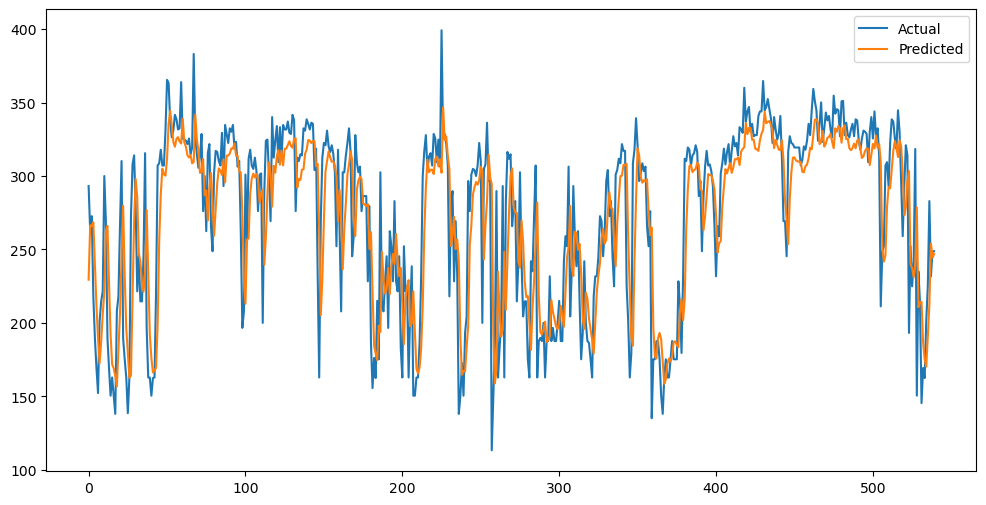

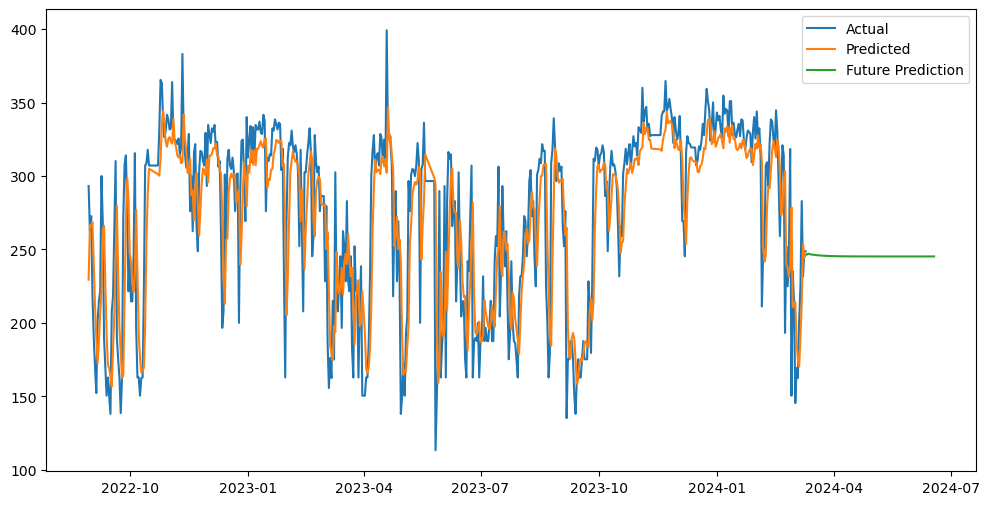

DataFrame for file aqi_Kanpur.csv:
(3230, 9)


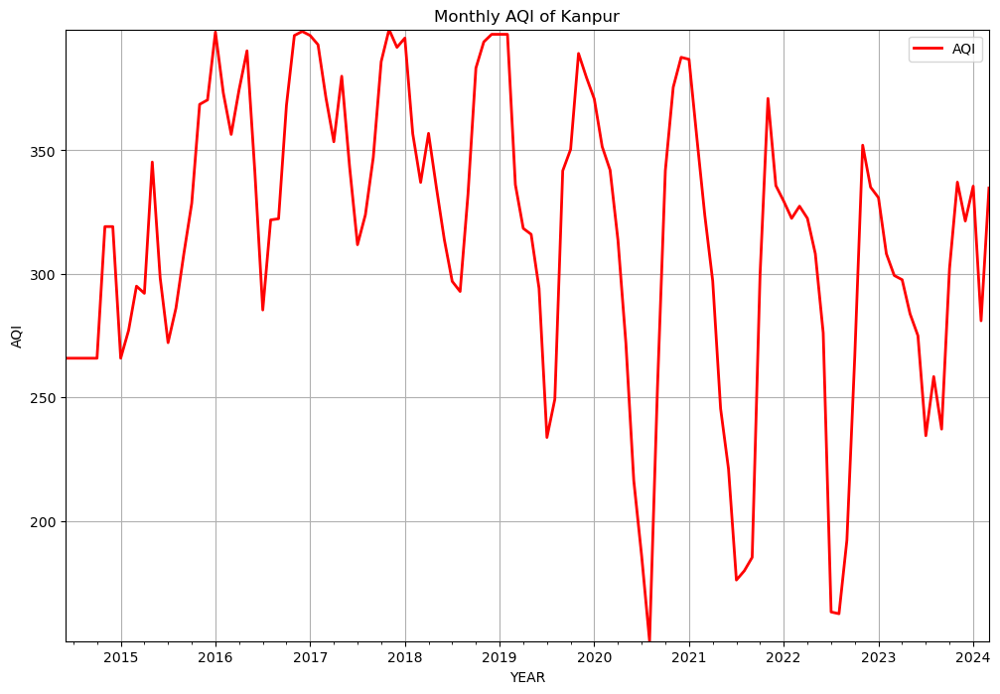

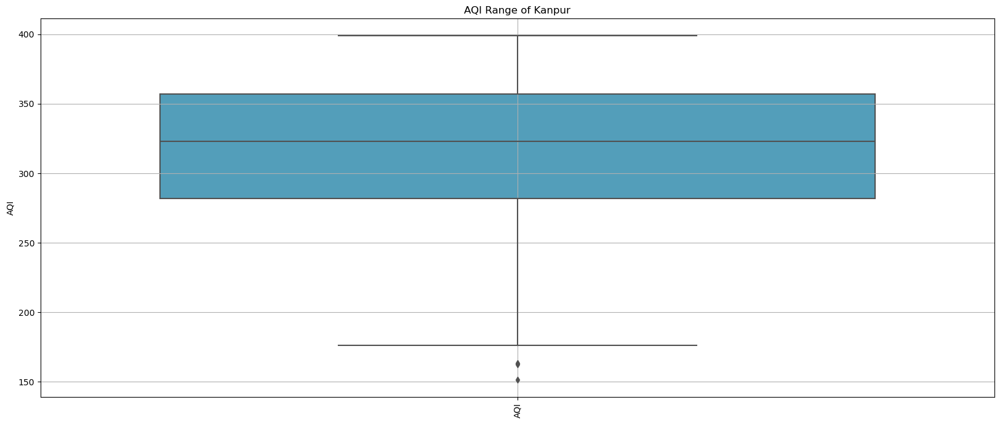

RMSE =  39.183064092051296
MAPE =  12.34041087898683
Mean AQI 283.9727069169221


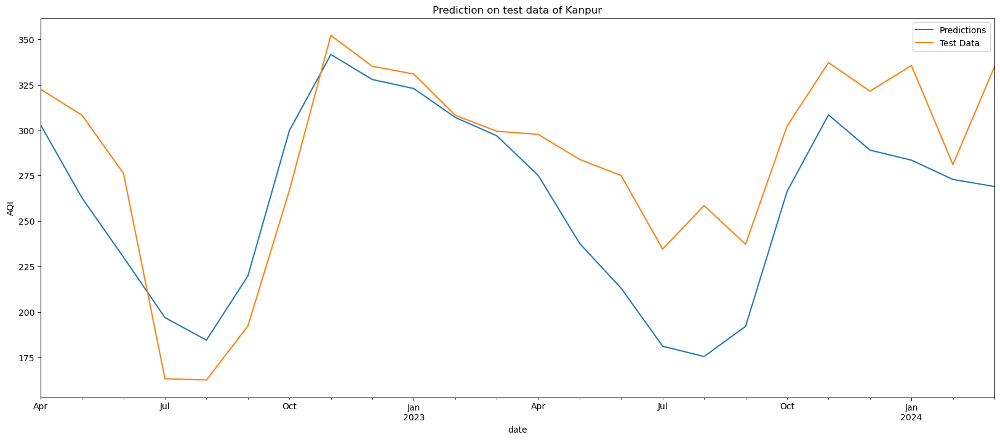

C:\Users\hp\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


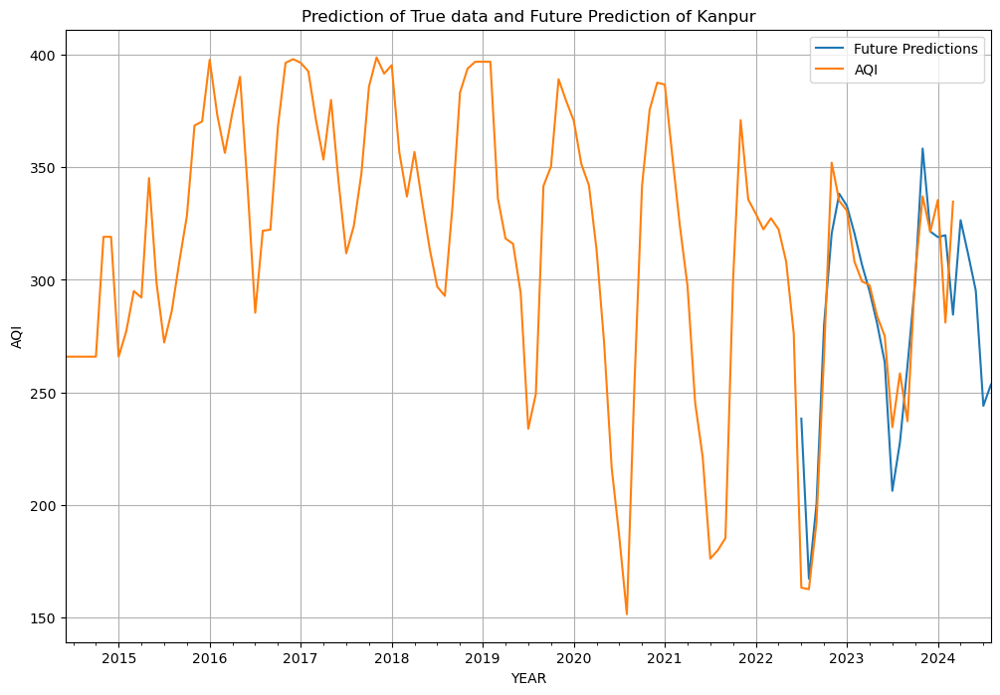

00:37:31 - cmdstanpy - INFO - Chain [1] start processing
00:37:51 - cmdstanpy - INFO - Chain [1] done processing


Root Mean Squared Error: 41.060383203390536
Mean Absolute Percentage Error (MAPE): 15.790814871248603


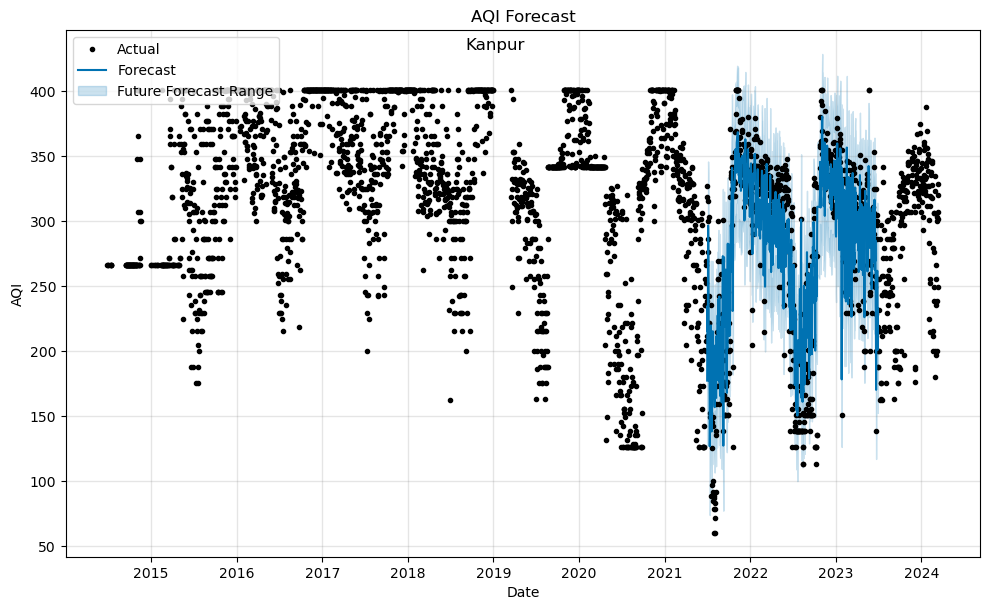

00:37:55 - cmdstanpy - INFO - Chain [1] start processing
00:37:55 - cmdstanpy - INFO - Chain [1] done processing


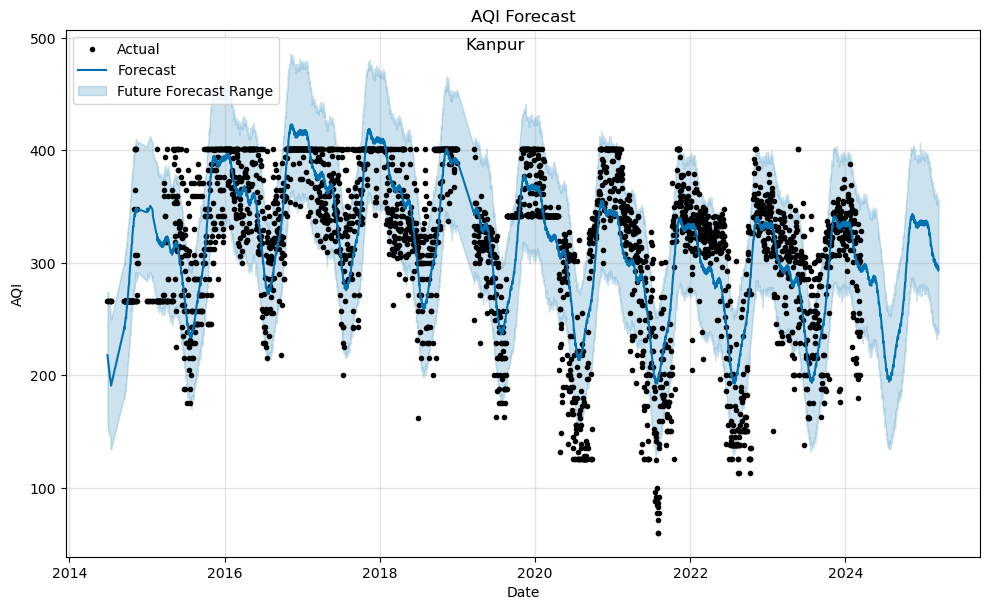

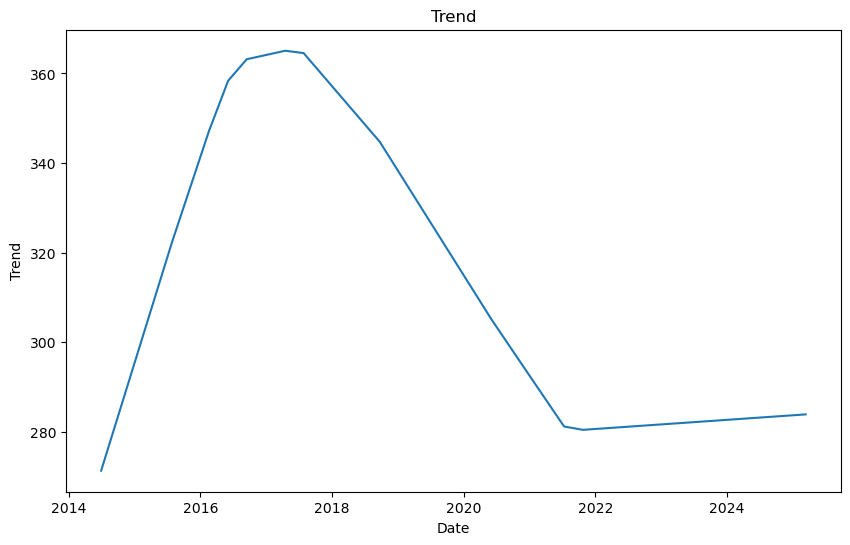

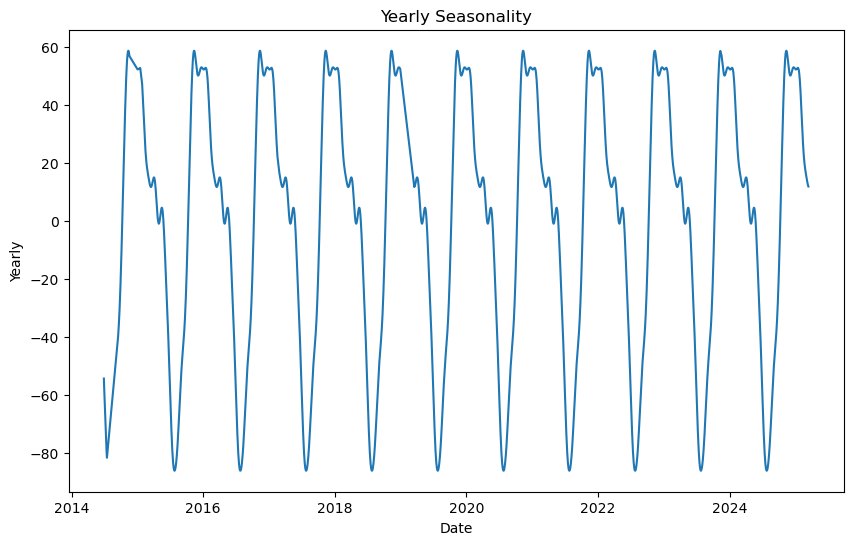

Epoch 1/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.5200 - mae: 0.6751 - val_loss: 0.0232 - val_mae: 0.1133
Epoch 2/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0157 - mae: 0.0905 - val_loss: 0.0182 - val_mae: 0.1017
Epoch 3/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0135 - mae: 0.0845 - val_loss: 0.0165 - val_mae: 0.0956
Epoch 4/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0122 - mae: 0.0779 - val_loss: 0.0162 - val_mae: 0.0936
Epoch 5/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0118 - mae: 0.0770 - val_loss: 0.0161 - val_mae: 0.0928
Epoch 6/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0120 - mae: 0.0766 - val_loss: 0.0157 - val_mae: 0.0914
Epoch 7/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0121 - mae: 0.0777 - val_loss: 0.0152 - val_mae: 0.0898
Epoch 8/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0115 - mae: 0.0755 - val_loss: 0.0150 - val_mae: 0.0889
Epoch 9/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0114 - mae:

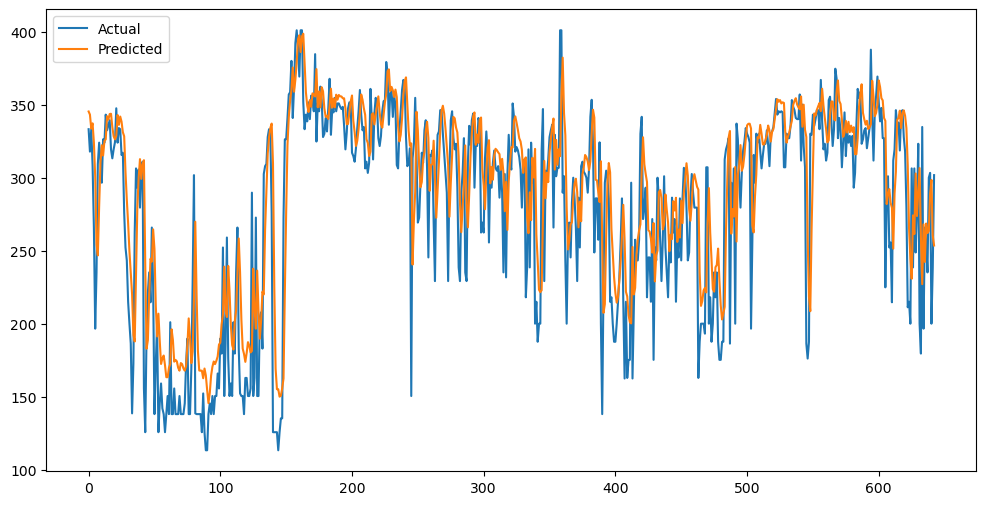

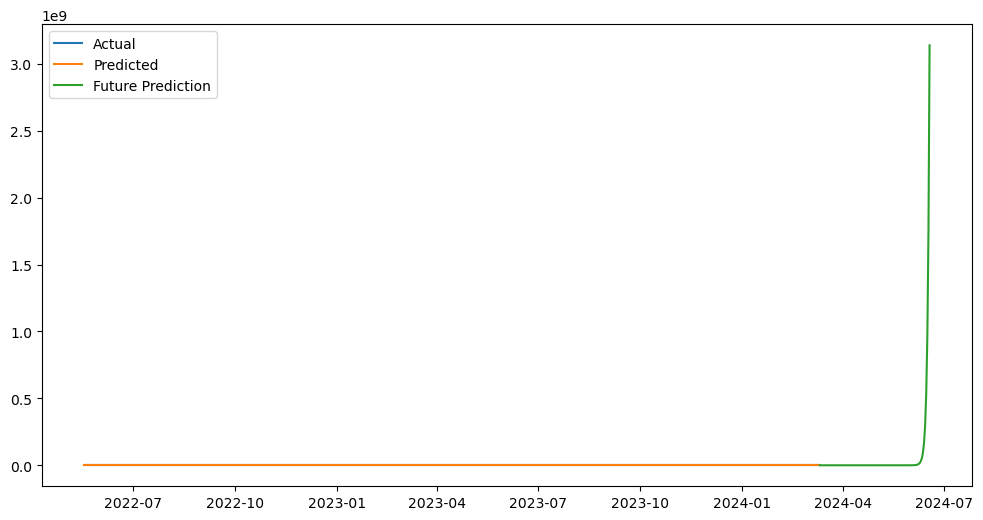

DataFrame for file aqi_Kolkata.csv:
(1549, 9)


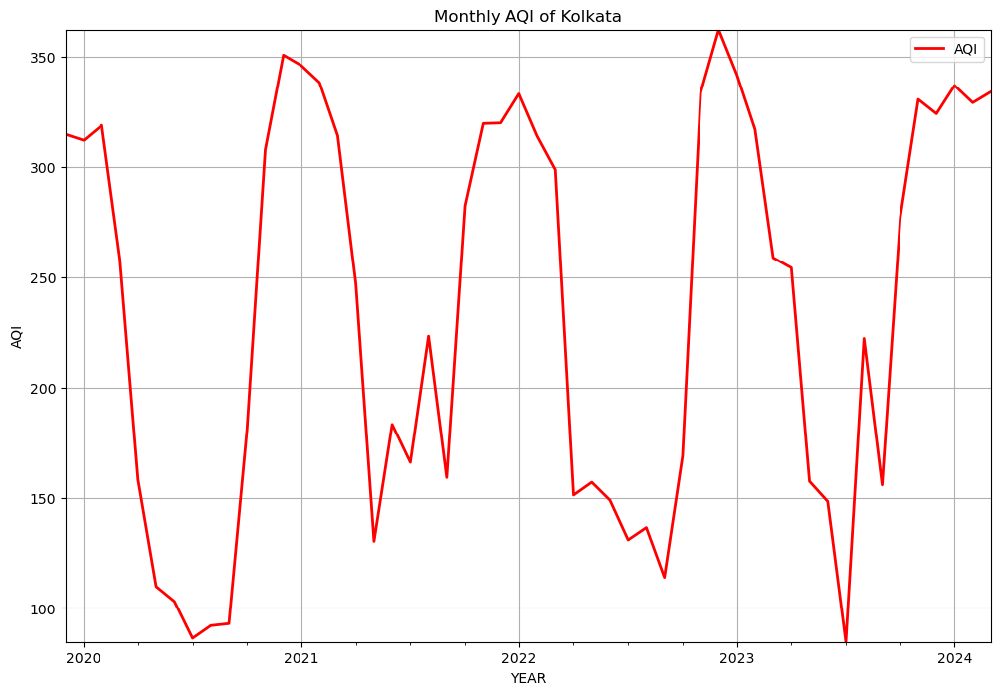

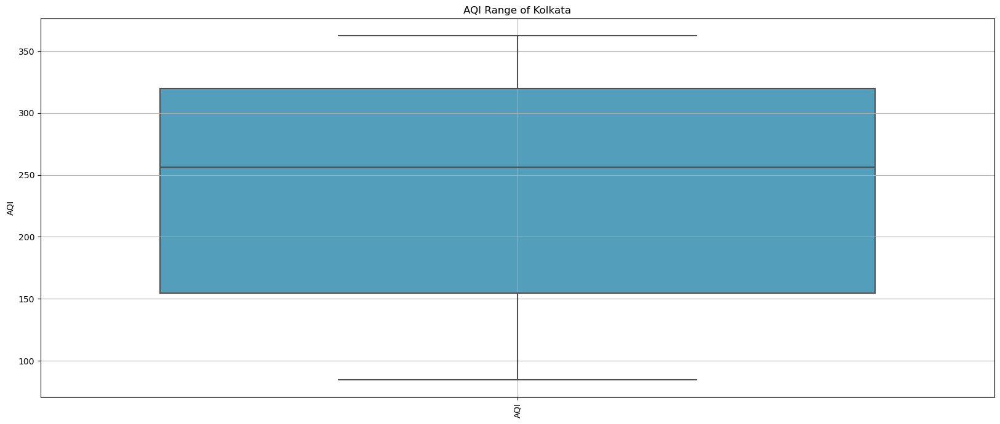

RMSE =  42.31283438248881
MAPE =  21.410925503181392
Mean AQI 245.42026685028074


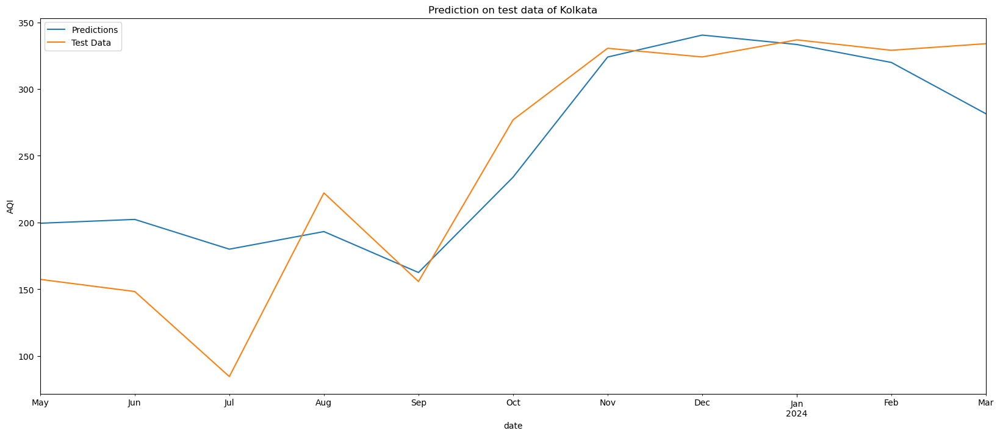

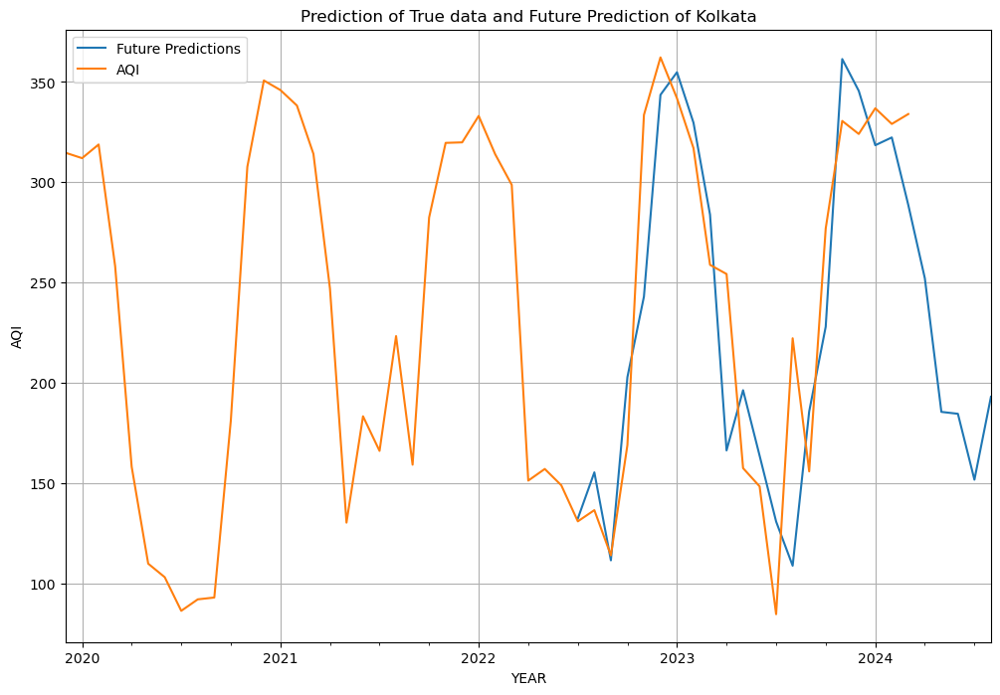

00:39:27 - cmdstanpy - INFO - Chain [1] start processing
00:39:37 - cmdstanpy - INFO - Chain [1] done processing


Root Mean Squared Error: 22.086144916233682
Mean Absolute Percentage Error (MAPE): 9.064621548567834


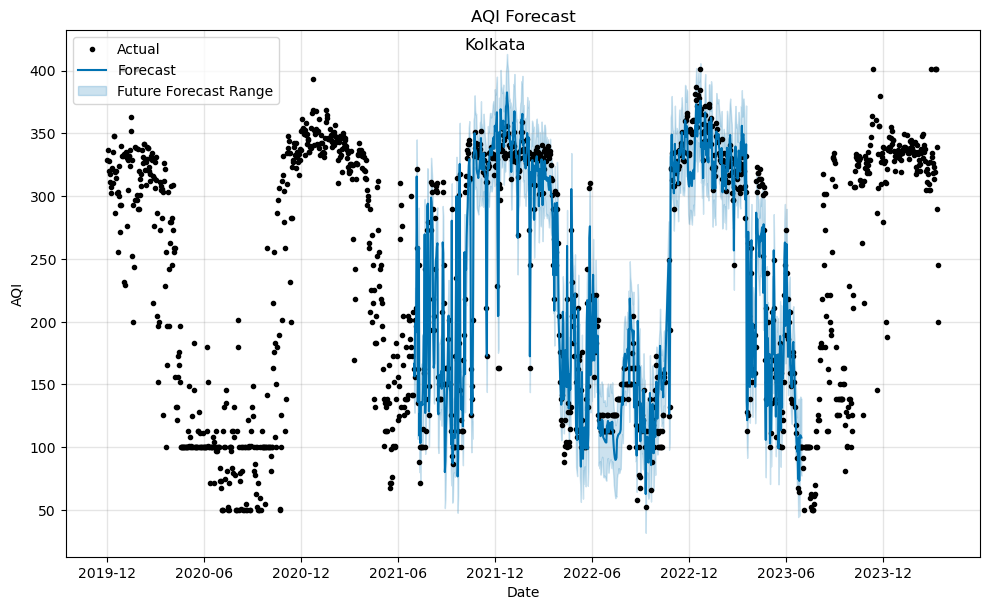

00:39:39 - cmdstanpy - INFO - Chain [1] start processing
00:39:40 - cmdstanpy - INFO - Chain [1] done processing


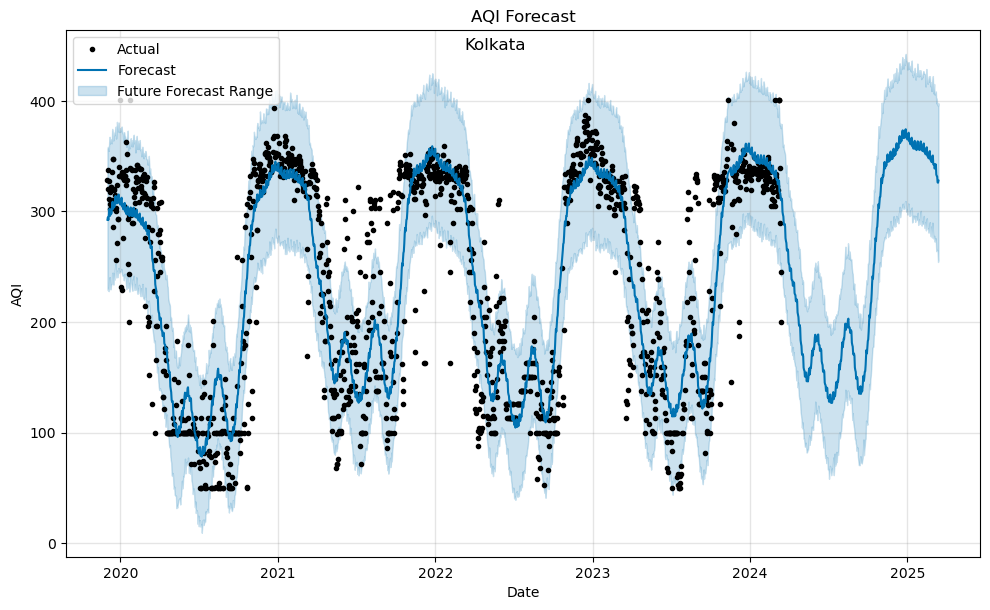

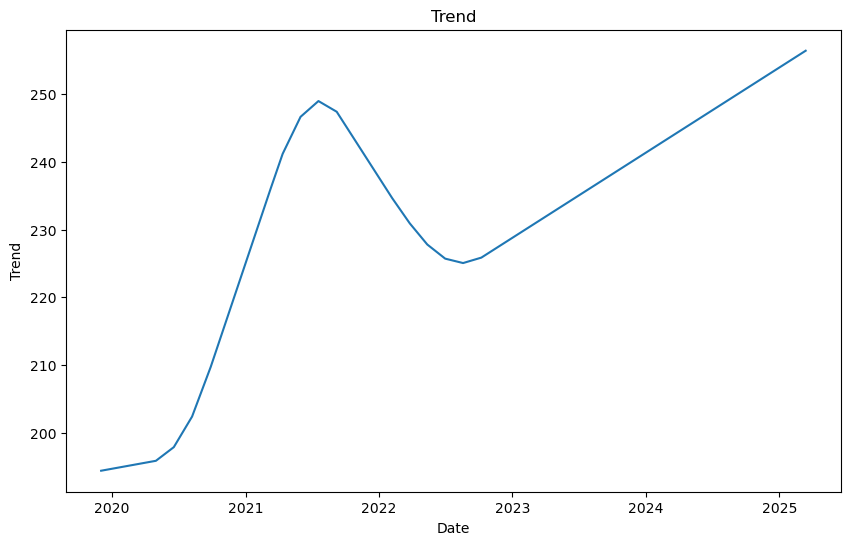

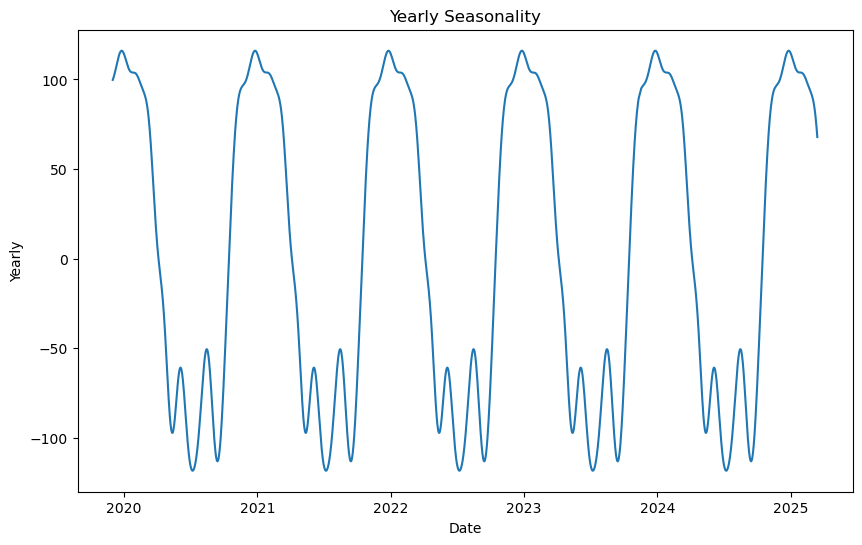

Epoch 1/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2667 - mae: 0.4419 - val_loss: 0.1248 - val_mae: 0.2929
Epoch 2/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0762 - mae: 0.2248 - val_loss: 0.0254 - val_mae: 0.1270
Epoch 3/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0240 - mae: 0.1282 - val_loss: 0.0168 - val_mae: 0.0965
Epoch 4/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0165 - mae: 0.0908 - val_loss: 0.0149 - val_mae: 0.0792
Epoch 5/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0152 - mae: 0.0835 - val_loss: 0.0146 - val_mae: 0.0772
Epoch 6/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0168 - mae: 0.0858 - val_loss: 0.0145 - val_mae: 0.0781
Epoch 7/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0160 - mae: 0.0847 - val_loss: 0.0143 - val_mae: 0.0768
Epoch 8/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0155 - mae: 0.0833 - val_loss: 0.0142 - val_mae: 0.0780
Epoch 9/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0165 -

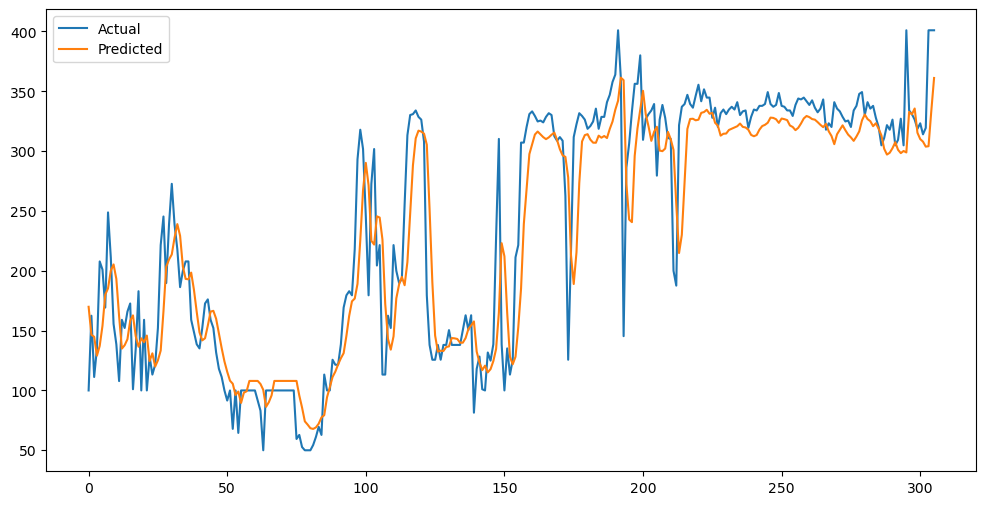

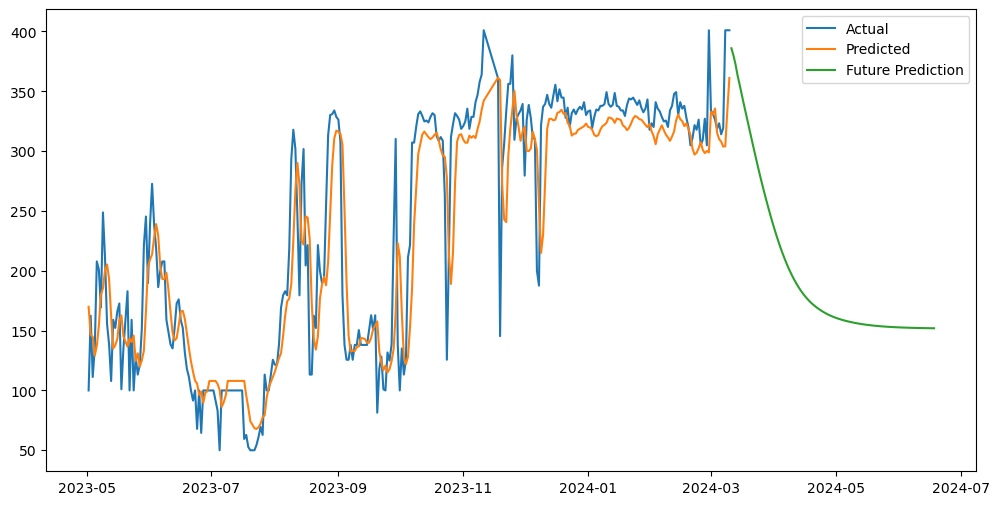

DataFrame for file aqi_Lucknow.csv:
(2923, 9)


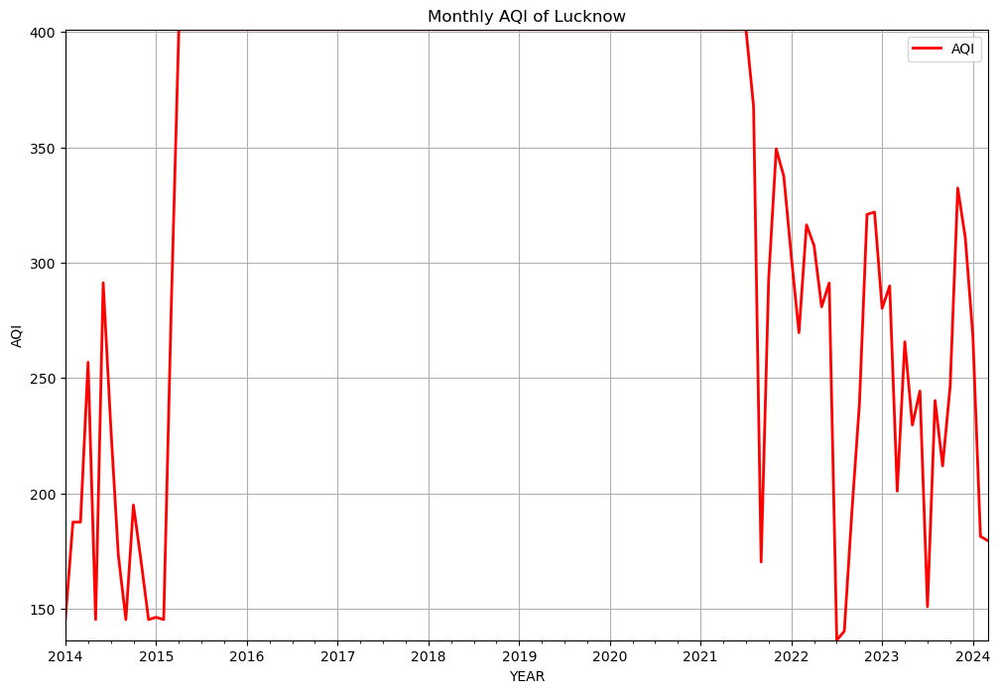

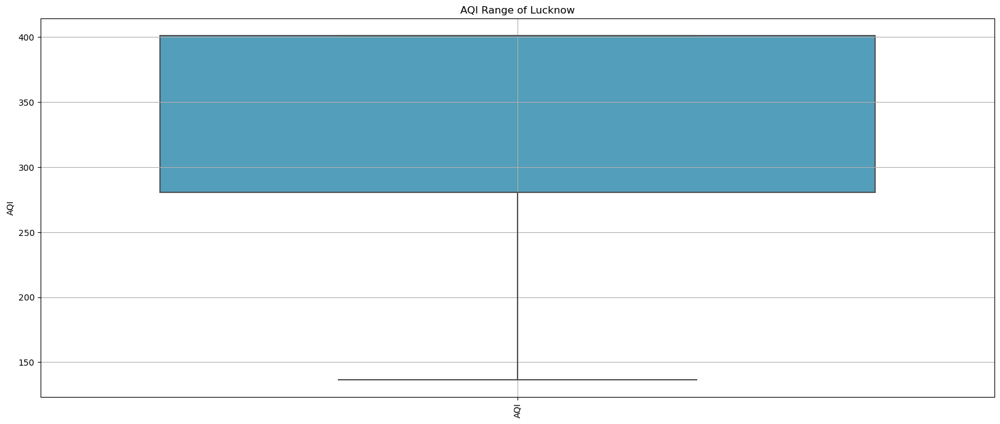

RMSE =  62.88230805790628
MAPE =  25.8711650441711
Mean AQI 247.18391265943046


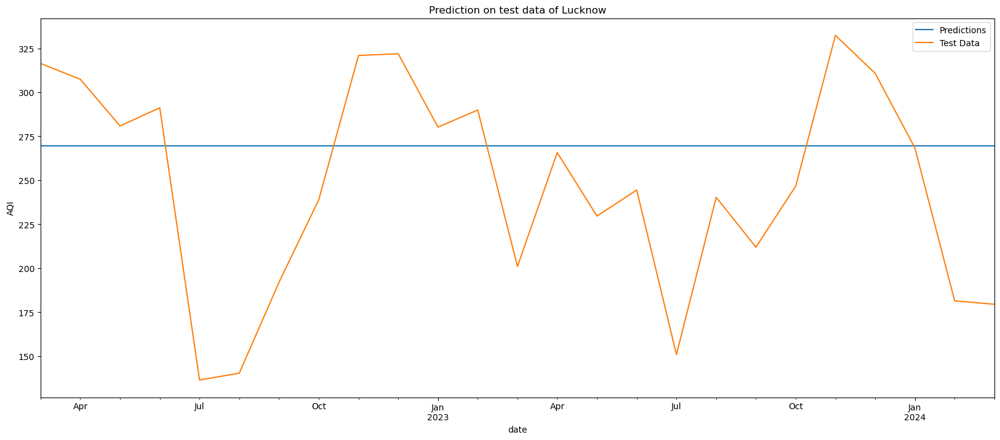

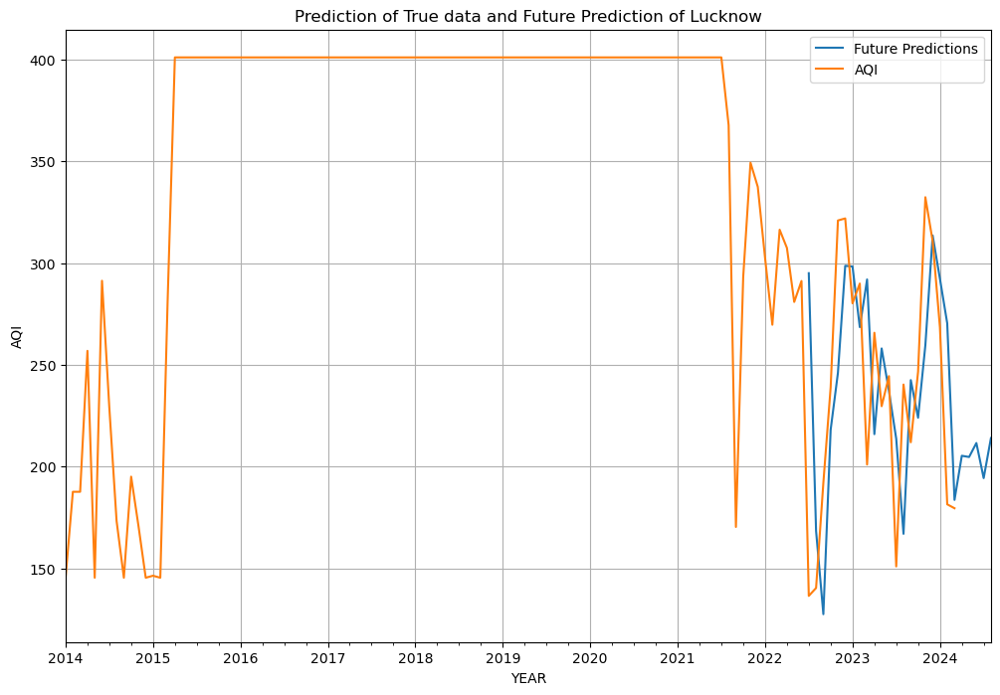

00:41:26 - cmdstanpy - INFO - Chain [1] start processing
00:41:53 - cmdstanpy - INFO - Chain [1] done processing


Root Mean Squared Error: 53.677164509084825
Mean Absolute Percentage Error (MAPE): 22.131251211543148


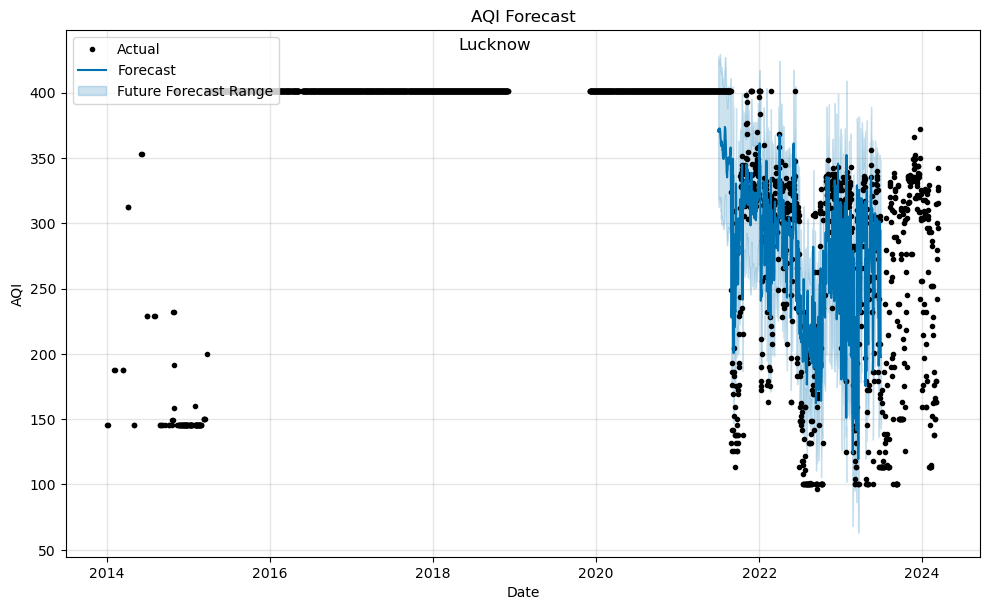

00:41:56 - cmdstanpy - INFO - Chain [1] start processing
00:41:57 - cmdstanpy - INFO - Chain [1] done processing


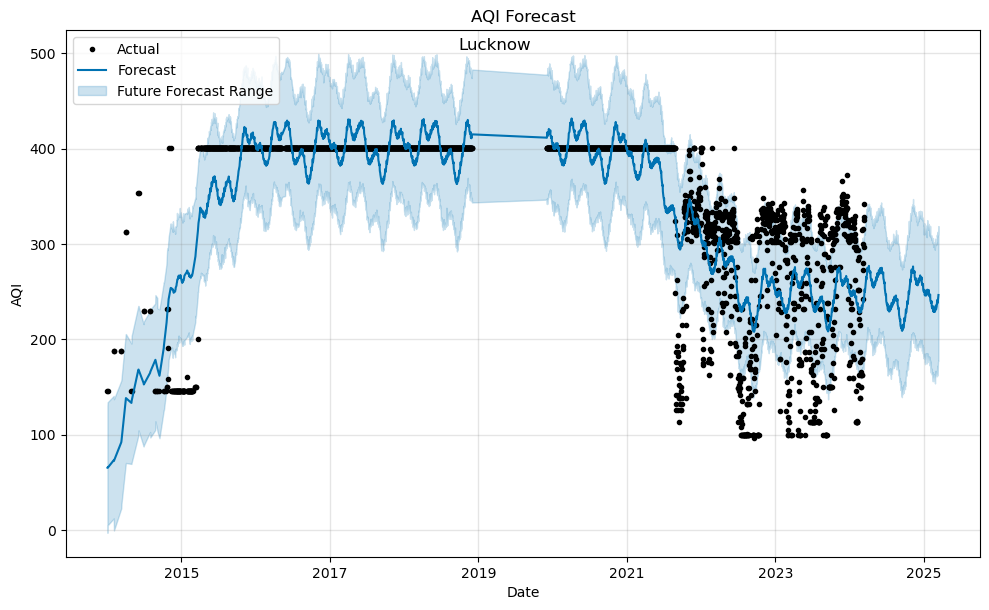

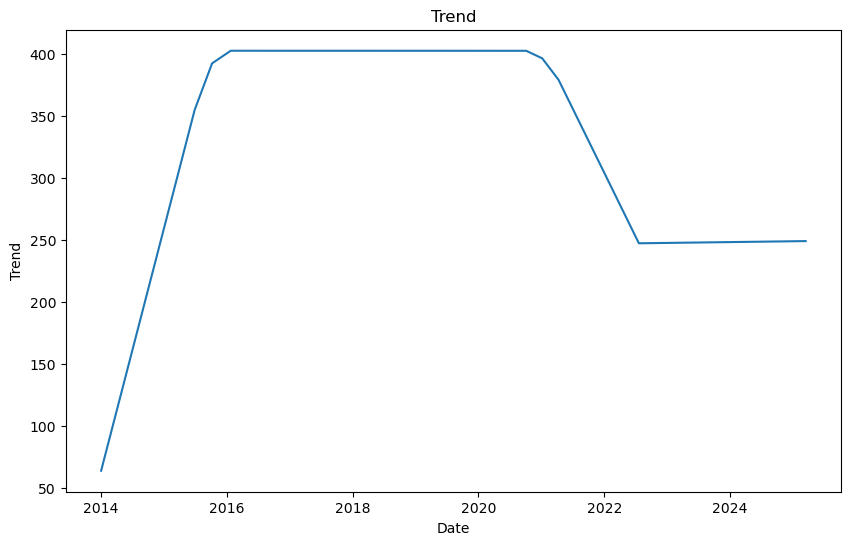

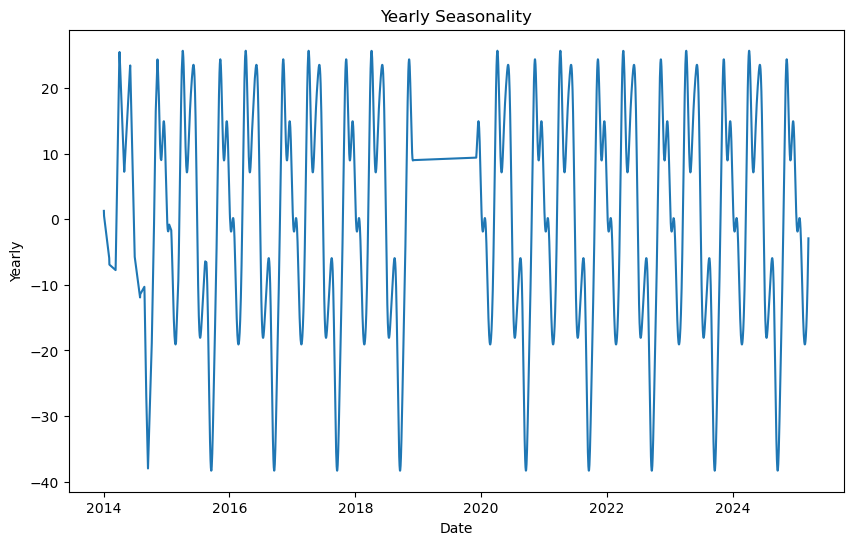

Epoch 1/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.7026 - mae: 0.8007 - val_loss: 0.0435 - val_mae: 0.1753
Epoch 2/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0126 - mae: 0.0793 - val_loss: 0.0426 - val_mae: 0.1564
Epoch 3/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0058 - mae: 0.0295 - val_loss: 0.0377 - val_mae: 0.1428
Epoch 4/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0052 - mae: 0.0245 - val_loss: 0.0373 - val_mae: 0.1419
Epoch 5/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0050 - mae: 0.0253 - val_loss: 0.0367 - val_mae: 0.1398
Epoch 6/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0046 - mae: 0.0222 - val_loss: 0.0360 - val_mae: 0.1387
Epoch 7/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0051 - mae: 0.0237 - val_loss: 0.0354 - val_mae: 0.1375
Epoch 8/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0051 - mae: 0.0245 - val_loss: 0.0357 - val_mae: 0.1365
Epoch 9/10
73/73 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0056 - mae:

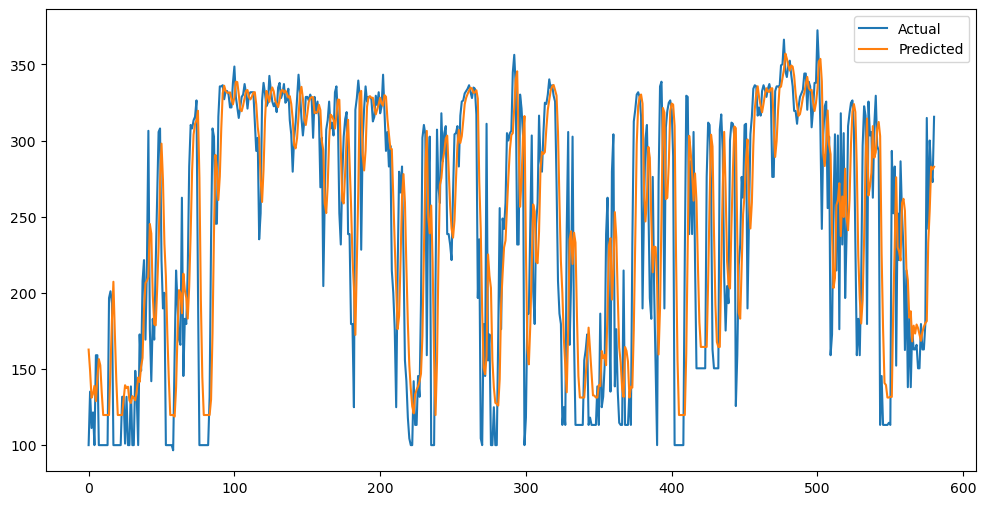

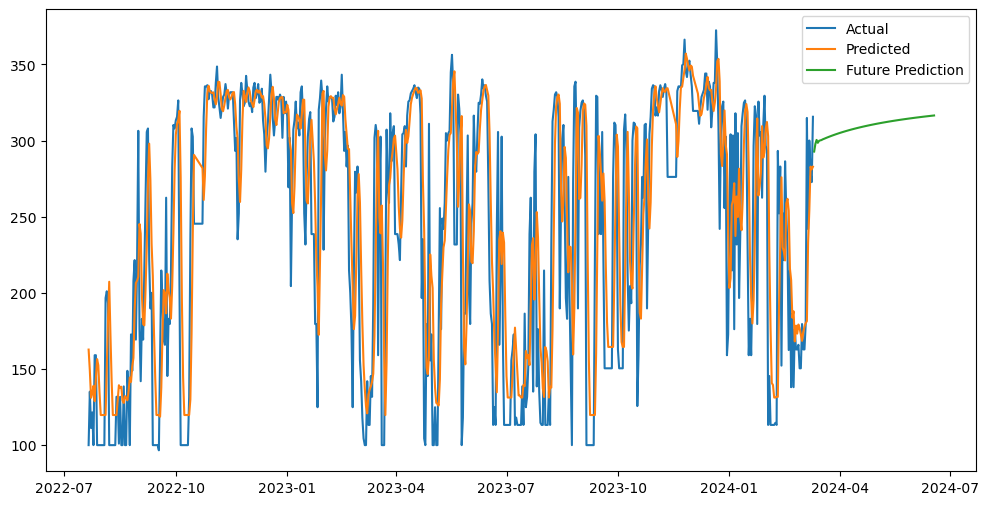

DataFrame for file aqi_Mumbai.csv:
(2529, 9)


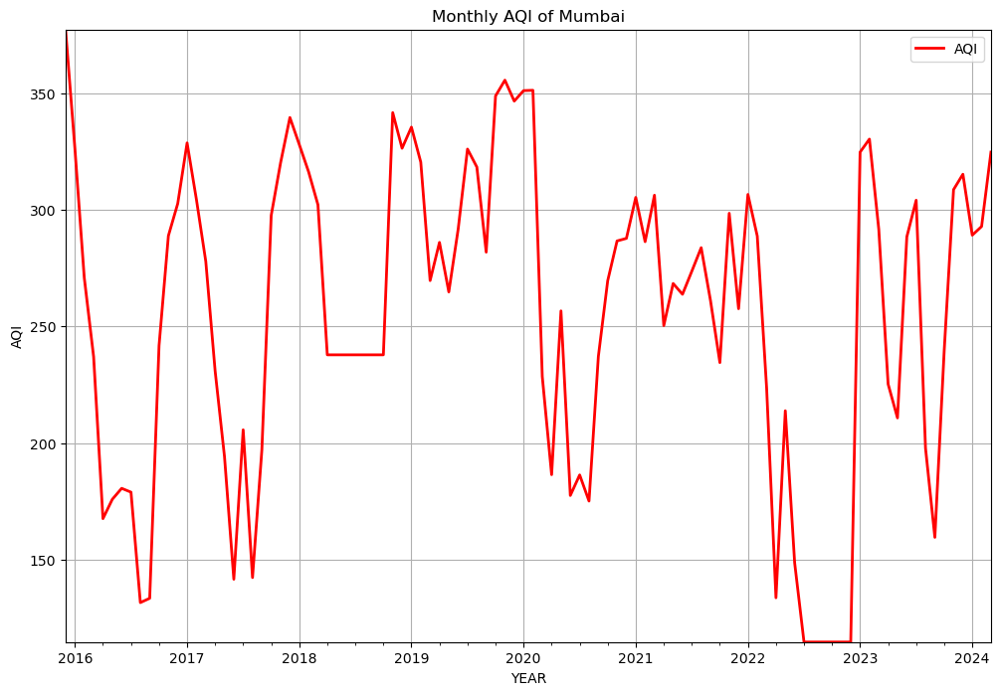

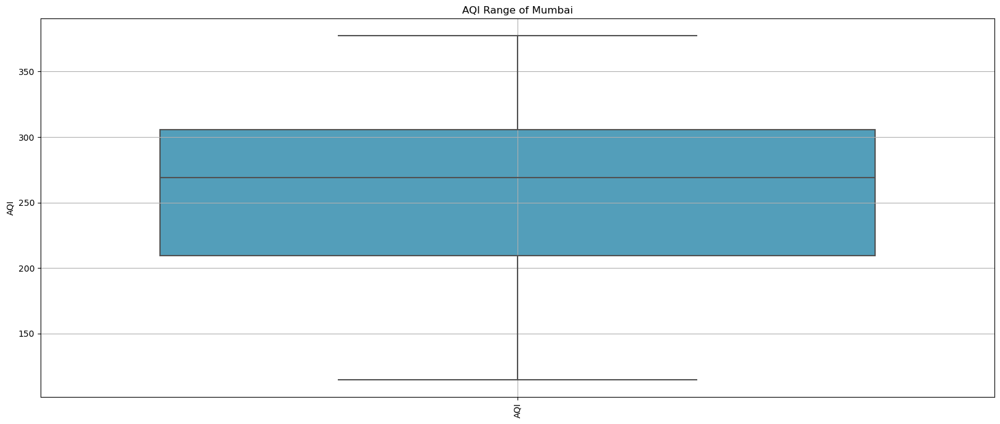

RMSE =  118.20205127647299
MAPE =  40.445211917129654
Mean AQI 233.83724639724224


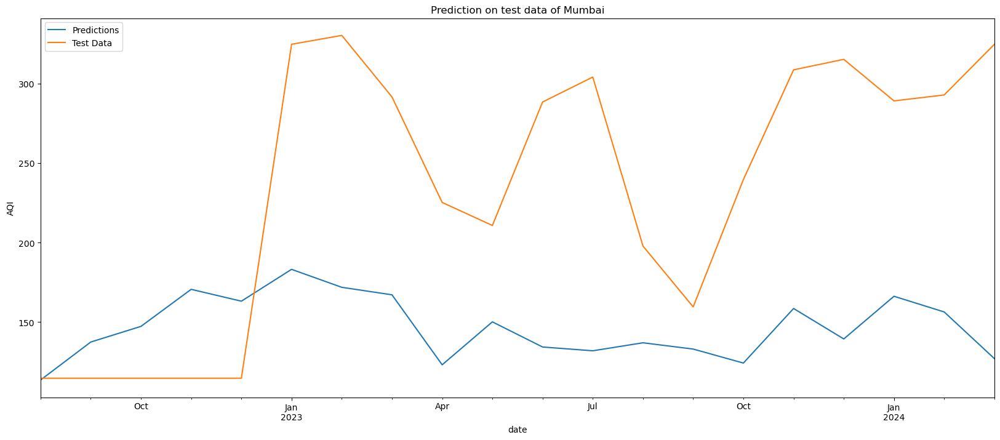

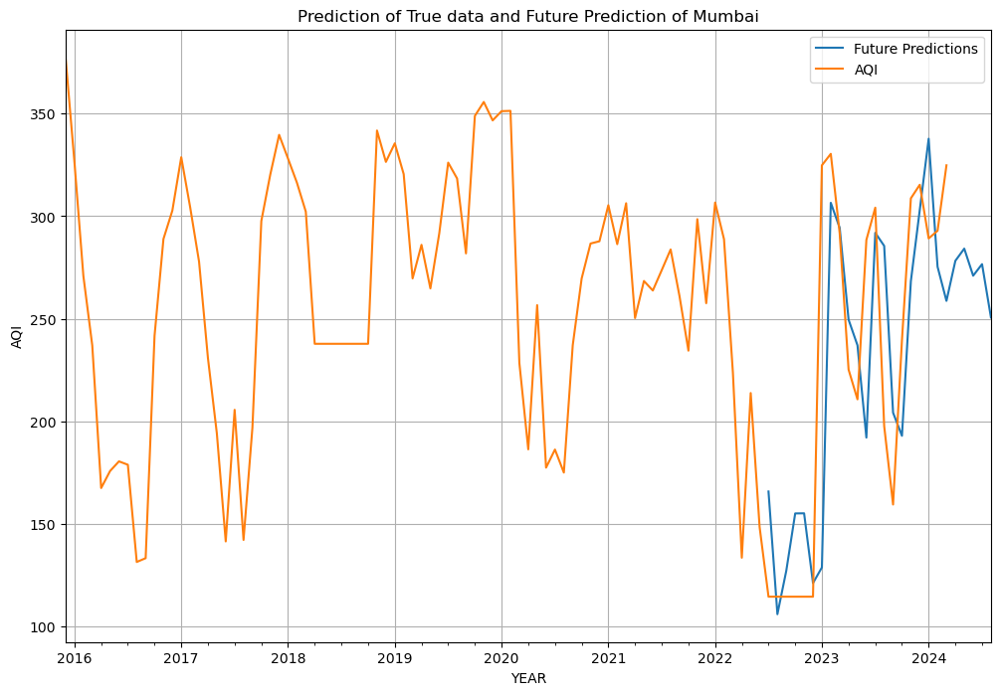

00:43:47 - cmdstanpy - INFO - Chain [1] start processing
00:44:03 - cmdstanpy - INFO - Chain [1] done processing


Root Mean Squared Error: 45.10134079732524
Mean Absolute Percentage Error (MAPE): 19.316620833944032


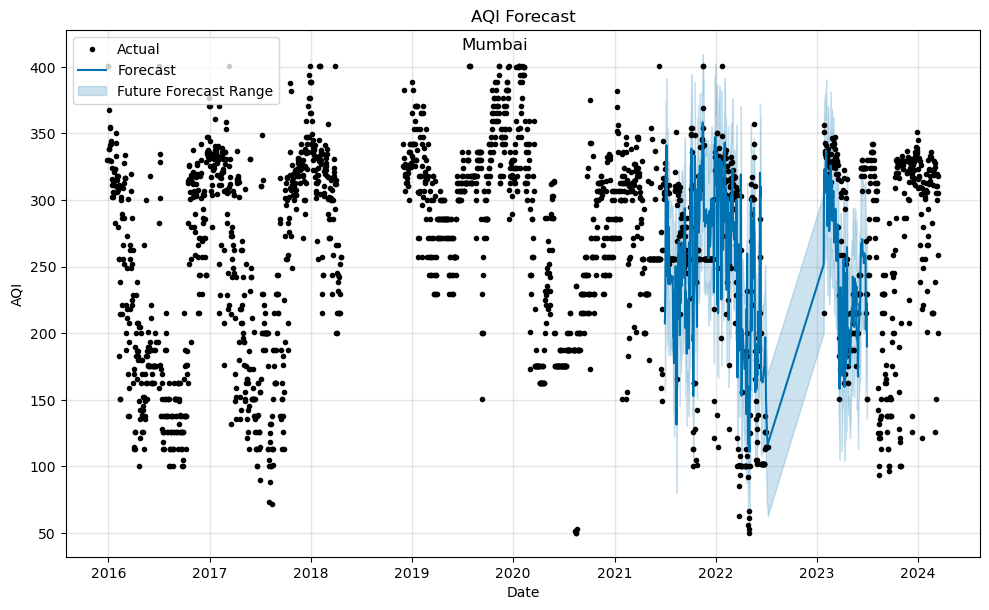

00:44:06 - cmdstanpy - INFO - Chain [1] start processing
00:44:06 - cmdstanpy - INFO - Chain [1] done processing


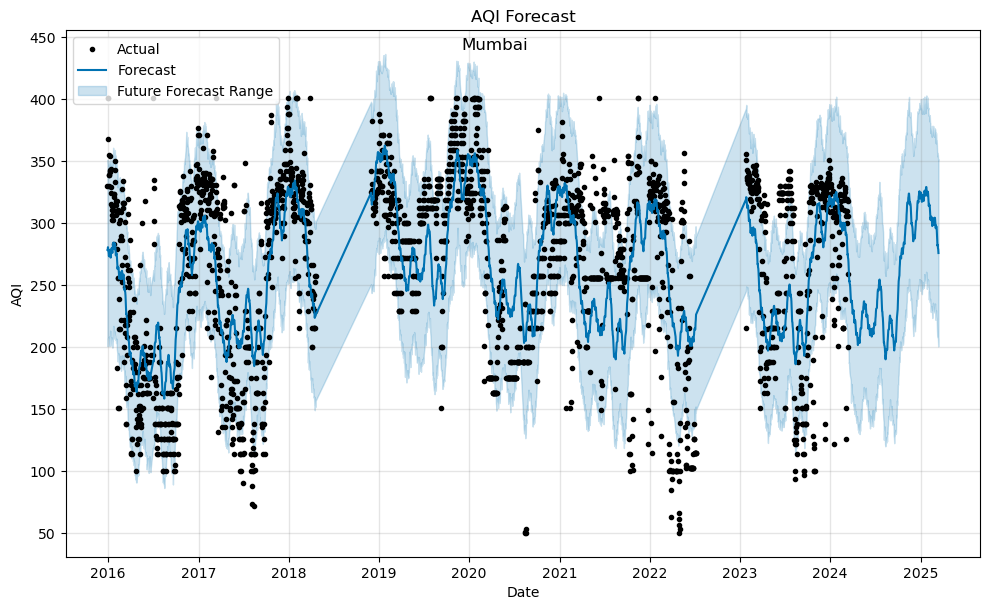

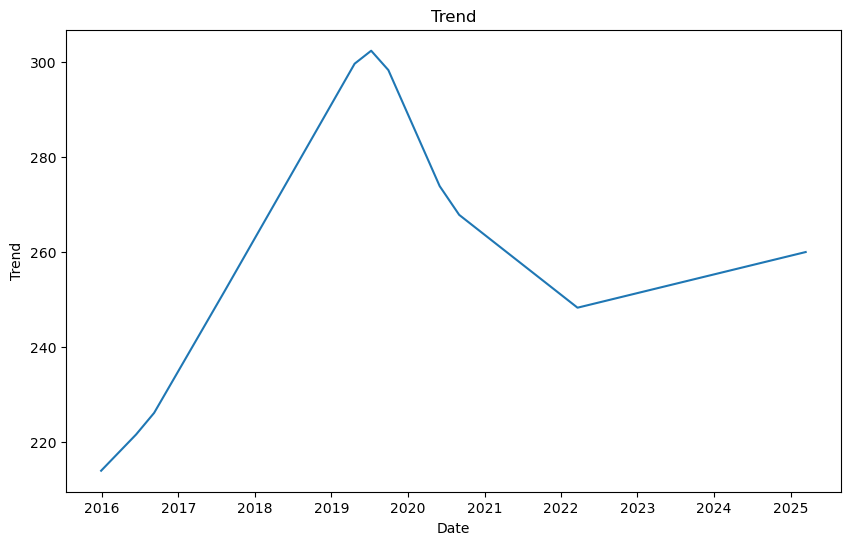

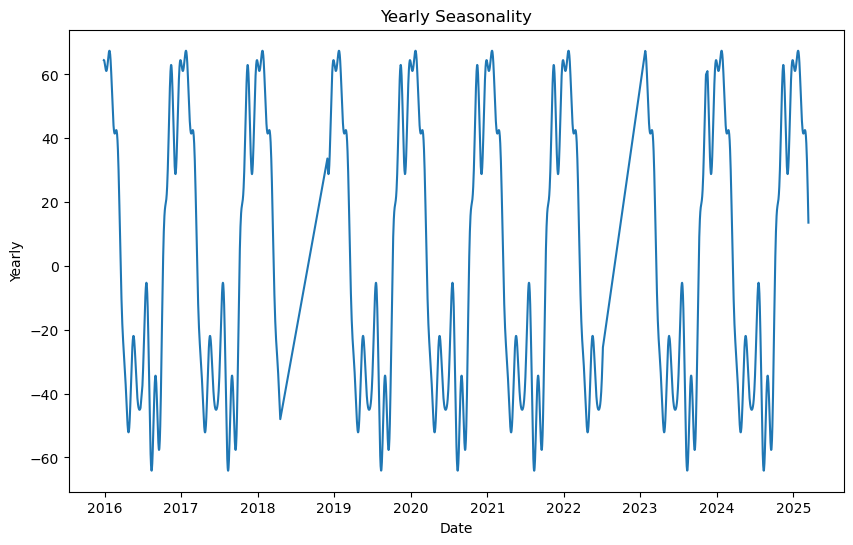

Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2314 - mae: 0.4393 - val_loss: 0.0221 - val_mae: 0.1188
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0147 - mae: 0.0895 - val_loss: 0.0221 - val_mae: 0.1090
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0133 - mae: 0.0847 - val_loss: 0.0209 - val_mae: 0.1072
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0135 - mae: 0.0838 - val_loss: 0.0201 - val_mae: 0.1014
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0126 - mae: 0.0799 - val_loss: 0.0198 - val_mae: 0.0992
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0138 - mae: 0.0813 - val_loss: 0.0196 - val_mae: 0.0960
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0117 - mae: 0.0744 - val_loss: 0.0195 - val_mae: 0.0938
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0121 - mae: 0.0773 - val_loss: 0.0190 - val_mae: 0.0962
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0122 - mae

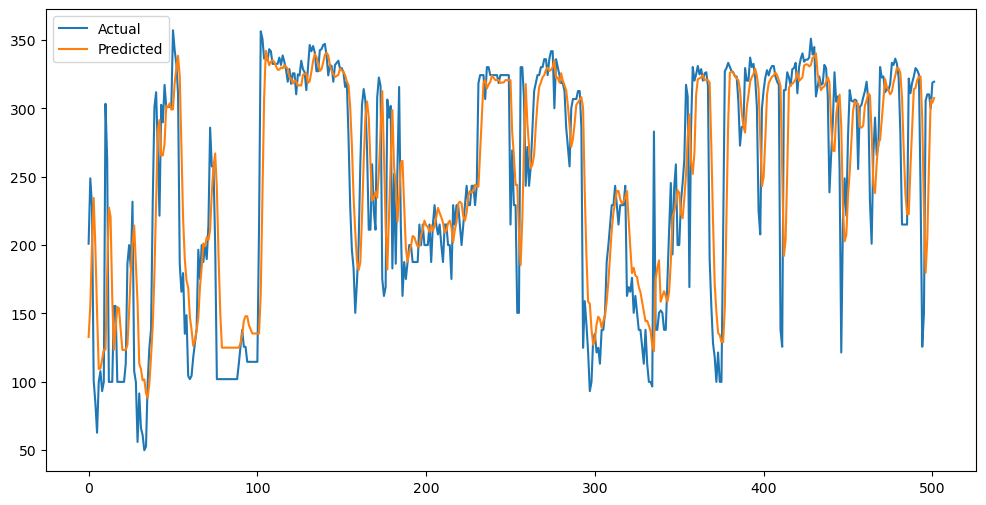

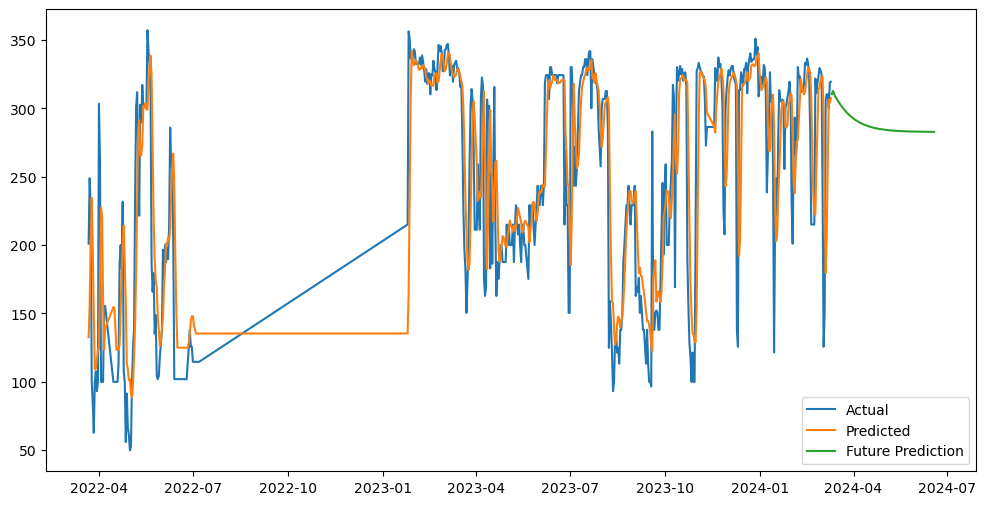

         city  rmseSarima  rmseProphet   rmseLstm
0   Ahmedabad   36.271477    29.473412  43.010711
1   Bangalore   53.024737    49.999321  41.415312
2      Bhopal   59.747452    11.002636  38.664183
3     Chennai   81.706562    32.492609  42.943692
4       Delhi   16.980743    20.173466  39.404833
5   Hyderabad   50.074972    30.439338  47.292955
6      Jaipur   30.859972    36.490868  37.864828
7      Kanpur   39.183064    41.060383  42.572559
8     Kolkata   42.312834    22.086145  41.881943
9     Lucknow   62.882308    53.677165  56.287084
10     Mumbai  118.202051    45.101341  48.094421


In [10]:
import pandas as pd



# List to collect data for each city

datar = []
datam = []

for filename, df in dfs.items():
    print(f"DataFrame for file {filename}:")
    print(df.shape)
    cit = df['Location'].unique()
    rmseS = computeSarima(df)
    rmseP = computePROPHET(df)
    rmseL=computeLSTM(df)
    #rmseR=0
    # Collect data in the list
    datar.append({'city': cit[0], 'rmseSarima': rmseS[0] ,'rmseProphet': rmseP[0] ,'rmseLstm': rmseL[0]})
    datam.append({'city': cit[0], 'mapeSarima': rmseS[1] ,'mapeProphet': rmseP[1] ,'mapeLstm': rmseL[1]})

# Convert the list to a DataFrame
df_rm = pd.DataFrame(datar)
df_m = pd.DataFrame(datam)

# Display the RMSE DataFrame
print(df_rm)


In [11]:
df_m

,city,mapeSarima,mapeProphet,mapeLstm
0,Ahmedabad,12.540213,9.783675,13.703734
1,Bangalore,27.136686,20.511977,16.576269
2,Bhopal,18.165154,3.852064,13.635481
3,Chennai,21.658895,11.153860,11.948050
4,Delhi,4.144283,5.387231,10.659843
5,Hyderabad,21.988447,14.762300,22.013415
6,Jaipur,8.908063,12.977305,11.383799
7,Kanpur,12.340411,15.790815,13.747280
8,Kolkata,21.410926,9.064622,15.365751
9,Lucknow,25.871165,22.131251,22.035403


In [12]:
d3=df_rm

In [13]:
import os
import pandas as pd

# Directory to start the search from
start_dir = '/Users/'

# Dictionary to store unique DataFrames with filenames as keys
dfs = {}

for root, dirs, files in os.walk(start_dir):
    for file in files:
        if file.endswith('.csv') and 'aqi_' in file:
            file_path = os.path.join(root, file)
            if file not in dfs:  # Check if file name is not already in dictionary
                # Load CSV file into a DataFrame
                df = pd.read_csv(file_path)
                # Store DataFrame with filename as key
                dfs[file] = df
                print(f"Found file: {file}")



Found file: aqi_Ahmedabad.csv
Found file: aqi_Bangalore.csv
Found file: aqi_Bhopal.csv
Found file: aqi_Chennai.csv
Found file: aqi_Delhi.csv
Found file: aqi_Hyderabad.csv
Found file: aqi_Jaipur.csv
Found file: aqi_Kanpur.csv
Found file: aqi_Kolkata.csv
Found file: aqi_Lucknow.csv
Found file: aqi_Mumbai.csv


DataFrame for file aqi_Ahmedabad.csv:
(2672, 9)
PERFORMANCE
The mean squared error is: 3694.4473226465484
The mean absolute error is: 48.94875561214197
The root mean squared error is: 60.781965439154305
R-squared (R²): 0.14134408412247246
Adjusted R-squared (adjusted R²): 0.14037857896968653
Mean Absolute Percentage Error (MAPE): 20.94819762203044


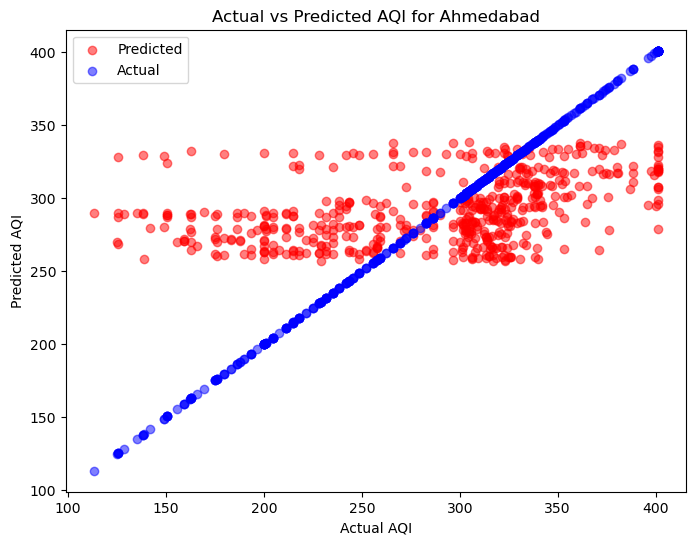

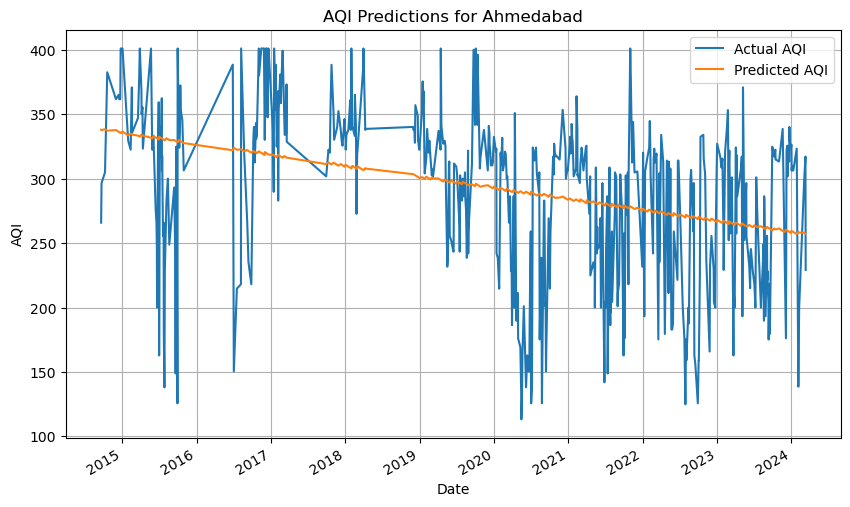

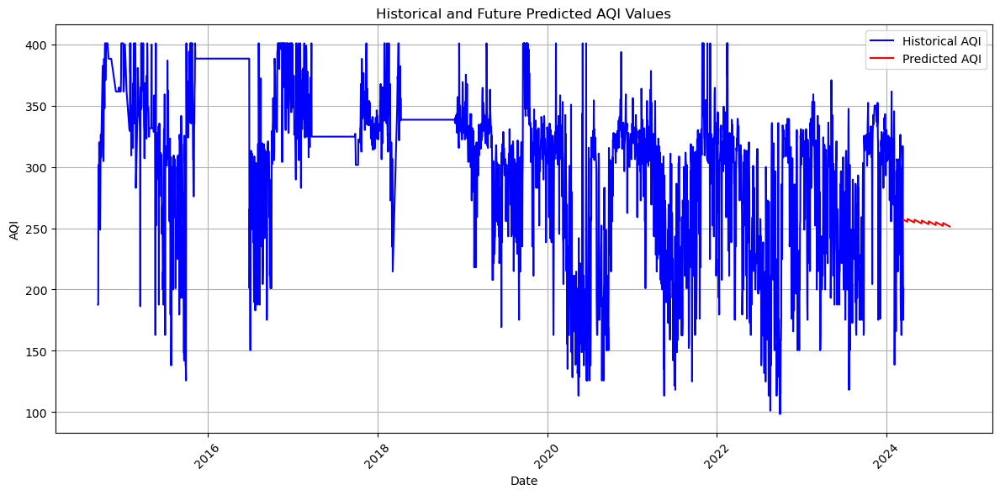

DataFrame for file aqi_Bangalore.csv:
(3437, 9)
PERFORMANCE
The mean squared error is: 4610.49256195622
The mean absolute error is: 58.67104706549244
The root mean squared error is: 67.90060796455522
R-squared (R²): 0.044321915865880745
Adjusted R-squared (adjusted R²): 0.043486776264248794
Mean Absolute Percentage Error (MAPE): 28.64048829444229


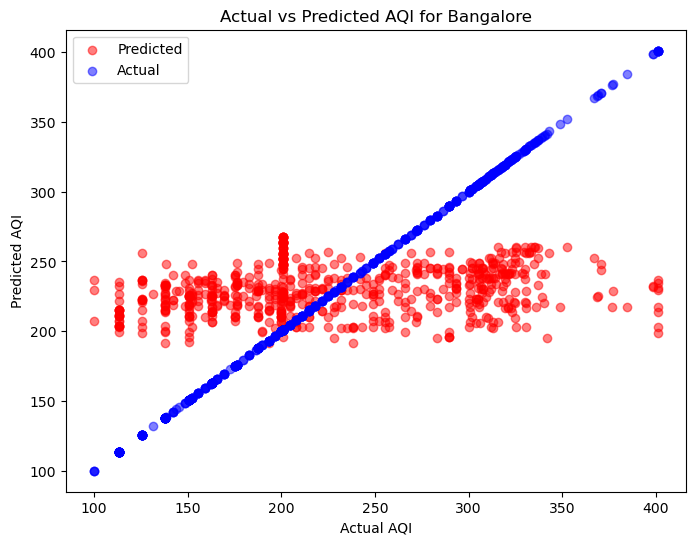

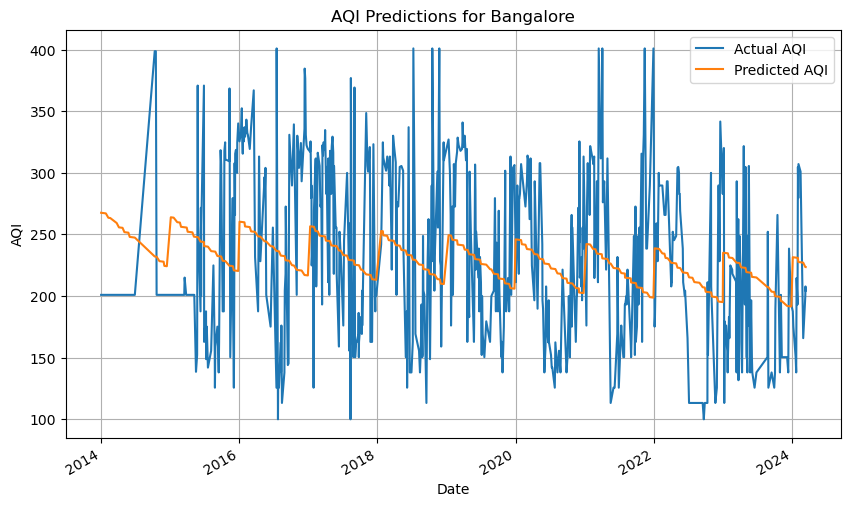

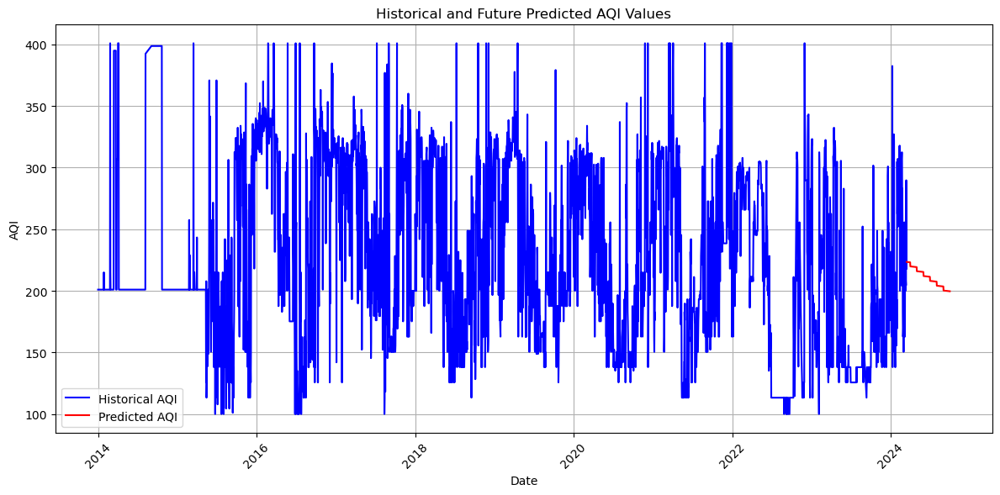

DataFrame for file aqi_Bhopal.csv:
(1496, 9)
PERFORMANCE
The mean squared error is: 6375.369433902096
The mean absolute error is: 72.51812256543865
The root mean squared error is: 79.84591056467511
R-squared (R²): 0.004461838931058337
Adjusted R-squared (adjusted R²): 0.0024600865964692353
Mean Absolute Percentage Error (MAPE): 37.77494393004869


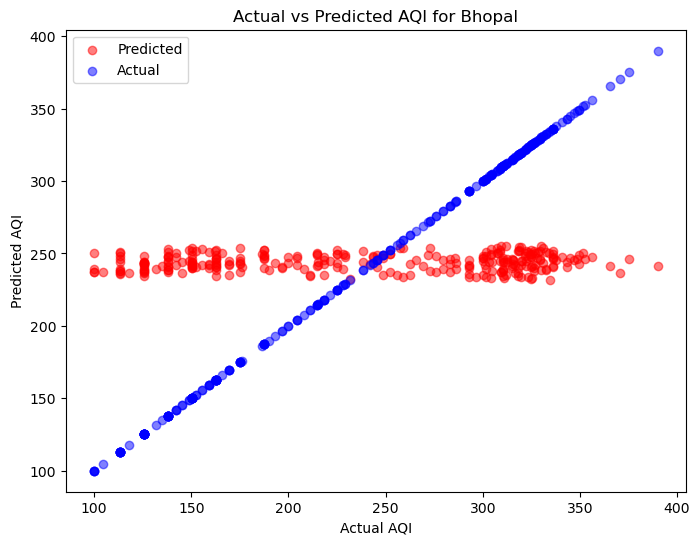

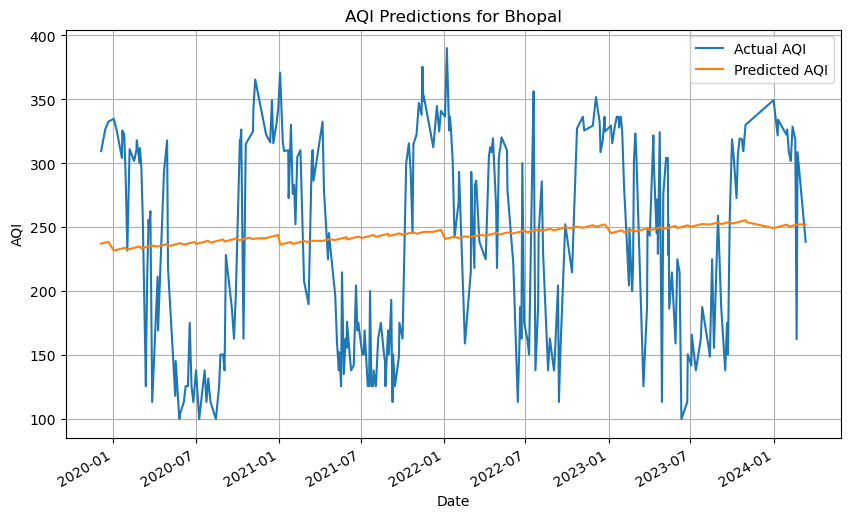

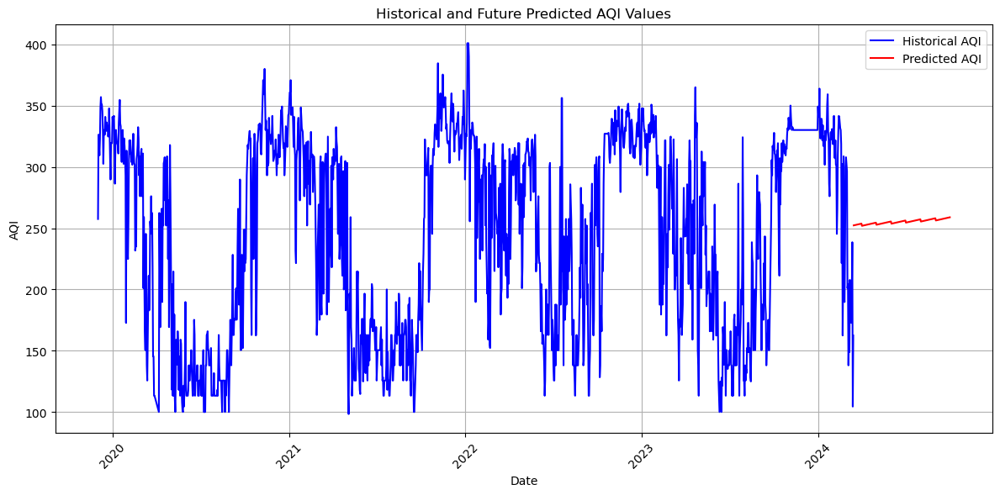

DataFrame for file aqi_Chennai.csv:
(2411, 9)
PERFORMANCE
The mean squared error is: 5429.702097564869
The mean absolute error is: 62.31032635993682
The root mean squared error is: 73.68651231782428
R-squared (R²): 0.038520107889919775
Adjusted R-squared (adjusted R²): 0.03732175322588571
Mean Absolute Percentage Error (MAPE): 29.237346666265452


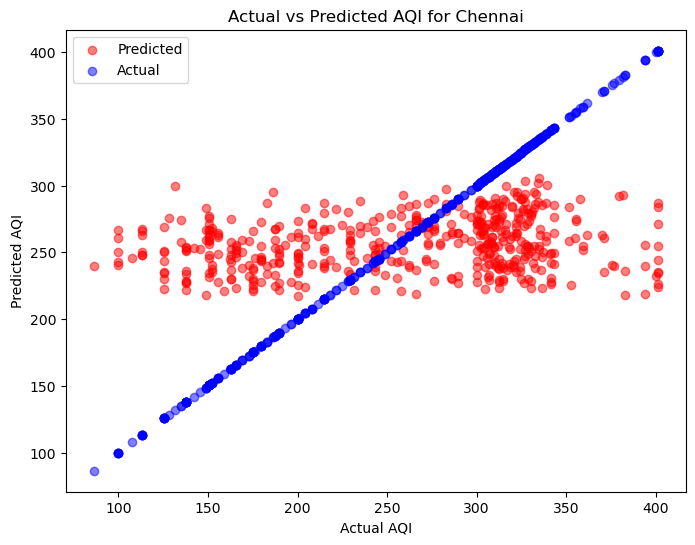

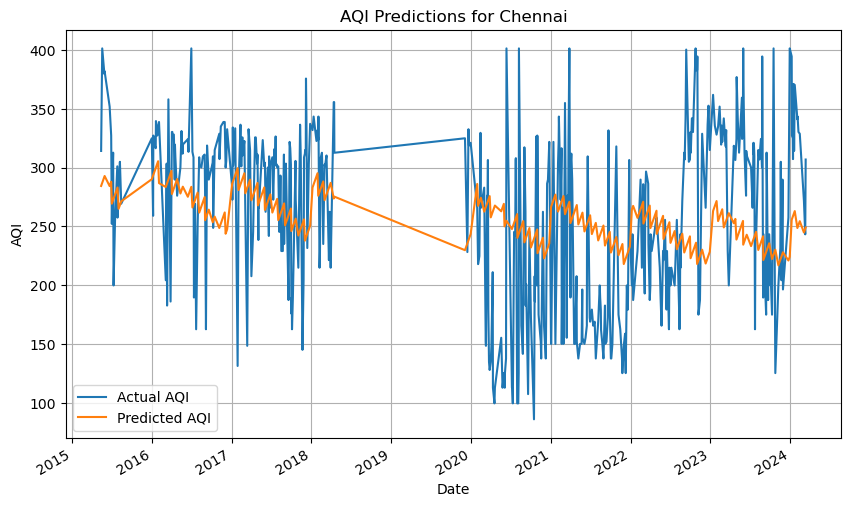

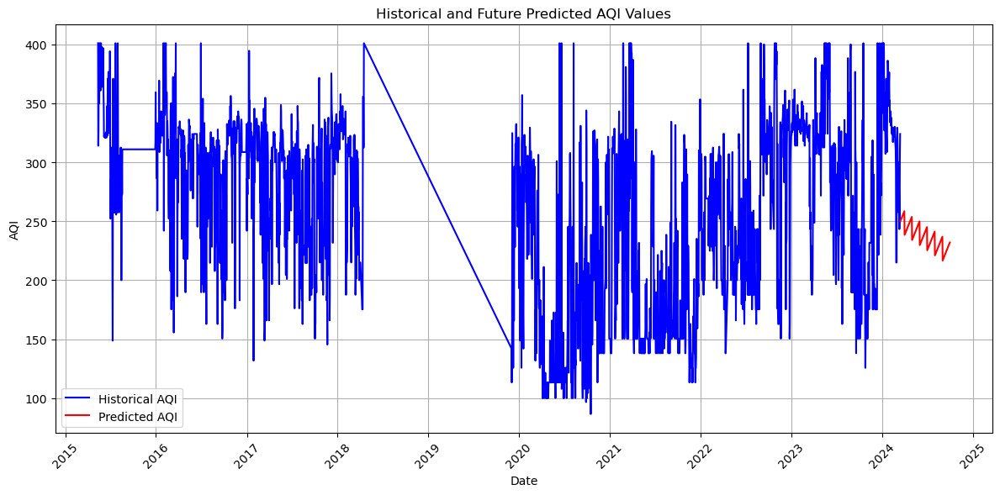

DataFrame for file aqi_Delhi.csv:
(1941, 9)
PERFORMANCE
The mean squared error is: 4832.662440059713
The mean absolute error is: 53.59836858121432
The root mean squared error is: 69.51735351737516
R-squared (R²): -0.00022379822694729157
Adjusted R-squared (adjusted R²): -0.0017729316263694894
Mean Absolute Percentage Error (MAPE): 20.50588290238323


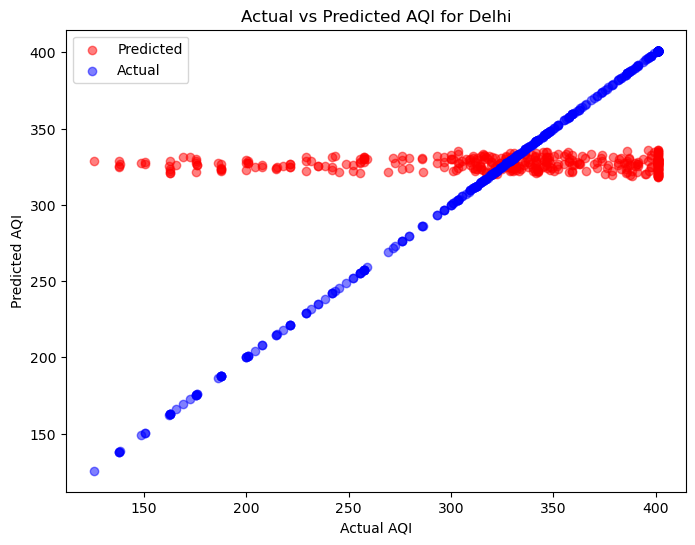

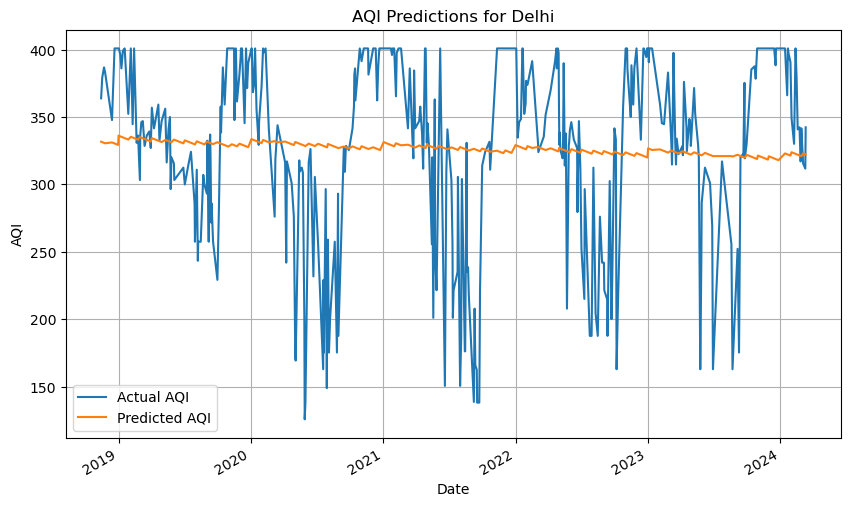

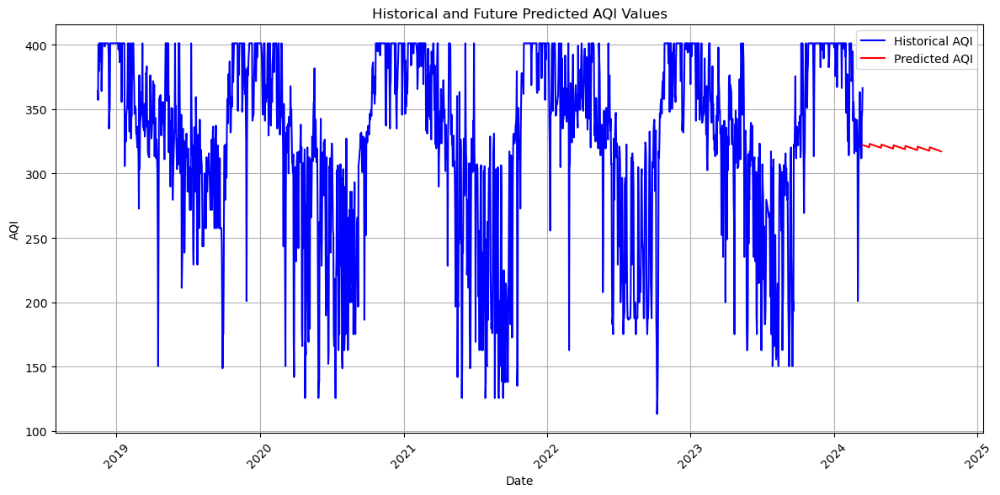

DataFrame for file aqi_Hyderabad.csv:
(2065, 9)
PERFORMANCE
The mean squared error is: 9070.17887419516
The mean absolute error is: 85.76286732310625
The root mean squared error is: 95.23748670662808
R-squared (R²): 0.041658737879526564
Adjusted R-squared (adjusted R²): 0.040263772432480804
Mean Absolute Percentage Error (MAPE): 61.05002393486847


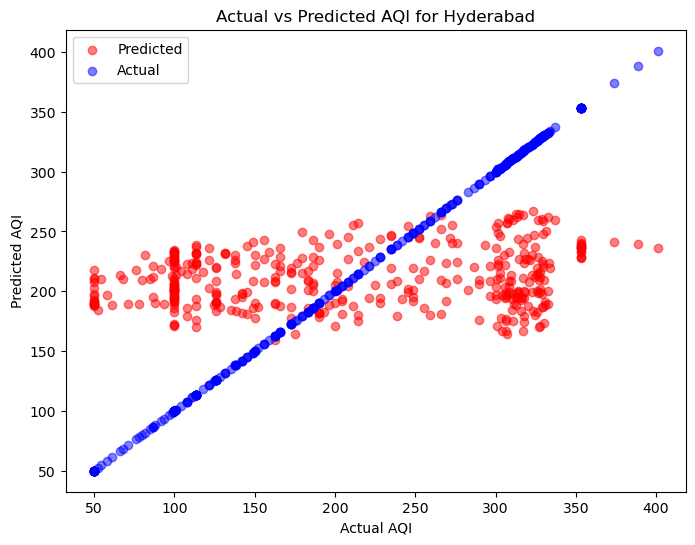

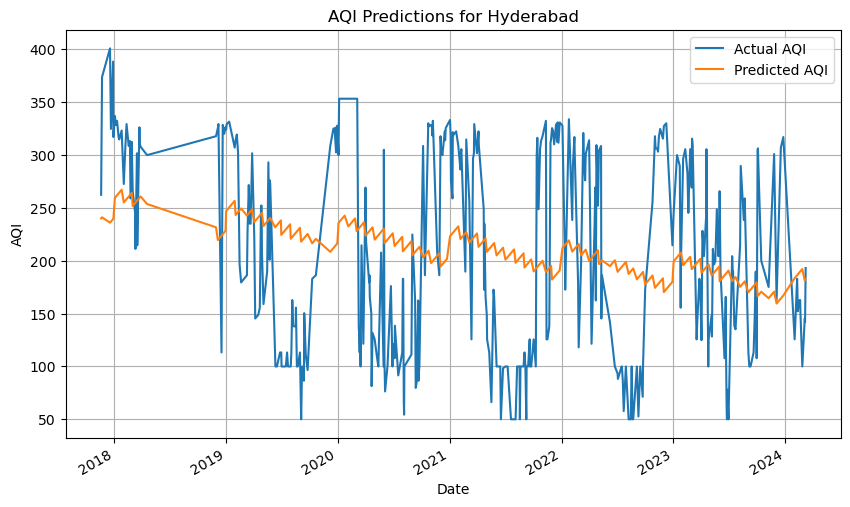

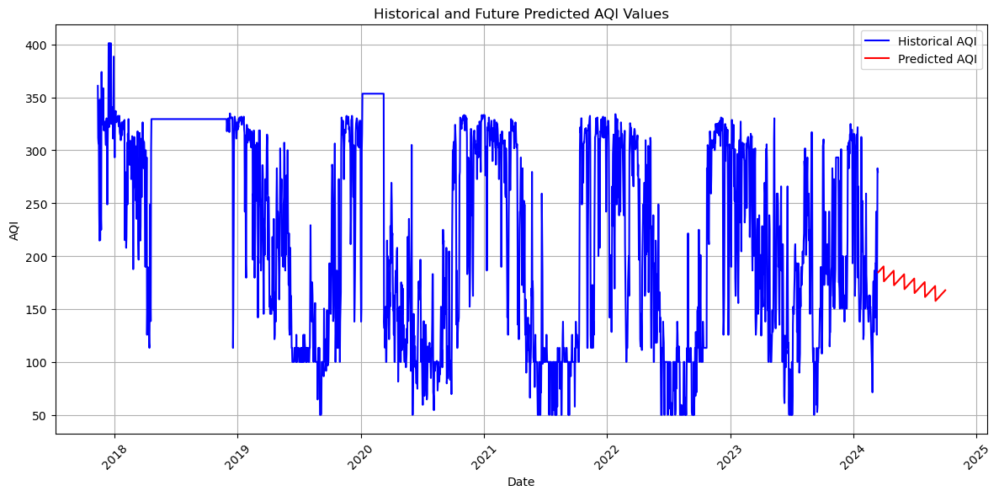

DataFrame for file aqi_Jaipur.csv:
(2715, 9)
PERFORMANCE
The mean squared error is: 4362.950267799121
The mean absolute error is: 55.389106871470304
The root mean squared error is: 66.0526325576742
R-squared (R²): 0.05091492212216897
Adjusted R-squared (adjusted R²): 0.04986466198434769
Mean Absolute Percentage Error (MAPE): 25.627918269645033


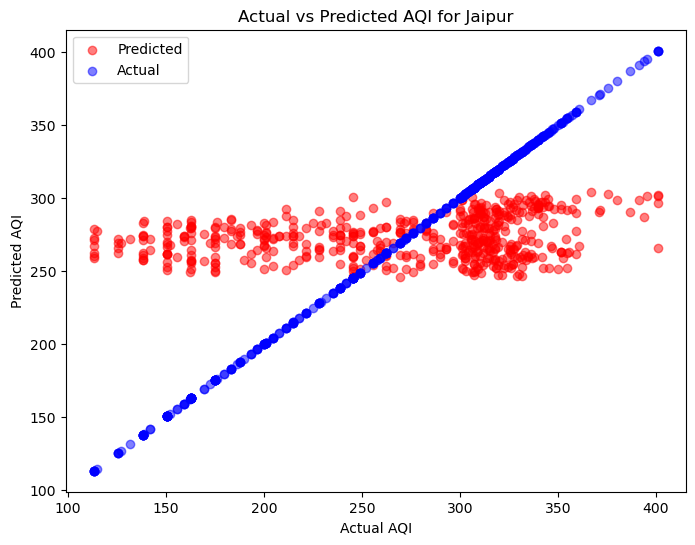

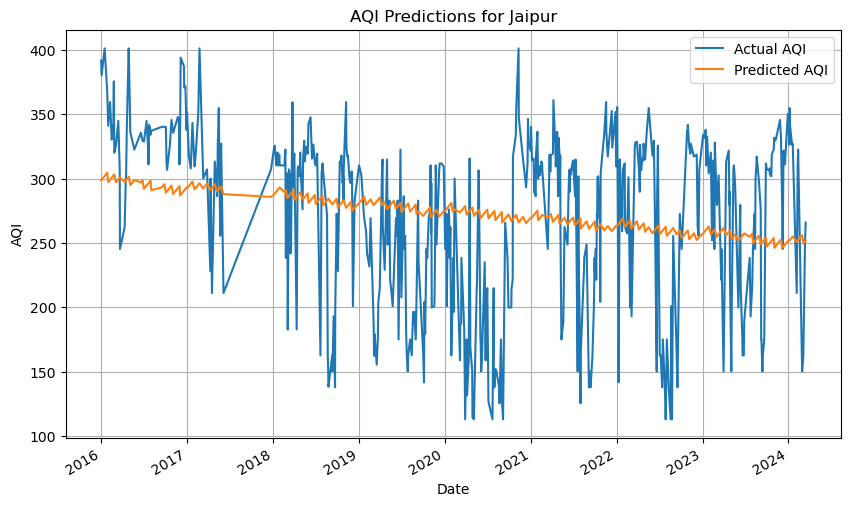

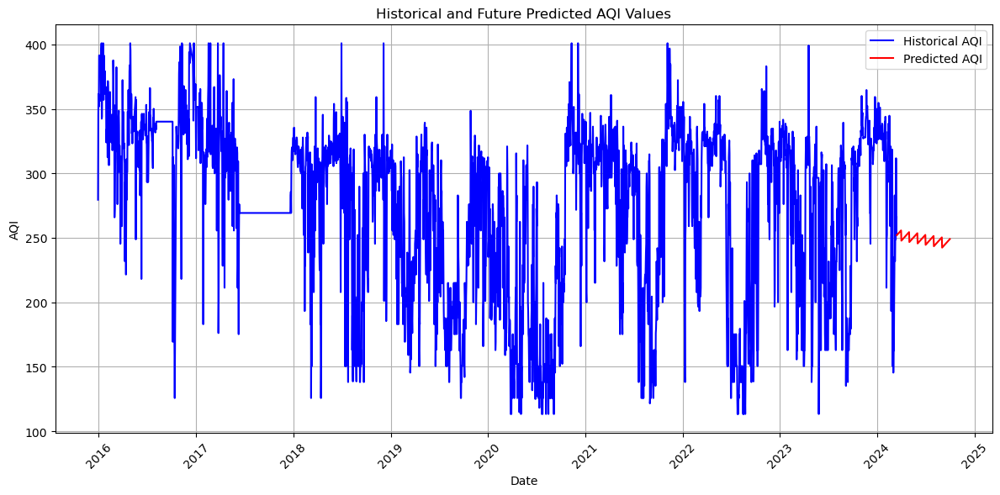

DataFrame for file aqi_Kanpur.csv:
(3230, 9)
PERFORMANCE
The mean squared error is: 4773.299101906761
The mean absolute error is: 56.02725659522979
The root mean squared error is: 69.08906644257658
R-squared (R²): 0.11626683882324829
Adjusted R-squared (adjusted R²): 0.11544501629270565
Mean Absolute Percentage Error (MAPE): 23.204603800322758


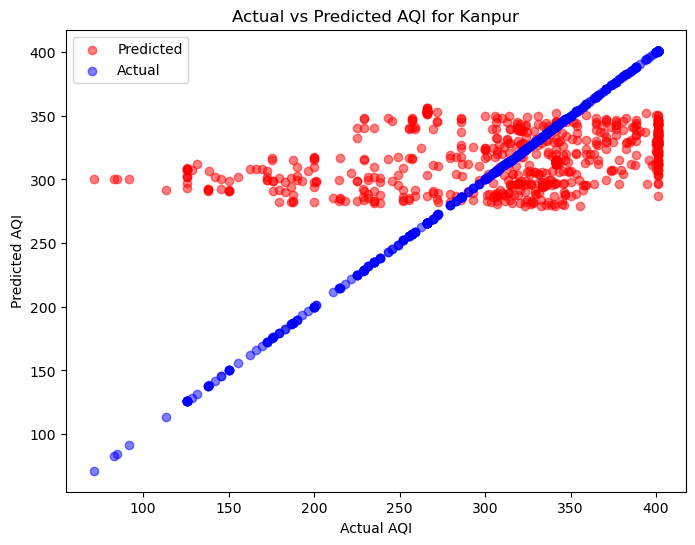

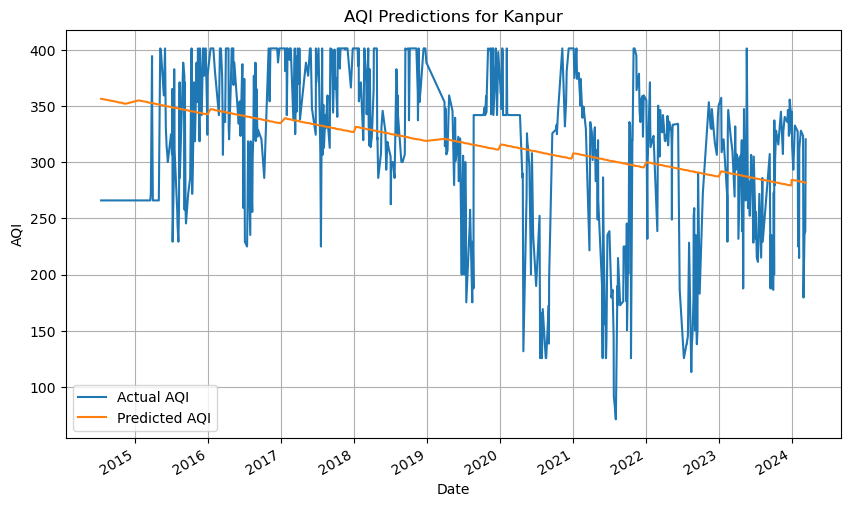

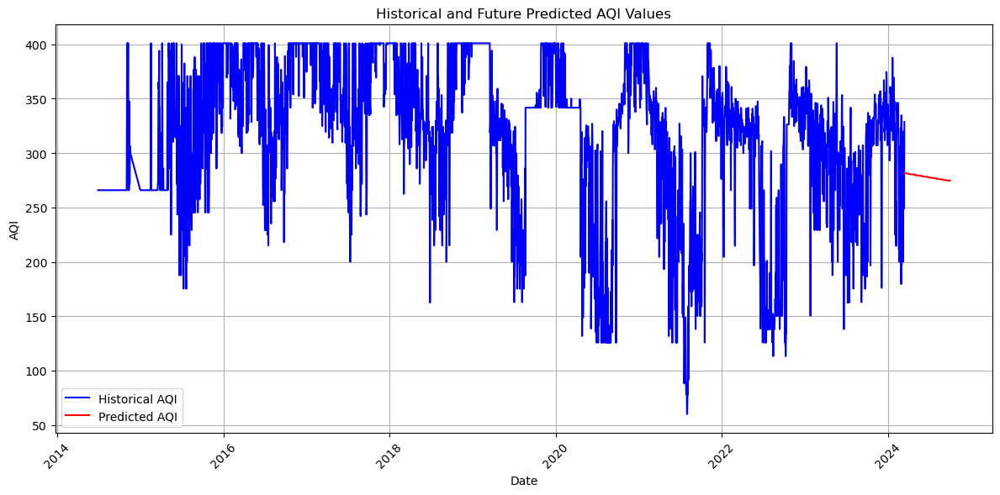

DataFrame for file aqi_Kolkata.csv:
(1549, 9)
PERFORMANCE
The mean squared error is: 10650.74662461123
The mean absolute error is: 96.99129363960061
The root mean squared error is: 103.20245454741486
R-squared (R²): 0.004569928390888323
Adjusted R-squared (adjusted R²): 0.002637054465433719
Mean Absolute Percentage Error (MAPE): 66.96981505076461


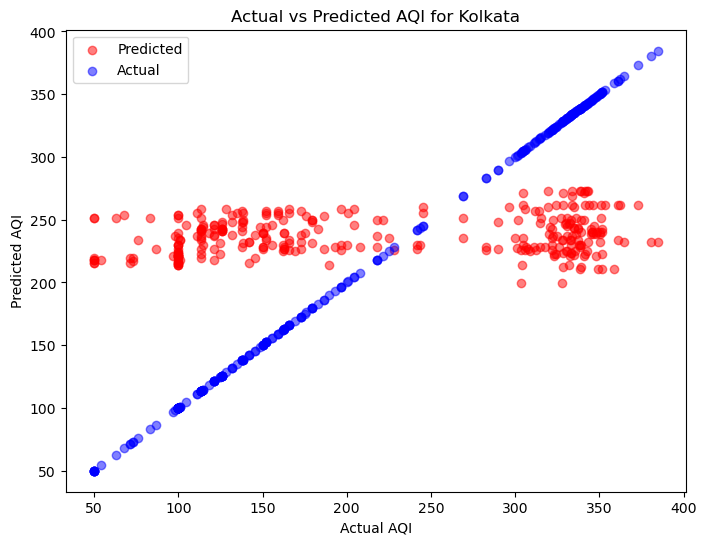

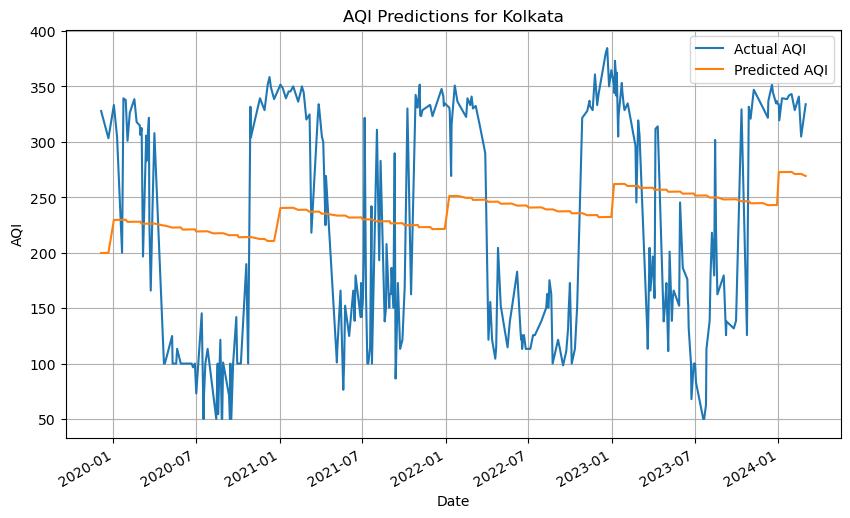

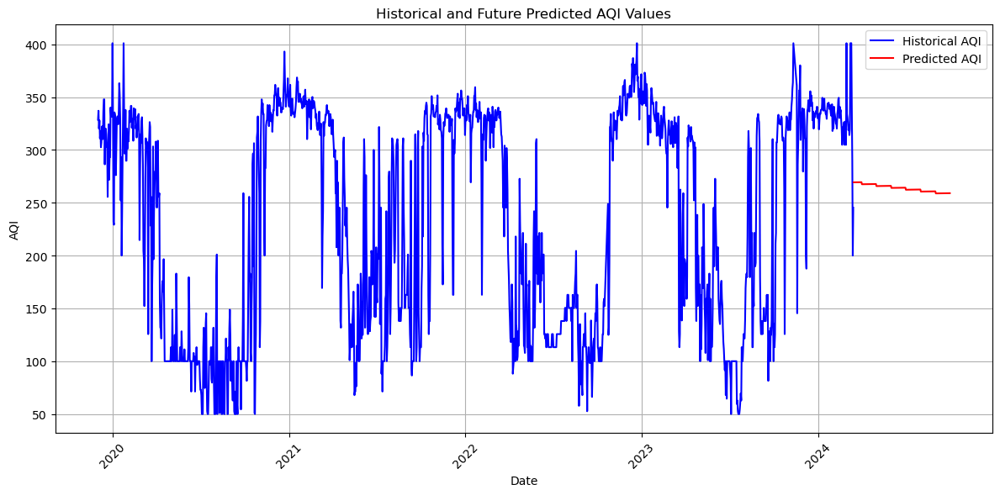

DataFrame for file aqi_Lucknow.csv:
(2923, 9)
PERFORMANCE
The mean squared error is: 7045.942777282842
The mean absolute error is: 57.2195303123677
The root mean squared error is: 83.94011423200973
R-squared (R²): 0.18253495560023902
Adjusted R-squared (adjusted R²): 0.18169480653096892
Mean Absolute Percentage Error (MAPE): 28.085087842847127


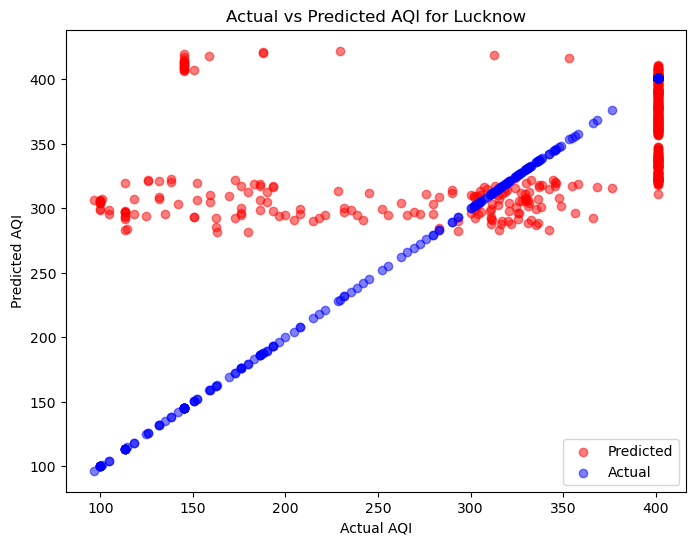

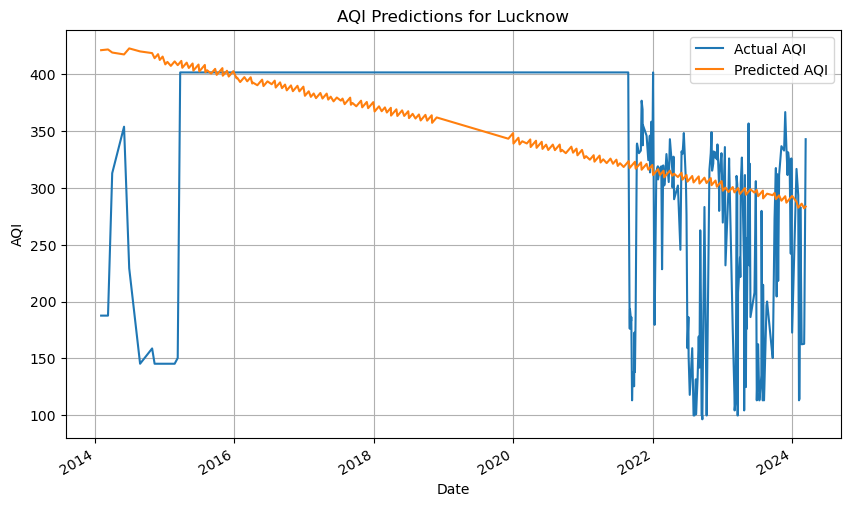

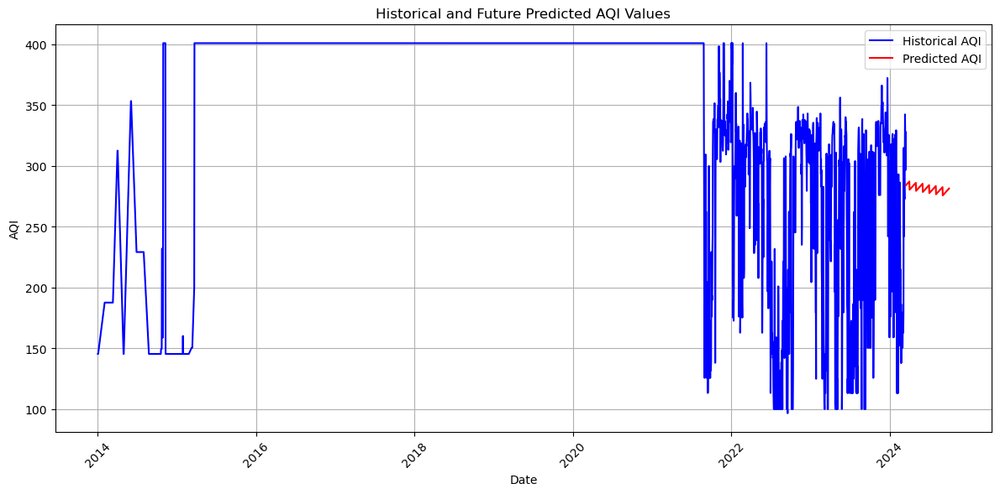

DataFrame for file aqi_Mumbai.csv:
(2529, 9)
PERFORMANCE
The mean squared error is: 5943.5720081453155
The mean absolute error is: 63.68815390527501
The root mean squared error is: 77.09456536063561
R-squared (R²): -0.006594734609632447
Adjusted R-squared (adjusted R²): -0.007790688749762742
Mean Absolute Percentage Error (MAPE): 34.86239285440708


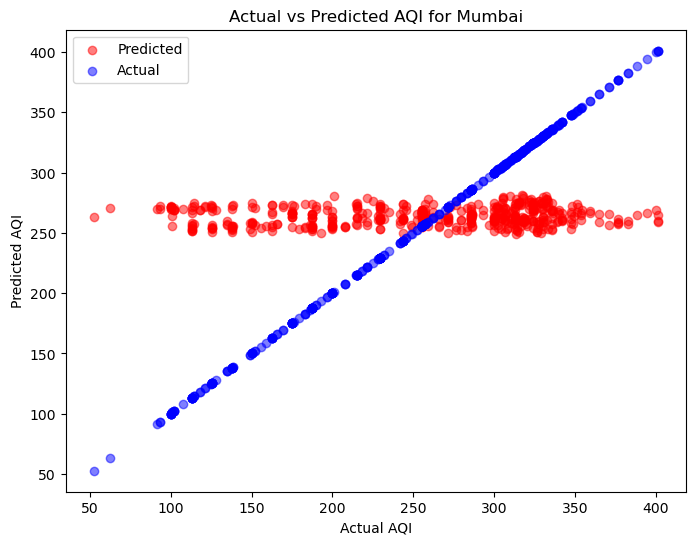

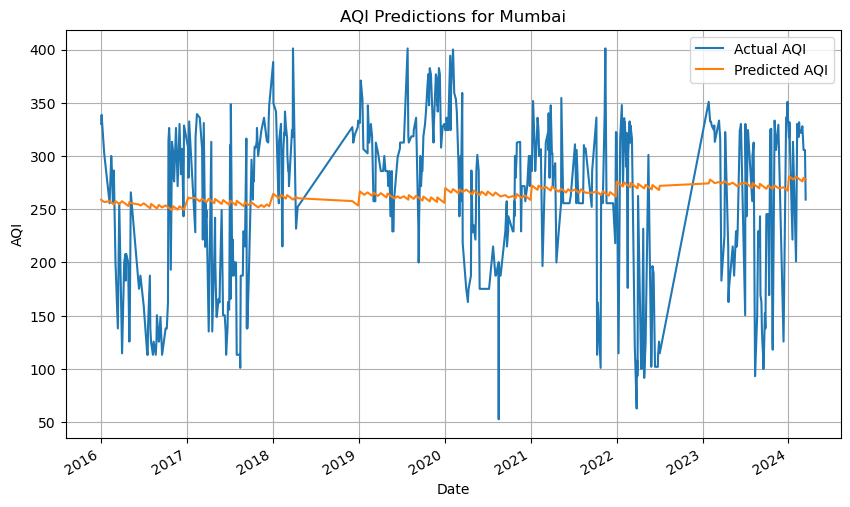

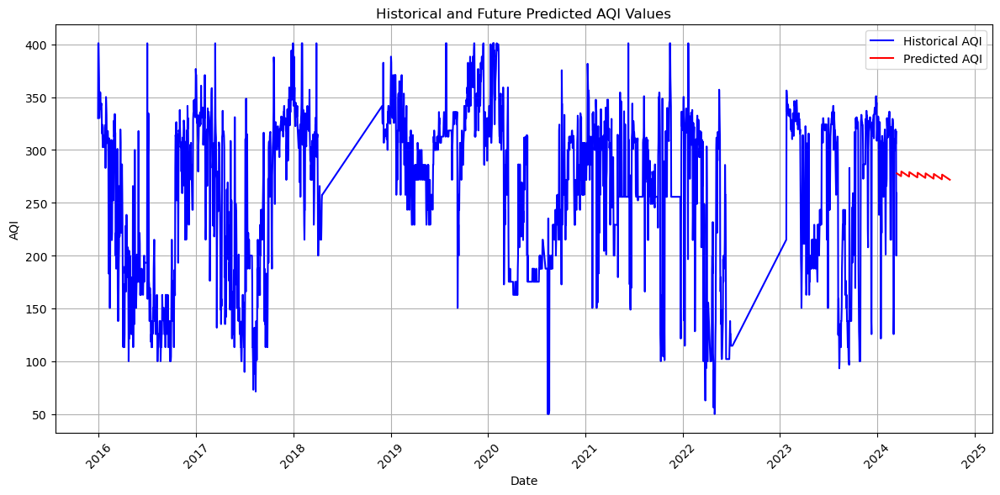

In [14]:
# Create an empty list to store city and RMSE values
data = []
datam = []
import matplotlib.pyplot as plt

for filename, df in dfs.items():
    print(f"DataFrame for file {filename}:")
    print(df.shape)
    if 'Location' in df.columns:  # Check if 'Location' column exists
        city = df['Location'].unique()
        rmse = computeLR(df)
        # Append city and RMSE values to the list
        data.append({'city': city[0], 'rmseRegression': rmse[0]})
        datam.append({'city': city[0], 'mapeRegression': rmse[1]})
    else:
        print("Skipping file as it doesn't have 'Location' column.")

# Create a DataFrame from the list
df_lr = pd.DataFrame(data)
df_ma = pd.DataFrame(datam)


In [15]:
df_lr

,city,rmseRegression
0,Ahmedabad,60.781965
1,Bangalore,67.900608
2,Bhopal,79.845911
3,Chennai,73.686512
4,Delhi,69.517354
5,Hyderabad,95.237487
6,Jaipur,66.052633
7,Kanpur,69.089066
8,Kolkata,103.202455
9,Lucknow,83.940114


In [16]:
df_ma

,city,mapeRegression
0,Ahmedabad,20.948198
1,Bangalore,28.640488
2,Bhopal,37.774944
3,Chennai,29.237347
4,Delhi,20.505883
5,Hyderabad,61.050024
6,Jaipur,25.627918
7,Kanpur,23.204604
8,Kolkata,66.969815
9,Lucknow,28.085088


In [17]:
df_rm['rmseRegression']=df_lr['rmseRegression']
df_m['mapeRegression']=df_ma['mapeRegression']

In [18]:
df_rm

,city,rmseSarima,rmseProphet,rmseLstm,rmseRegression
0,Ahmedabad,36.271477,29.473412,43.010711,60.781965
1,Bangalore,53.024737,49.999321,41.415312,67.900608
2,Bhopal,59.747452,11.002636,38.664183,79.845911
3,Chennai,81.706562,32.492609,42.943692,73.686512
4,Delhi,16.980743,20.173466,39.404833,69.517354
5,Hyderabad,50.074972,30.439338,47.292955,95.237487
6,Jaipur,30.859972,36.490868,37.864828,66.052633
7,Kanpur,39.183064,41.060383,42.572559,69.089066
8,Kolkata,42.312834,22.086145,41.881943,103.202455
9,Lucknow,62.882308,53.677165,56.287084,83.940114


In [19]:
df_m

,city,mapeSarima,mapeProphet,mapeLstm,mapeRegression
0,Ahmedabad,12.540213,9.783675,13.703734,20.948198
1,Bangalore,27.136686,20.511977,16.576269,28.640488
2,Bhopal,18.165154,3.852064,13.635481,37.774944
3,Chennai,21.658895,11.153860,11.948050,29.237347
4,Delhi,4.144283,5.387231,10.659843,20.505883
5,Hyderabad,21.988447,14.762300,22.013415,61.050024
6,Jaipur,8.908063,12.977305,11.383799,25.627918
7,Kanpur,12.340411,15.790815,13.747280,23.204604
8,Kolkata,21.410926,9.064622,15.365751,66.969815
9,Lucknow,25.871165,22.131251,22.035403,28.085088


In [20]:

# Directory to start the search from
start_dir = '/Users/'

# Dictionary to store unique DataFrames with filenames as keys
dfs = {}

for root, dirs, files in os.walk(start_dir):
    for file in files:
        if file.endswith('.csv') and 'aqi_' in file:
            file_path = os.path.join(root, file)
            if file not in dfs:  # Check if file name is not already in dictionary
                # Load CSV file into a DataFrame
                df = pd.read_csv(file_path)
                # Store DataFrame with filename as key
                dfs[file] = df
                print(f"Found file: {file}")


Found file: aqi_Ahmedabad.csv
Found file: aqi_Bangalore.csv
Found file: aqi_Bhopal.csv
Found file: aqi_Chennai.csv
Found file: aqi_Delhi.csv
Found file: aqi_Hyderabad.csv
Found file: aqi_Jaipur.csv
Found file: aqi_Kanpur.csv
Found file: aqi_Kolkata.csv
Found file: aqi_Lucknow.csv
Found file: aqi_Mumbai.csv


DataFrame for file aqi_Ahmedabad.csv:
(2672, 9)
PERFORMANCE
The mean squared error is: 2727.4896573381375
The mean absolute error is: 40.800646771331415
The root mean squared error is: 52.22537369266148
R-squared (R²): 0.3660824136232457
Adjusted R-squared (adjusted R²): 0.3612999346615199
Mean Absolute Percentage Error (MAPE): 17.28401249138236


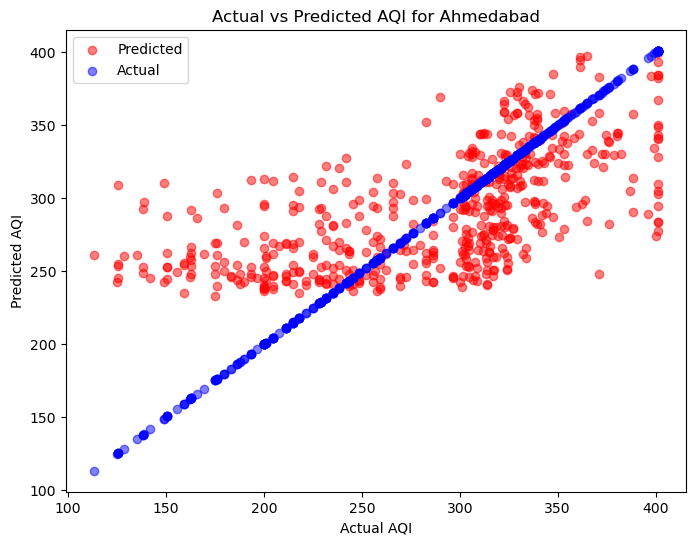

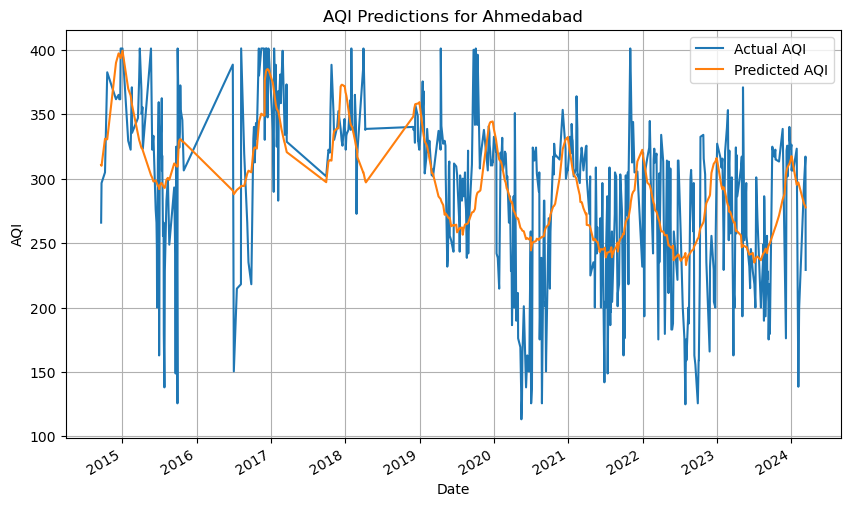

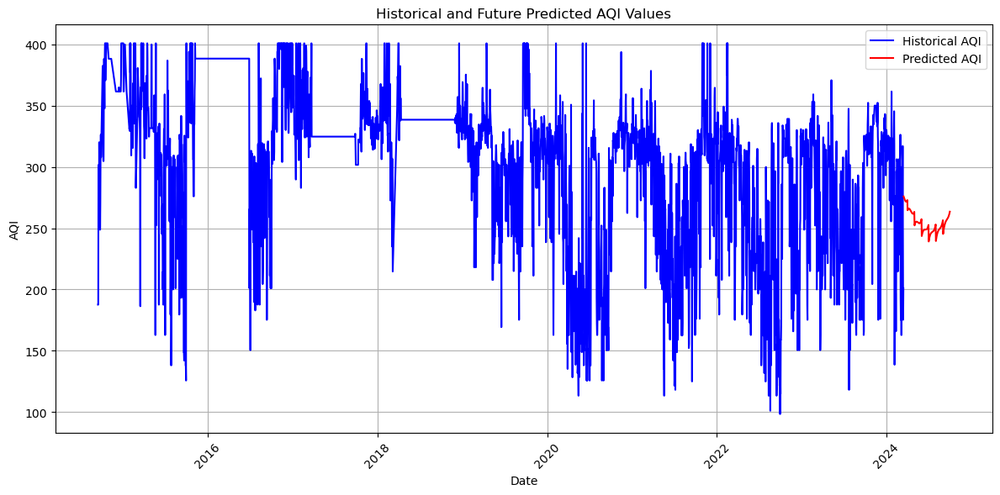

DataFrame for file aqi_Bangalore.csv:
(3437, 9)
PERFORMANCE
The mean squared error is: 3447.434968378909
The mean absolute error is: 47.361364845185115
The root mean squared error is: 58.714861563141824
R-squared (R²): 0.2854043247042095
Adjusted R-squared (adjusted R²): 0.28122050927507725
Mean Absolute Percentage Error (MAPE): 22.816939398807296


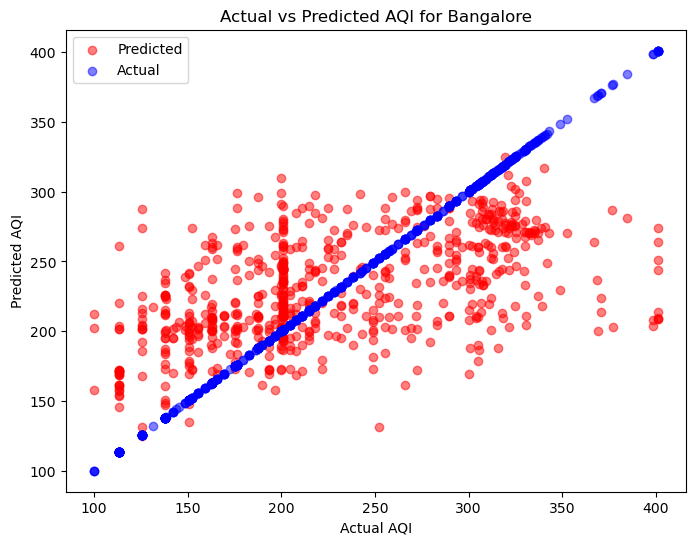

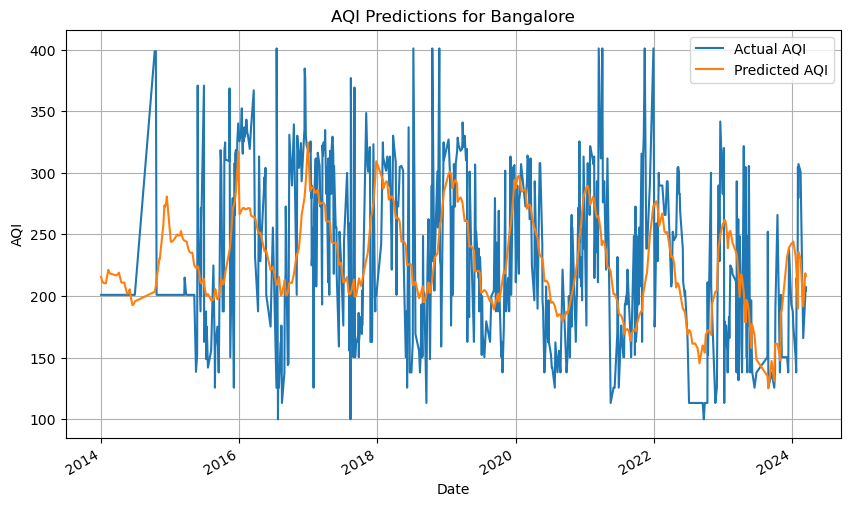

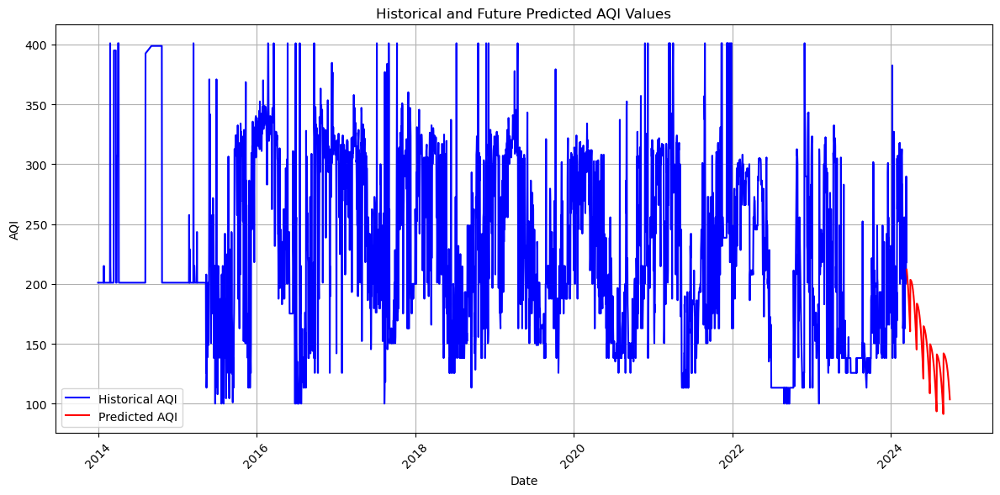

DataFrame for file aqi_Bhopal.csv:
(1496, 9)
PERFORMANCE
The mean squared error is: 2847.2241212929857
The mean absolute error is: 43.68906365367328
The root mean squared error is: 53.35938644037228
R-squared (R²): 0.5553951350975654
Adjusted R-squared (adjusted R²): 0.5493665945565154
Mean Absolute Percentage Error (MAPE): 21.301507264627475


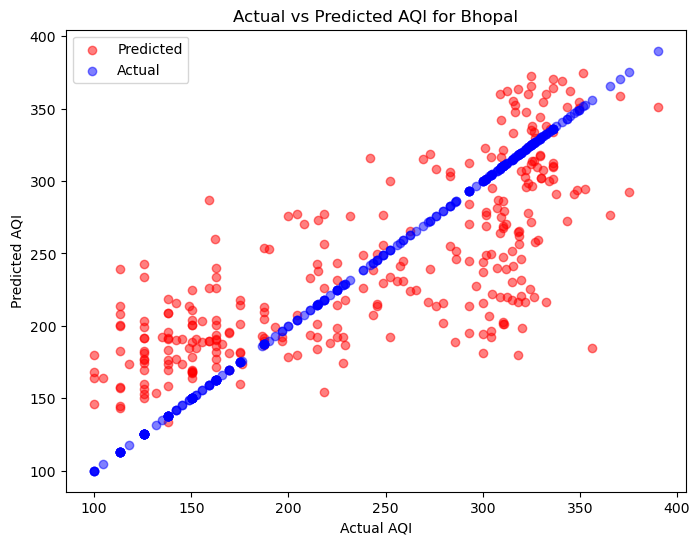

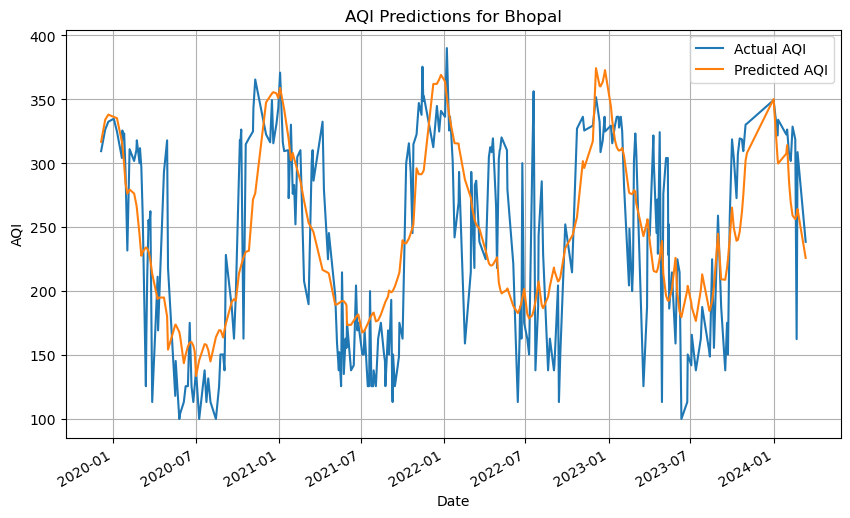

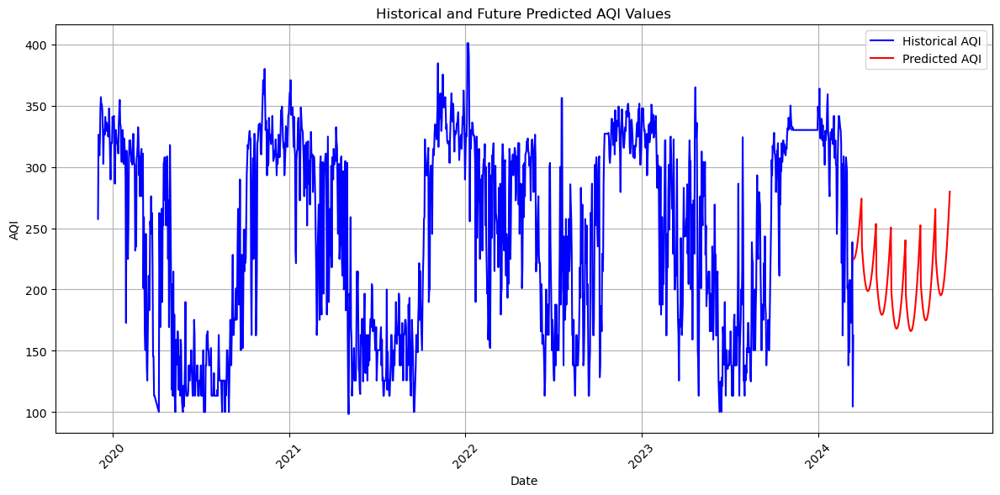

DataFrame for file aqi_Chennai.csv:
(2411, 9)
PERFORMANCE
The mean squared error is: 4246.321434310217
The mean absolute error is: 53.10291828430727
The root mean squared error is: 65.16380463347899
R-squared (R²): 0.2480705937151957
Adjusted R-squared (adjusted R²): 0.2417782974282935
Mean Absolute Percentage Error (MAPE): 23.24552505627309


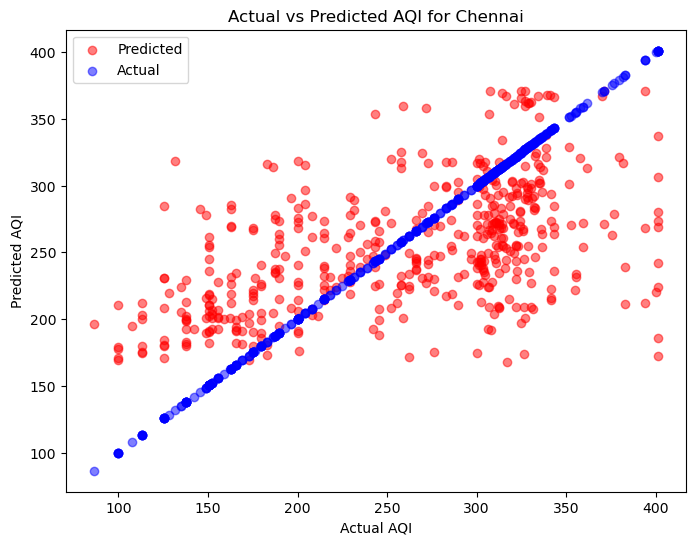

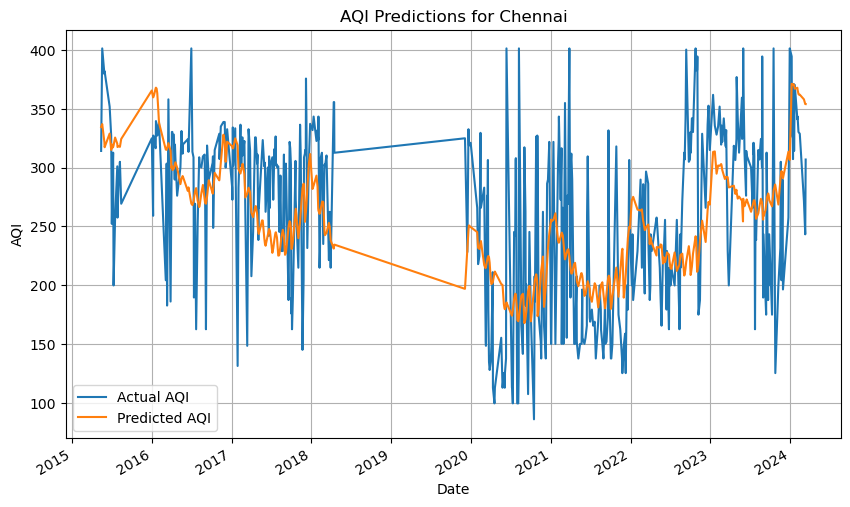

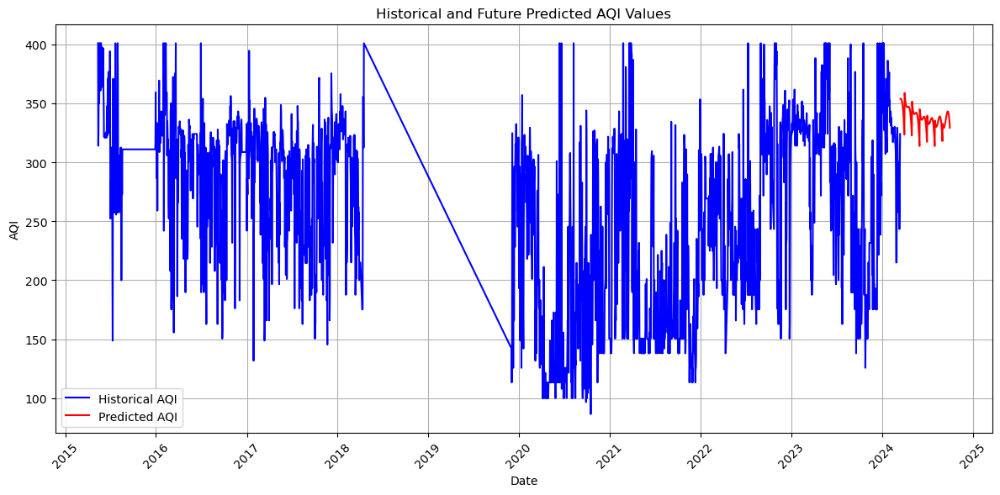

DataFrame for file aqi_Delhi.csv:
(1941, 9)
PERFORMANCE
The mean squared error is: 2558.3115346367863
The mean absolute error is: 39.57480997325049
The root mean squared error is: 50.57975419707757
R-squared (R²): 0.47050221033219963
Adjusted R-squared (adjusted R²): 0.4649866083564934
Mean Absolute Percentage Error (MAPE): 14.838589622425784


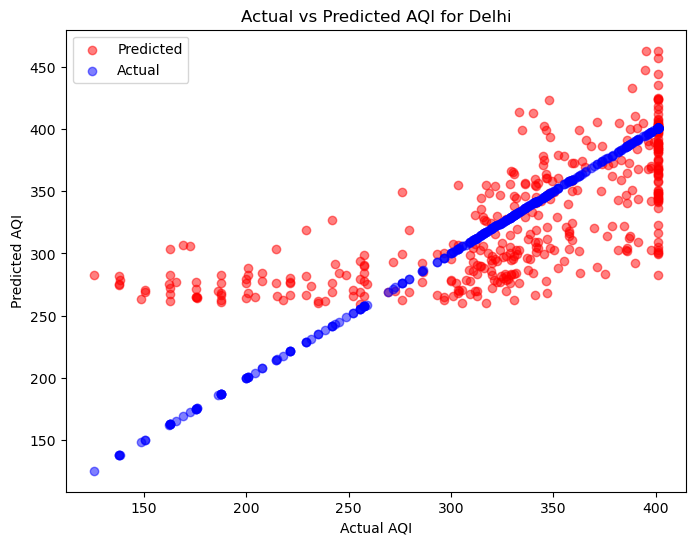

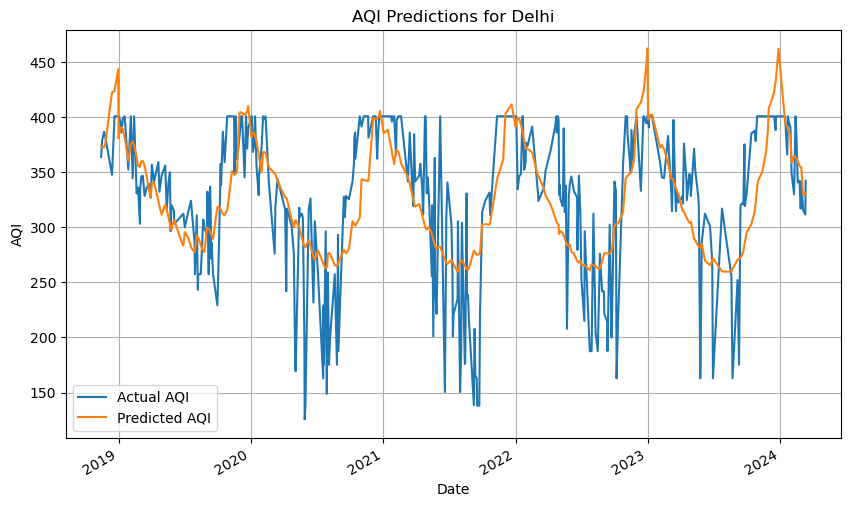

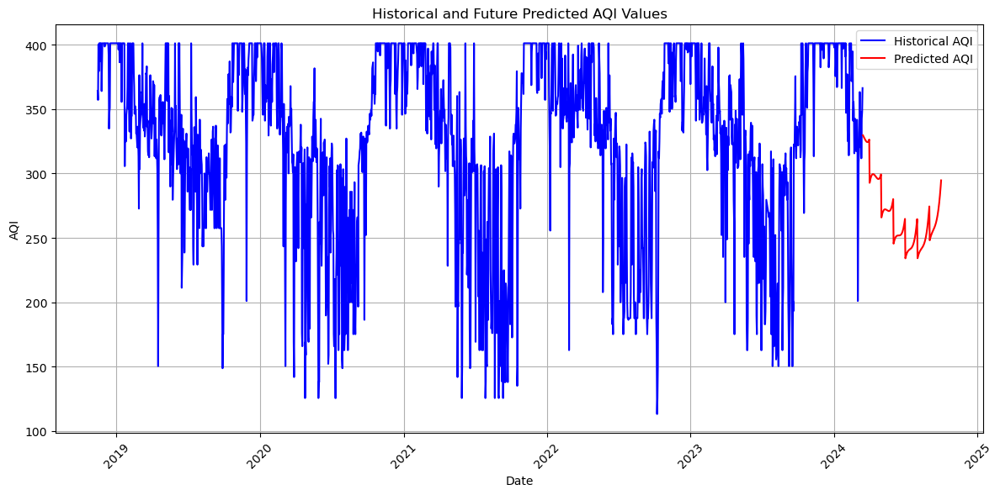

DataFrame for file aqi_Hyderabad.csv:
(2065, 9)
PERFORMANCE
The mean squared error is: 4143.303413306205
The mean absolute error is: 52.596431220425906
The root mean squared error is: 64.36849705644994
R-squared (R²): 0.5622248824934809
Adjusted R-squared (adjusted R²): 0.5579413686235541
Mean Absolute Percentage Error (MAPE): 34.7445583785212


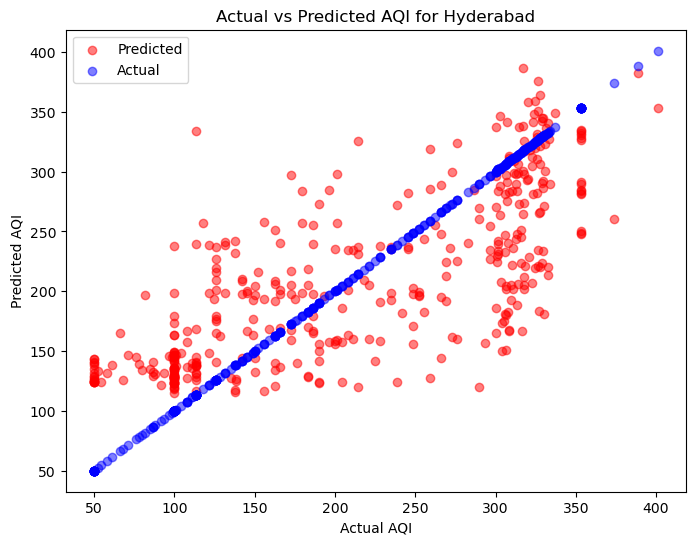

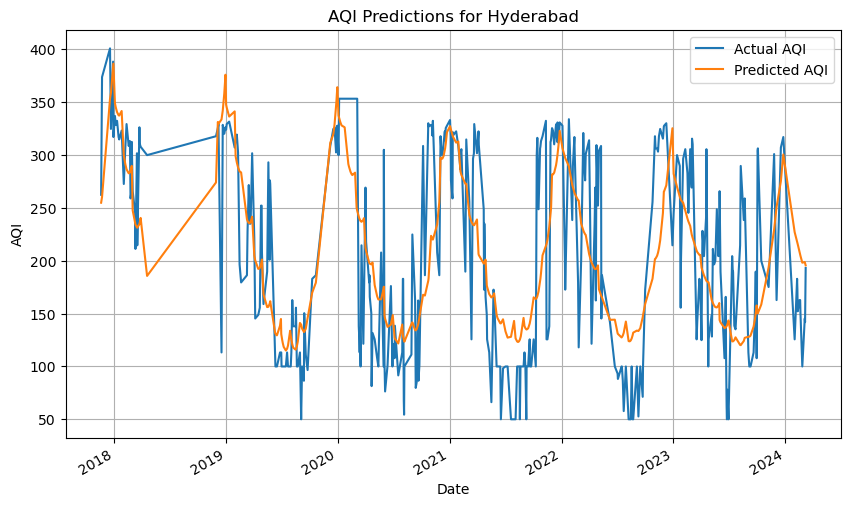

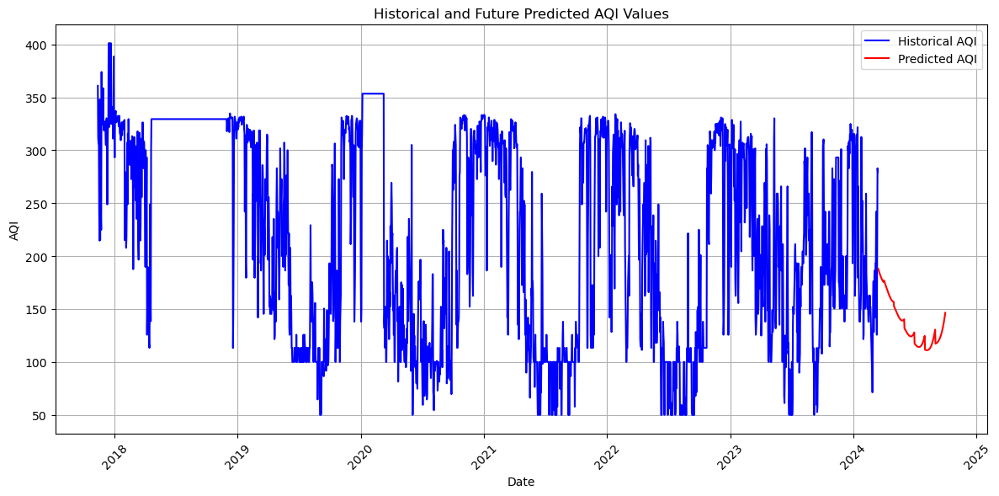

DataFrame for file aqi_Jaipur.csv:
(2715, 9)
PERFORMANCE
The mean squared error is: 3028.5077318936255
The mean absolute error is: 45.78517712498808
The root mean squared error is: 55.03187923280129
R-squared (R²): 0.3412000320535825
Adjusted R-squared (adjusted R²): 0.33630916369466335
Mean Absolute Percentage Error (MAPE): 20.603514173653334


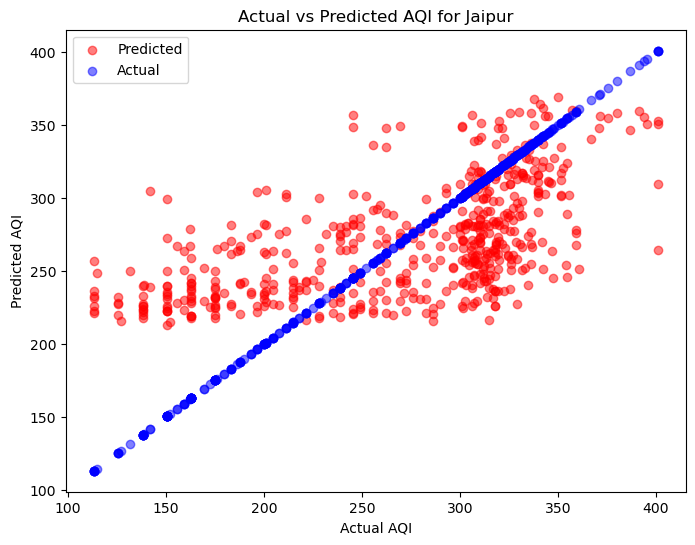

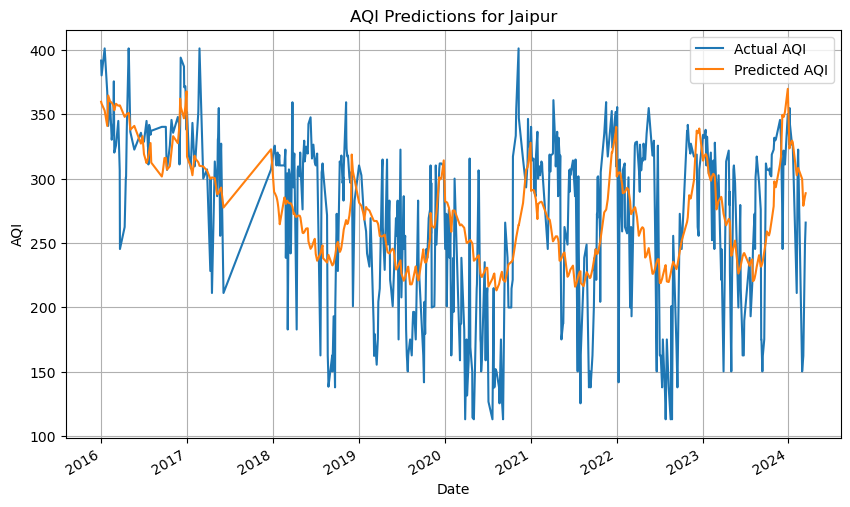

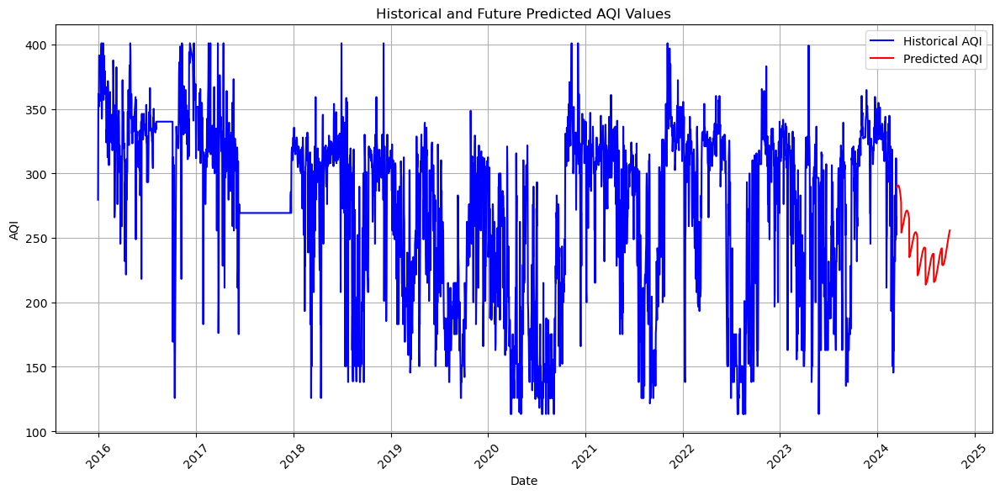

DataFrame for file aqi_Kanpur.csv:
(3230, 9)
PERFORMANCE
The mean squared error is: 2676.6183877501217
The mean absolute error is: 41.19966070888735
The root mean squared error is: 51.736045343165934
R-squared (R²): 0.5044483116246923
Adjusted R-squared (adjusted R²): 0.5013598000112593
Mean Absolute Percentage Error (MAPE): 16.570039164698137


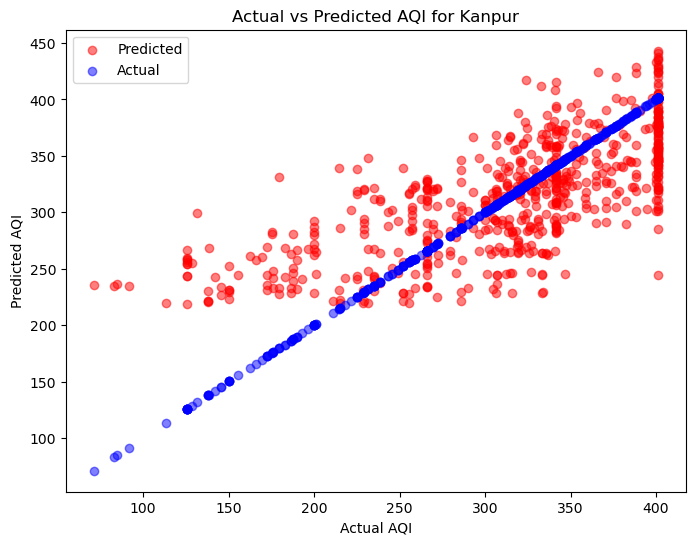

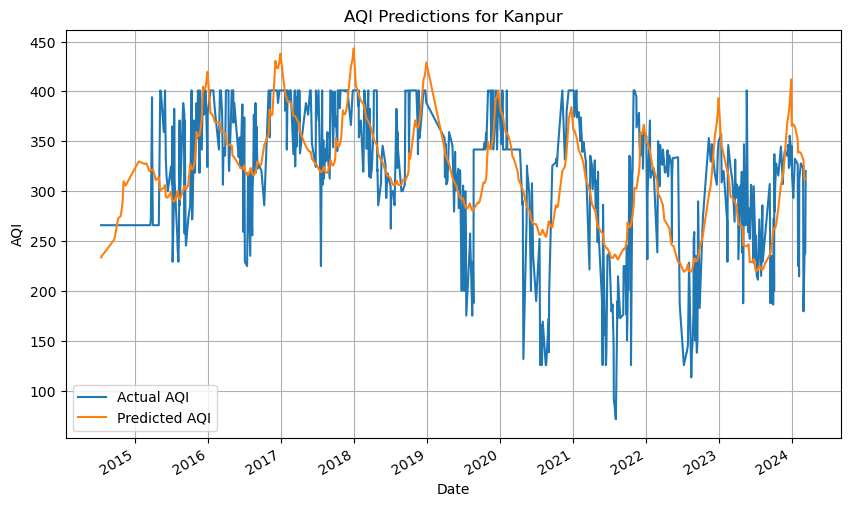

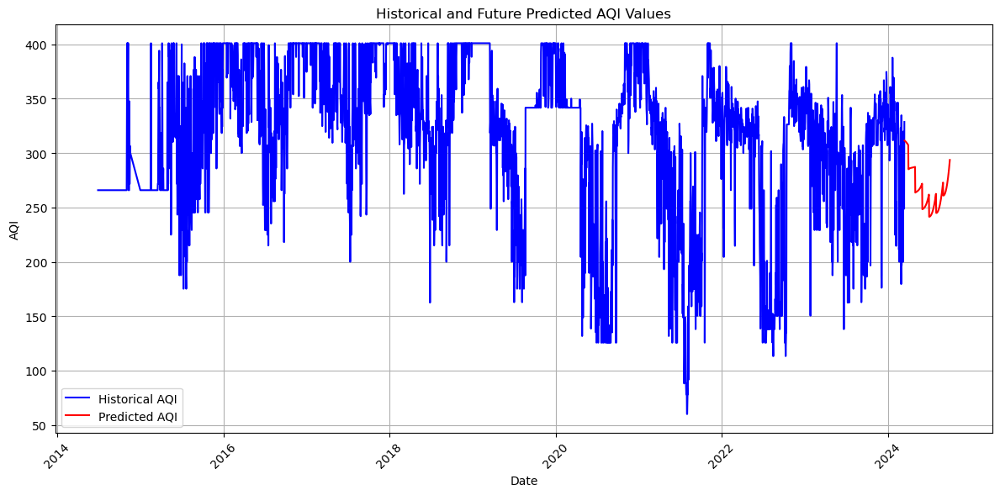

DataFrame for file aqi_Kolkata.csv:
(1549, 9)
PERFORMANCE
The mean squared error is: 3176.7834330234587
The mean absolute error is: 45.51915995588434
The root mean squared error is: 56.362961535244565
R-squared (R²): 0.7030944522786815
Adjusted R-squared (adjusted R²): 0.6992082540100779
Mean Absolute Percentage Error (MAPE): 29.2669963668381


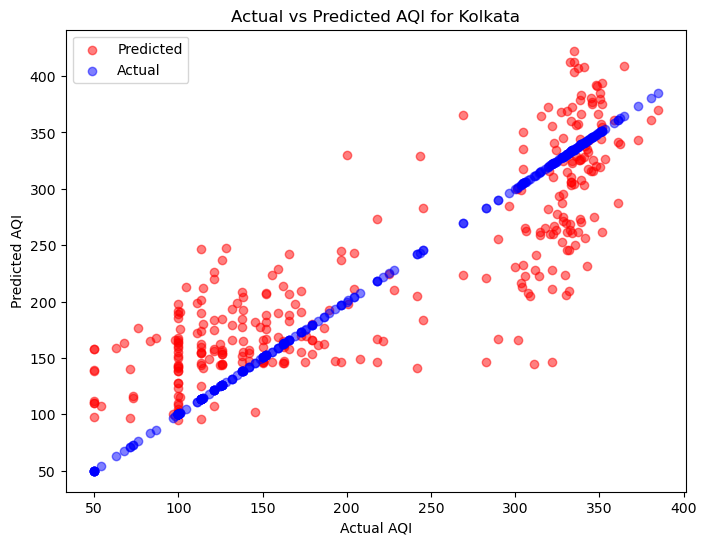

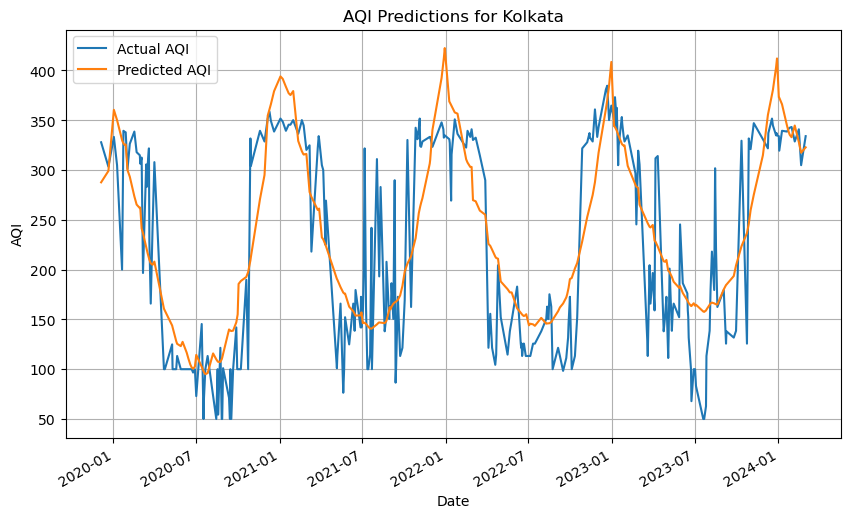

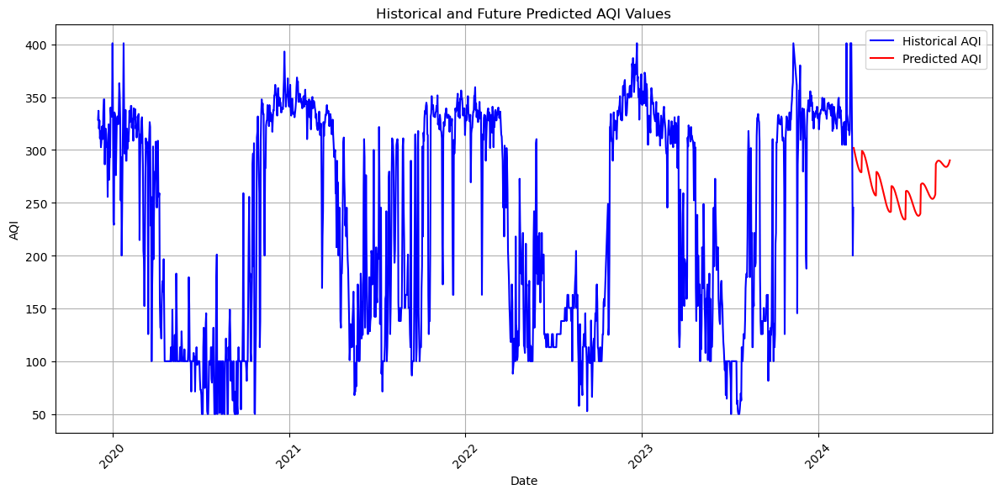

DataFrame for file aqi_Lucknow.csv:
(2923, 9)
PERFORMANCE
The mean squared error is: 3567.0522578595355
The mean absolute error is: 43.983116328135424
The root mean squared error is: 59.72480437690471
R-squared (R²): 0.5861532481148108
Adjusted R-squared (adjusted R²): 0.5833010995835552
Mean Absolute Percentage Error (MAPE): 19.947177694173085


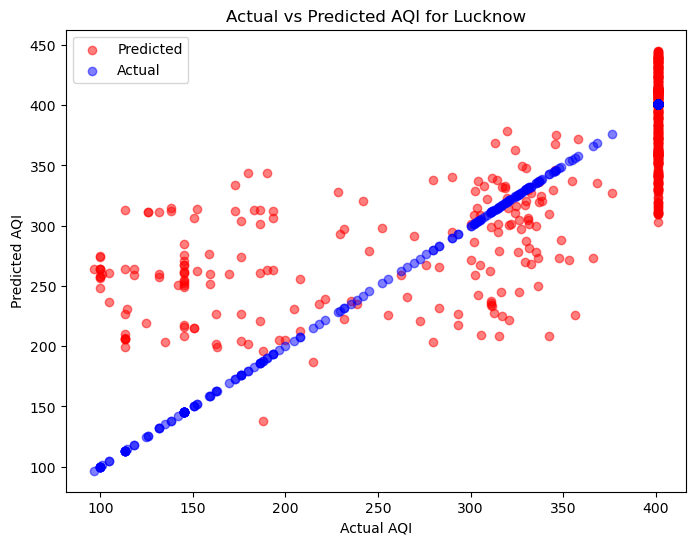

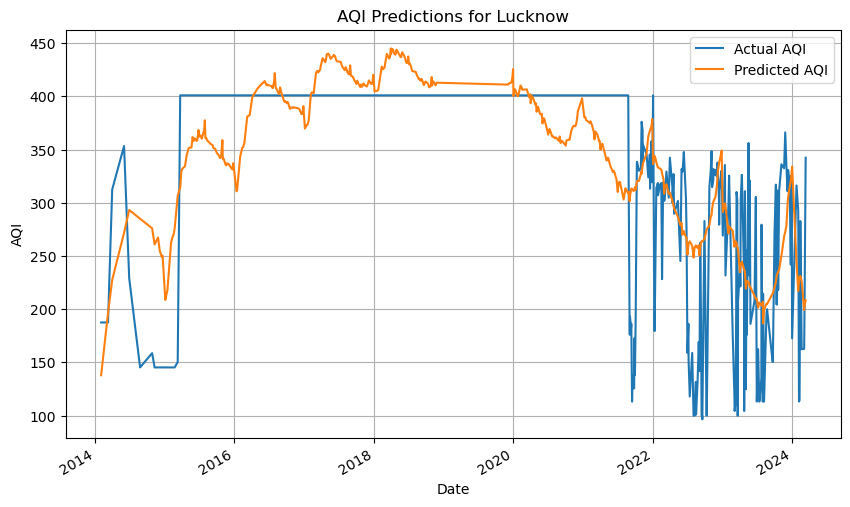

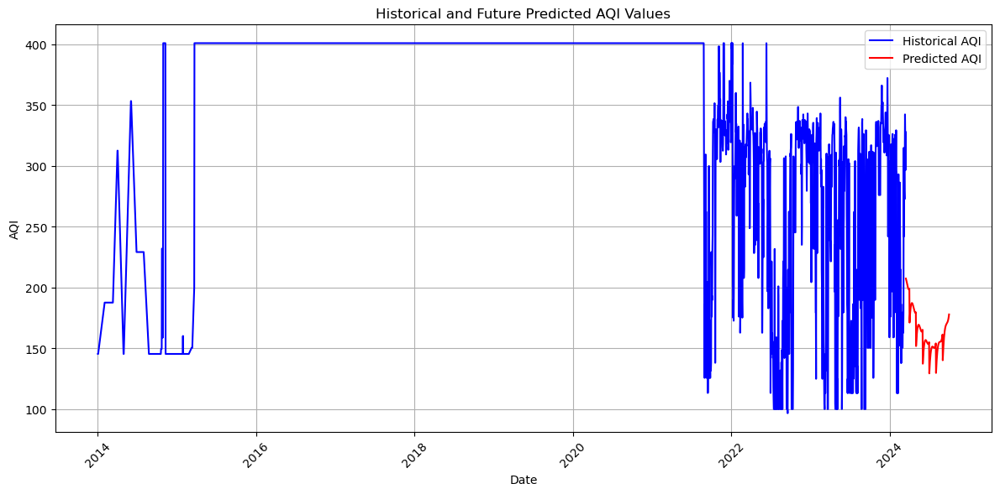

DataFrame for file aqi_Mumbai.csv:
(2529, 9)
PERFORMANCE
The mean squared error is: 3744.4447849690314
The mean absolute error is: 48.36428174816048
The root mean squared error is: 61.19186861805277
R-squared (R²): 0.36584626224416184
Adjusted R-squared (adjusted R²): 0.3607892148936368
Mean Absolute Percentage Error (MAPE): 26.058201889396237


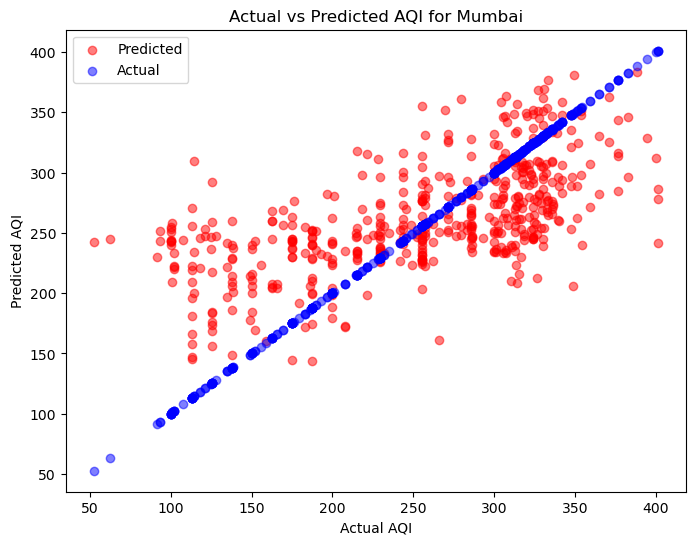

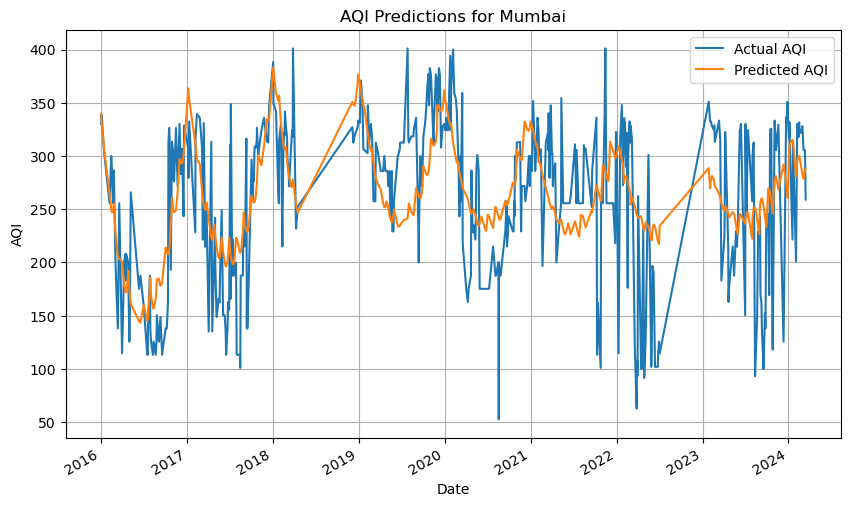

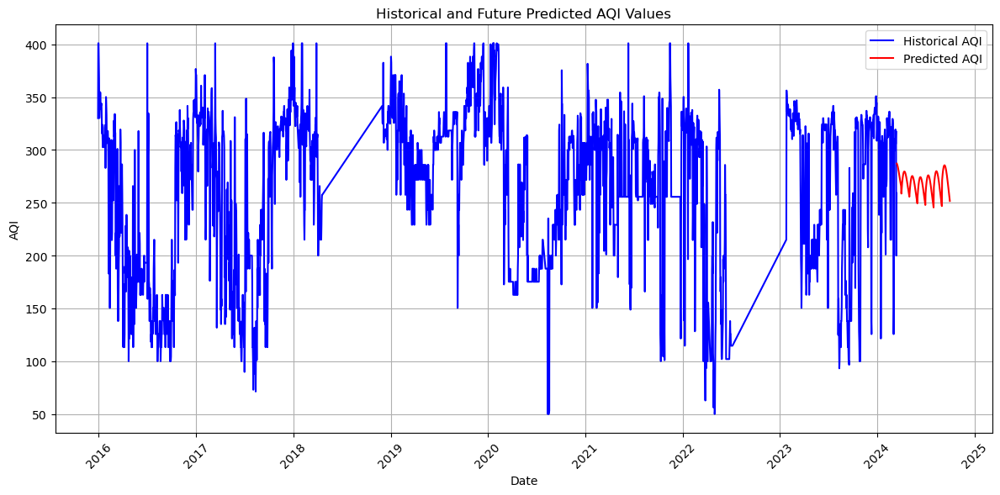

In [21]:

# Create an empty list to store city and RMSE values
data = []
datam=[]
for filename, df in dfs.items():
    print(f"DataFrame for file {filename}:")
    print(df.shape)
    if 'Location' in df.columns:  # Check if 'Location' column exists
        city = df['Location'].unique()
        rmse = computePR(df)
        
        # Append city and RMSE values to the list
        data.append({'city': city[0], 'rmseRegressionPoly': rmse[0]})
        datam.append({'city': city[0], 'mapeRegressionPoly': rmse[1]})
    else:
        print("Skipping file as it doesn't have 'Location' column.")

# Create a DataFrame from the list
df_r = pd.DataFrame(data)
dfm=pd.DataFrame(datam)

In [22]:
df_rm['rmseRegressionPoly']=df_r['rmseRegressionPoly']
df_m['mapeRegressionPoly']=dfm['mapeRegressionPoly']

In [23]:
df_rm

,city,rmseSarima,rmseProphet,rmseLstm,rmseRegression,rmseRegressionPoly
0,Ahmedabad,36.271477,29.473412,43.010711,60.781965,52.225374
1,Bangalore,53.024737,49.999321,41.415312,67.900608,58.714862
2,Bhopal,59.747452,11.002636,38.664183,79.845911,53.359386
3,Chennai,81.706562,32.492609,42.943692,73.686512,65.163805
4,Delhi,16.980743,20.173466,39.404833,69.517354,50.579754
5,Hyderabad,50.074972,30.439338,47.292955,95.237487,64.368497
6,Jaipur,30.859972,36.490868,37.864828,66.052633,55.031879
7,Kanpur,39.183064,41.060383,42.572559,69.089066,51.736045
8,Kolkata,42.312834,22.086145,41.881943,103.202455,56.362962
9,Lucknow,62.882308,53.677165,56.287084,83.940114,59.724804


In [24]:
df_m

,city,mapeSarima,mapeProphet,mapeLstm,mapeRegression,mapeRegressionPoly
0,Ahmedabad,12.540213,9.783675,13.703734,20.948198,17.284012
1,Bangalore,27.136686,20.511977,16.576269,28.640488,22.816939
2,Bhopal,18.165154,3.852064,13.635481,37.774944,21.301507
3,Chennai,21.658895,11.153860,11.948050,29.237347,23.245525
4,Delhi,4.144283,5.387231,10.659843,20.505883,14.838590
5,Hyderabad,21.988447,14.762300,22.013415,61.050024,34.744558
6,Jaipur,8.908063,12.977305,11.383799,25.627918,20.603514
7,Kanpur,12.340411,15.790815,13.747280,23.204604,16.570039
8,Kolkata,21.410926,9.064622,15.365751,66.969815,29.266996
9,Lucknow,25.871165,22.131251,22.035403,28.085088,19.947178


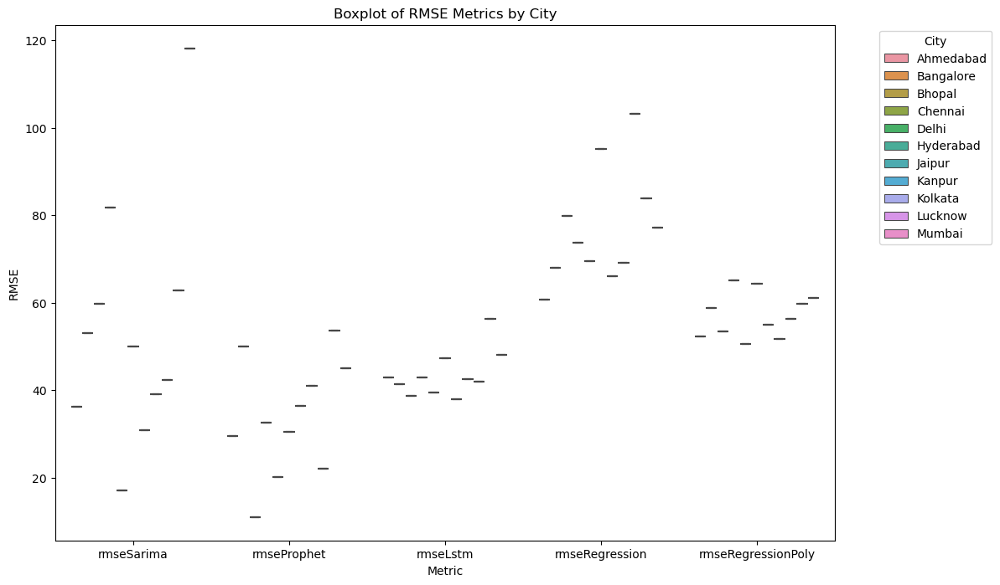

In [25]:
# Melt the DataFrame to long format for seaborn boxplot
df_melted = df_rm.melt(id_vars='city', var_name='Metric', value_name='RMSE')

# Create the boxplot
plt.figure(figsize=(12, 8))
sns.boxplot(x='Metric', y='RMSE', hue='city', data=df_melted)
plt.title('Boxplot of RMSE Metrics by City')
plt.xlabel('Metric')
plt.ylabel('RMSE')
plt.legend(title='City', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

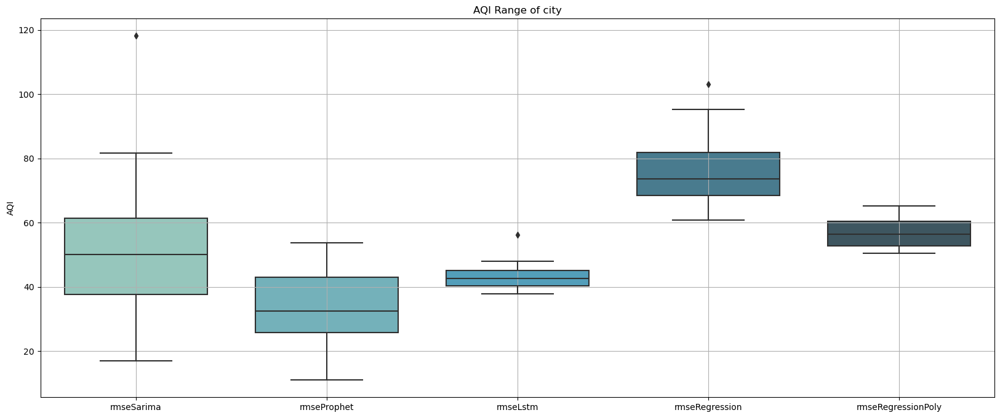

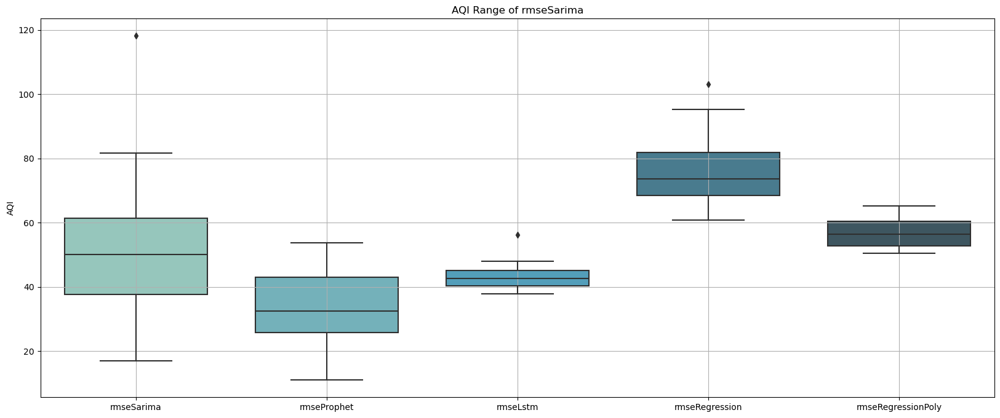

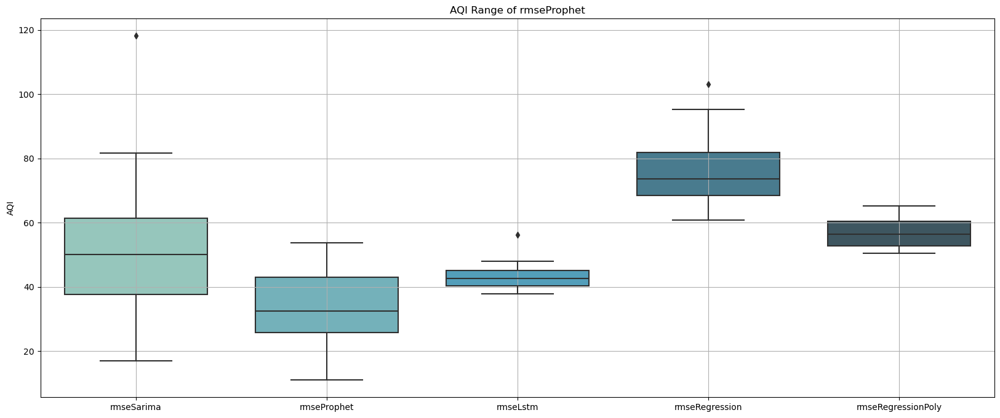

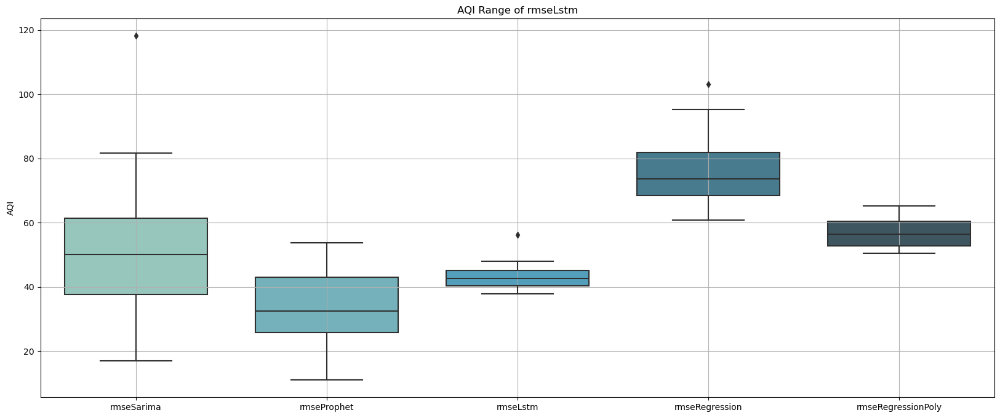

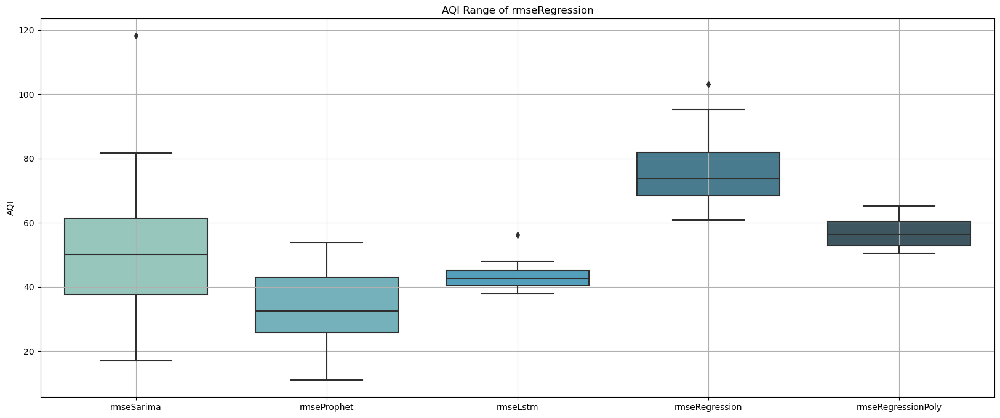

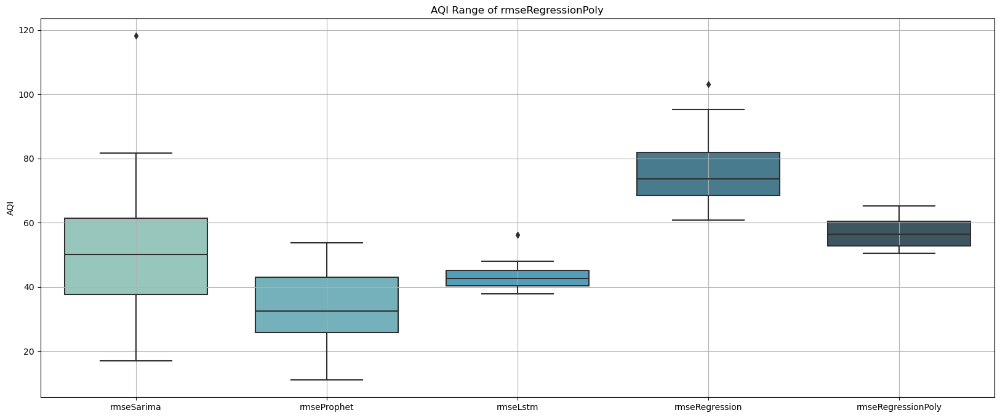

In [26]:
city=df_rm['city'].unique
for cit in df_rm:
    # Plot the AQI range using a boxplot
    plt.figure(figsize=(20, 8))
    bplot = sns.boxplot(data=df_rm, width=0.75, palette="GnBu_d")
    plt.ylabel('AQI')
    plt.title(f"AQI Range of {cit}")
    bplot.grid(True)
    plt.show()
    

In [27]:


# Find the best model for each city
df_rm['bestModel'] = df_rm[['rmseSarima', 'rmseProphet', 'rmseLstm', 'rmseRegression','rmseRegressionPoly']].idxmin(axis=1)

# Find the overall best model across all cities
overall_best_model = df_rm[['rmseSarima', 'rmseProphet', 'rmseLstm', 'rmseRegression','rmseRegressionPoly']].mean().idxmin()

print( df_rm[['rmseSarima', 'rmseProphet', 'rmseLstm', 'rmseRegression','rmseRegressionPoly']].mean())
print(f'The overall best model is: {overall_best_model}')

rmseSarima            53.749652
rmseProphet           33.817880
rmseLstm              43.584775
rmseRegression        76.940788
rmseRegressionPoly    57.132658
dtype: float64
The overall best model is: rmseProphet


In [28]:
df_rm

,city,rmseSarima,rmseProphet,rmseLstm,rmseRegression,rmseRegressionPoly,bestModel
0,Ahmedabad,36.271477,29.473412,43.010711,60.781965,52.225374,rmseProphet
1,Bangalore,53.024737,49.999321,41.415312,67.900608,58.714862,rmseLstm
2,Bhopal,59.747452,11.002636,38.664183,79.845911,53.359386,rmseProphet
3,Chennai,81.706562,32.492609,42.943692,73.686512,65.163805,rmseProphet
4,Delhi,16.980743,20.173466,39.404833,69.517354,50.579754,rmseSarima
5,Hyderabad,50.074972,30.439338,47.292955,95.237487,64.368497,rmseProphet
6,Jaipur,30.859972,36.490868,37.864828,66.052633,55.031879,rmseSarima
7,Kanpur,39.183064,41.060383,42.572559,69.089066,51.736045,rmseSarima
8,Kolkata,42.312834,22.086145,41.881943,103.202455,56.362962,rmseProphet
9,Lucknow,62.882308,53.677165,56.287084,83.940114,59.724804,rmseProphet


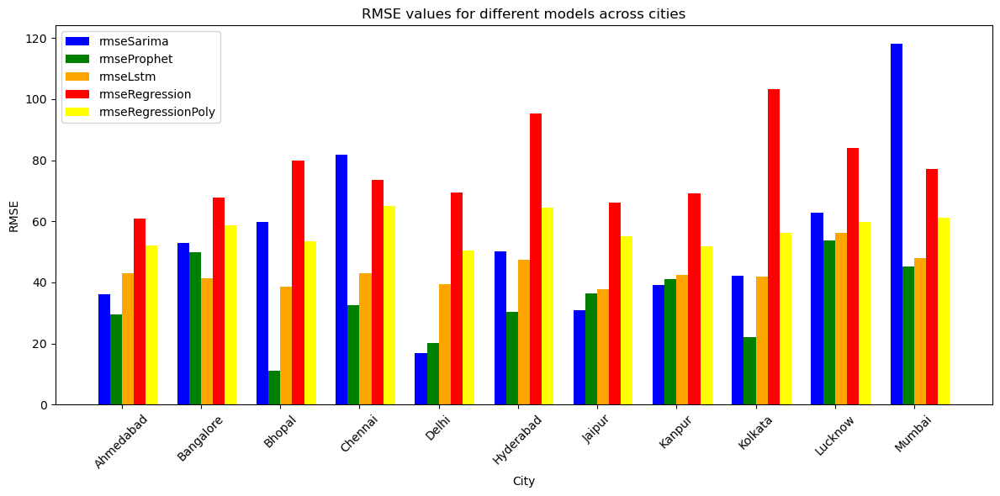

In [29]:
df=df_rm[['city', 'rmseSarima', 'rmseProphet', 'rmseLstm', 'rmseRegression','rmseRegressionPoly']]
df.set_index('city', inplace=True)

# Transpose the DataFrame for better visualization
df = df.transpose()

# Plotting
plt.figure(figsize=(12, 6))

# Define colors for each model
colors = {'rmseSarima': 'blue', 'rmseProphet': 'green', 'rmseLstm': 'orange', 'rmseRegression': 'red','rmseRegressionPoly':'yellow'}
bar_width = 0.15

# Define the x locations for the groups
x = range(len(df.columns))

# Create bars for each model
for i, (model, color) in enumerate(colors.items()):
    plt.bar([p + i * bar_width for p in x], df.loc[model], width=bar_width, color=color, label=model)

# Adding labels and title
plt.xlabel('City')
plt.ylabel('RMSE')
plt.title('RMSE values for different models across cities')
plt.xticks([p + 1.5 * bar_width for p in x], df.columns, rotation=45)

# Add legend
plt.legend()

# Adjust layout for better fit
plt.tight_layout()

# Show plot
plt.show()

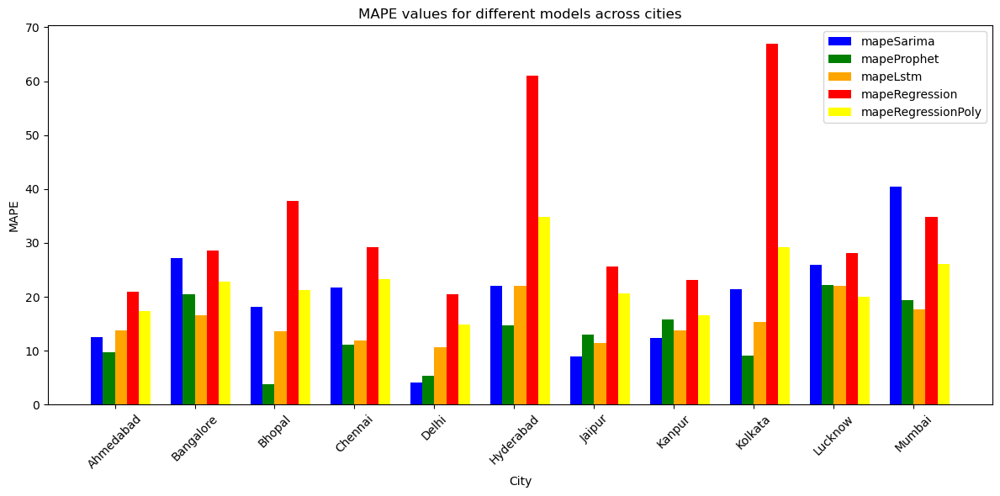

In [30]:
df=df_m[['city', 'mapeSarima', 'mapeProphet', 'mapeLstm', 'mapeRegression','mapeRegressionPoly']]
df.set_index('city', inplace=True)

# Transpose the DataFrame for better visualization
df = df.transpose()

# Plotting
plt.figure(figsize=(12, 6))

# Define colors for each model
colors = {'mapeSarima': 'blue', 'mapeProphet': 'green', 'mapeLstm': 'orange', 'mapeRegression': 'red','mapeRegressionPoly':'yellow'}
bar_width = 0.15

# Define the x locations for the groups
x = range(len(df.columns))

# Create bars for each model
for i, (model, color) in enumerate(colors.items()):
    plt.bar([p + i * bar_width for p in x], df.loc[model], width=bar_width, color=color, label=model)

# Adding labels and title
plt.xlabel('City')
plt.ylabel('MAPE')
plt.title('MAPE values for different models across cities')
plt.xticks([p + 1.5 * bar_width for p in x], df.columns, rotation=45)

# Add legend
plt.legend()

# Adjust layout for better fit
plt.tight_layout()

# Show plot
plt.show()

In [31]:
df

city,Ahmedabad,Bangalore,Bhopal,Chennai,Delhi,Hyderabad,Jaipur,Kanpur,Kolkata,Lucknow,Mumbai
mapeSarima,12.540213,27.136686,18.165154,21.658895,4.144283,21.988447,8.908063,12.340411,21.410926,25.871165,40.445212
mapeProphet,9.783675,20.511977,3.852064,11.153860,5.387231,14.762300,12.977305,15.790815,9.064622,22.131251,19.316621
mapeLstm,13.703734,16.576269,13.635481,11.948050,10.659843,22.013415,11.383799,13.747280,15.365751,22.035403,17.726695
mapeRegression,20.948198,28.640488,37.774944,29.237347,20.505883,61.050024,25.627918,23.204604,66.969815,28.085088,34.862393
mapeRegressionPoly,17.284012,22.816939,21.301507,23.245525,14.838590,34.744558,20.603514,16.570039,29.266996,19.947178,26.058202


In [32]:


# Find the best model for each city
df_m['bestModel'] = df_m[['mapeSarima', 'mapeProphet', 'mapeLstm', 'mapeRegression','mapeRegressionPoly']].idxmin(axis=1)

# Find the overall best model across all cities
overall_best_model = df_m[['mapeSarima', 'mapeProphet', 'mapeLstm', 'mapeRegression','mapeRegressionPoly']].mean().idxmin()

print( df_m[['mapeSarima', 'mapeProphet', 'mapeLstm', 'mapeRegression','mapeRegressionPoly']].mean())
print(f'The overall best model is: {overall_best_model}')

mapeSarima            19.509950
mapeProphet           13.157429
mapeLstm              15.345065
mapeRegression        34.264246
mapeRegressionPoly    22.425187
dtype: float64
The overall best model is: mapeProphet
